In [1]:
from sklearn.preprocessing import OneHotEncoder
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from mpl_toolkits import mplot3d
import os
from pprint import pprint
from scipy.interpolate import griddata
from pylab import * # For adjusting frame width only
os.getcwd()
import sklearn.gaussian_process as gp 
import sklearn.model_selection as ms
from sklearn.svm import SVR, SVC
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.ensemble import GradientBoostingRegressor, GradientBoostingClassifier
from sklearn.model_selection import cross_validate
from sklearn.linear_model import Lasso, LogisticRegression
from sklearn.utils import shuffle
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge 
from sklearn.model_selection import KFold
from sklearn.preprocessing import scale
from sklearn.neural_network import MLPRegressor, MLPClassifier
from sklearn import svm
%matplotlib inline
import math
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import normalize
from sklearn.metrics import accuracy_score
from sklearn.decomposition import PCA
import chardet
from sklearn import metrics
from sklearn.inspection import permutation_importance
from sklearn.model_selection import cross_val_score
from sklearn import preprocessing
from sklearn.model_selection import RepeatedKFold

In [2]:
'''
Make frame thicker, make tick pointing inside, make tick thicker
default frame width is 2, default tick width is 1.5
'''
def frame_tick(frame_width = 2, tick_width = 1.5):
    ax = gca()
    for axis in ['top','bottom','left','right']:
        ax.spines[axis].set_linewidth(frame_width)
    plt.tick_params(direction = 'in', 
                    width = tick_width)

'''
legend:
default location : upper left
default fontsize: 8
Frame is always off
'''
def legend(location = 'upper left', fontsize = 8):
    plt.legend(loc = location, fontsize = fontsize, frameon = False)
    
'''
savefig:
bbox_inches is always tight
'''
def savefig(filename):
    plt.savefig(filename, bbox_inches = 'tight')
    
dpi = 300

In [44]:
print("Current directory: ", os.getcwd())

csv = pd.read_csv('spatter2.csv') 
csv

Current directory:  C:\Users\EZ-TECH.IR\Downloads


,material,power (w),speed (mm/s),layer thickness,beam diameter,density,cp,k,melting point,velocity mean,...,angle std,max angle,min angle,area mean,area std,number mean,number std,total number,Unnamed: 22,paper ID
0,SS316L,200.0,1500.0,40.0,65.0,8000,500,16.30,1688,6.765789,...,28.08984,111.07668,54.89700,NaN,NaN,NaN,NaN,NaN,NaN,spatter 1
1,SS316L,150.0,500.0,40.0,65.0,8000,500,16.30,1688,7.700000,...,26.73765,117.98765,64.51235,NaN,NaN,NaN,NaN,NaN,NaN,spatter 1
2,SS316L,175.0,250.0,40.0,65.0,8000,500,16.30,1688,7.761905,...,27.38641,119.99752,65.22470,NaN,NaN,NaN,NaN,NaN,NaN,spatter 1
3,SS316L,125.0,500.0,40.0,65.0,8000,500,16.30,1688,7.761905,...,26.52813,144.38523,91.32897,NaN,NaN,NaN,NaN,NaN,NaN,spatter 1
4,Invar36,150.0,5.0,NaN,NaN,8050,515,10.15,2000,0.090476,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,spatter 8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104,AlSi10Mg,440.0,1400.0,60.0,80.0,2590,910,110.00,1142,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31
105,AlSi10Mg,296.0,1680.0,60.0,80.0,2590,910,110.00,1142,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31
106,AlSi10Mg,320.0,1680.0,60.0,80.0,2590,910,110.00,1142,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31
107,AlSi10Mg,370.0,1680.0,60.0,80.0,2590,910,110.00,1142,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31


In [45]:
power= csv['power (w)']

speed= csv["speed (mm/s)"]

layer= csv["layer thickness"]

beam= csv["beam diameter"]


material= csv["material"]

velocity= csv["velocity mean"]

angle= csv["angle mean"]

area= csv['area mean']

#spatter_type = csv["spatter type"]

number= csv['number mean']
maxvelocity= csv['max velocity']
minvelocity=csv['min velocity']
print(velocity.max())

10.25758


Text(0, 0.5, 'spatter ejection velocity ($m/s$)')

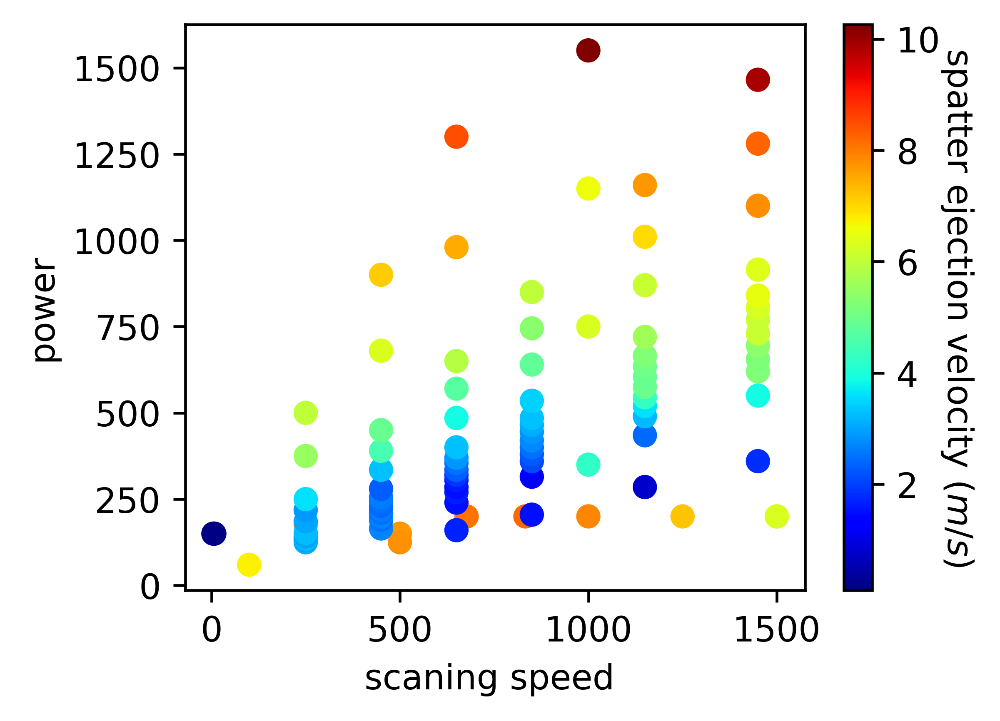

In [46]:
fig = plt.figure(figsize = (4,3), dpi = 600)

#velocity= velocity.dropna()
plt.scatter(speed, power, c= velocity, cmap='jet')
plt.xlabel(r'scaning speed ')
plt.ylabel(r'power')
cbar =plt.colorbar()
cbar.ax.set_ylabel(r'spatter ejection velocity ($m/s$)', rotation=270, labelpad=10)

0      200.0
1      150.0
2      175.0
3      125.0
4      150.0
       ...  
104    440.0
105    296.0
106    320.0
107    370.0
108    440.0
Name: power (w), Length: 109, dtype: float64


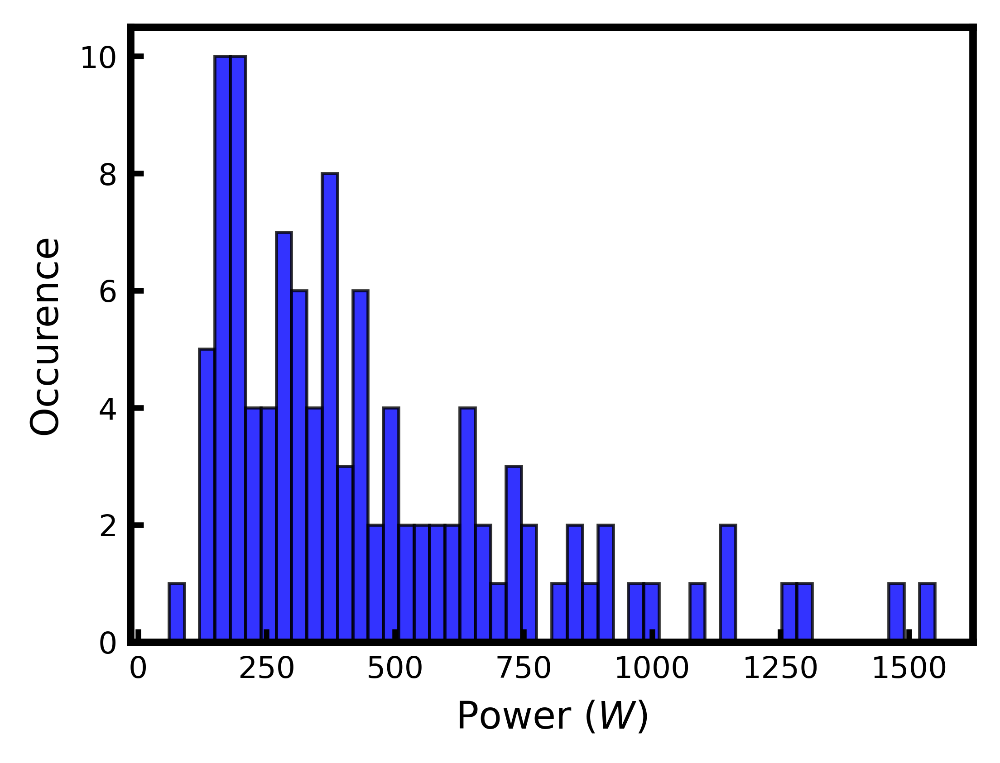

In [47]:
print(power)
fig = plt.figure(figsize = (4,3), dpi = 600)

plt.hist(power, edgecolor = 'k', bins = 50, color='blue', alpha= 0.8, linewidth=0.8)
plt.xticks(fontsize = 8)
plt.yticks(fontsize = 8)
plt.xlabel(r'Power ($W$)')
plt.ylabel(r'Occurence')
#plt.xlim(-100,2000)
frame_tick()

0      1500.0
1       500.0
2       250.0
3       500.0
4         5.0
        ...  
104    1400.0
105    1680.0
106    1680.0
107    1680.0
108    1680.0
Name: speed (mm/s), Length: 109, dtype: float64


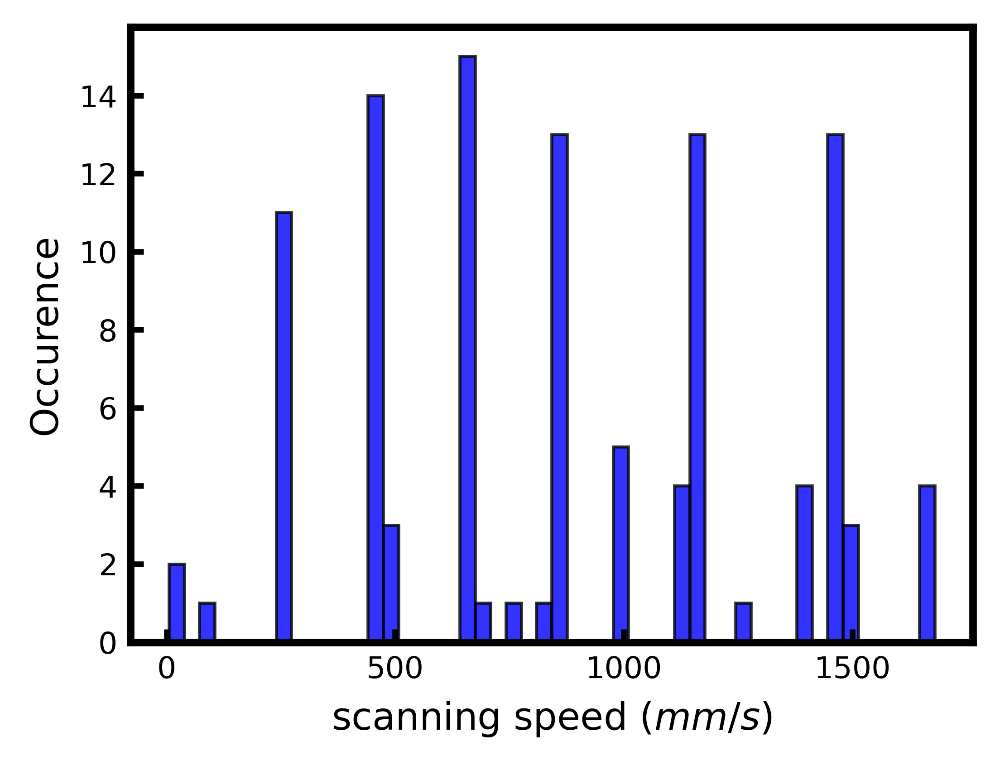

In [48]:
print(speed)
fig = plt.figure(figsize = (4,3), dpi = 600)

plt.hist(speed, edgecolor = 'k', bins = 50, color='blue', alpha= 0.8, linewidth=0.8)
plt.xticks(fontsize = 8)
plt.yticks(fontsize = 8)
plt.xlabel(r'scanning speed ($mm/s$)')
plt.ylabel(r'Occurence')
#plt.xlim(-100,2200)
frame_tick()

0      1500.0
1       500.0
2       250.0
3       500.0
4         5.0
        ...  
104    1400.0
105    1680.0
106    1680.0
107    1680.0
108    1680.0
Name: speed (mm/s), Length: 109, dtype: float64


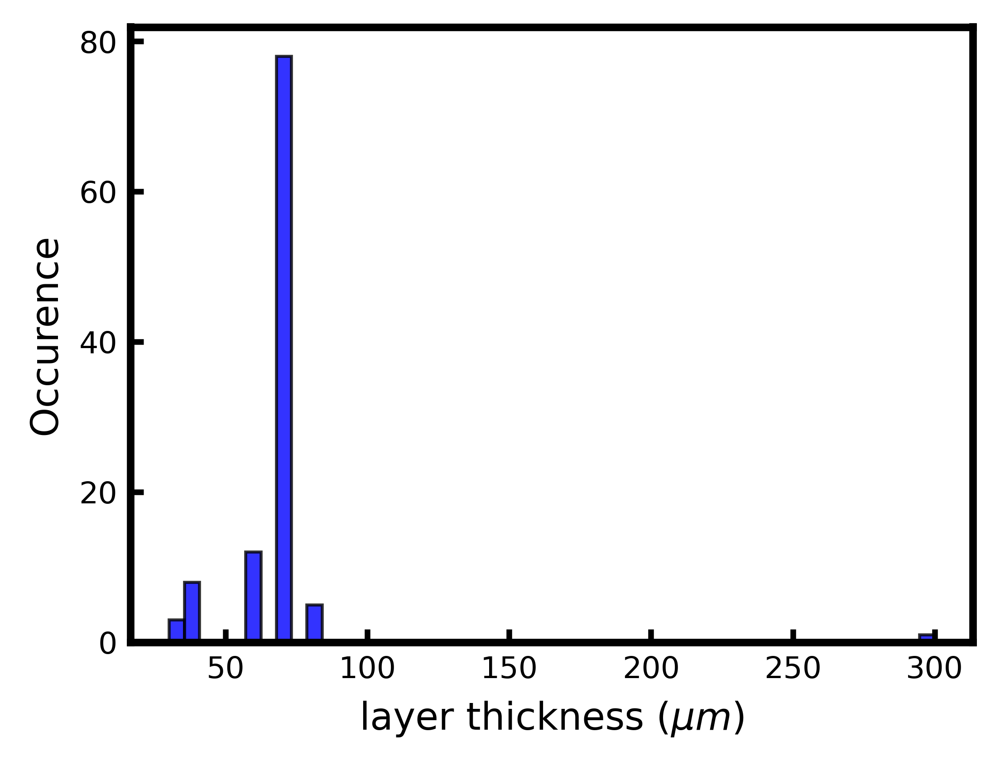

In [49]:
print(speed)
fig = plt.figure(figsize = (4,3), dpi = 600)

plt.hist(layer, edgecolor = 'k', bins = 50, color='blue', alpha= 0.8, linewidth=0.8)
plt.xticks(fontsize = 8)
plt.yticks(fontsize = 8)
plt.xlabel(r'layer thickness ($\mu m$)')
plt.ylabel(r'Occurence')
#plt.xlim(-100,2200)
frame_tick()

0      1500.0
1       500.0
2       250.0
3       500.0
4         5.0
        ...  
104    1400.0
105    1680.0
106    1680.0
107    1680.0
108    1680.0
Name: speed (mm/s), Length: 109, dtype: float64


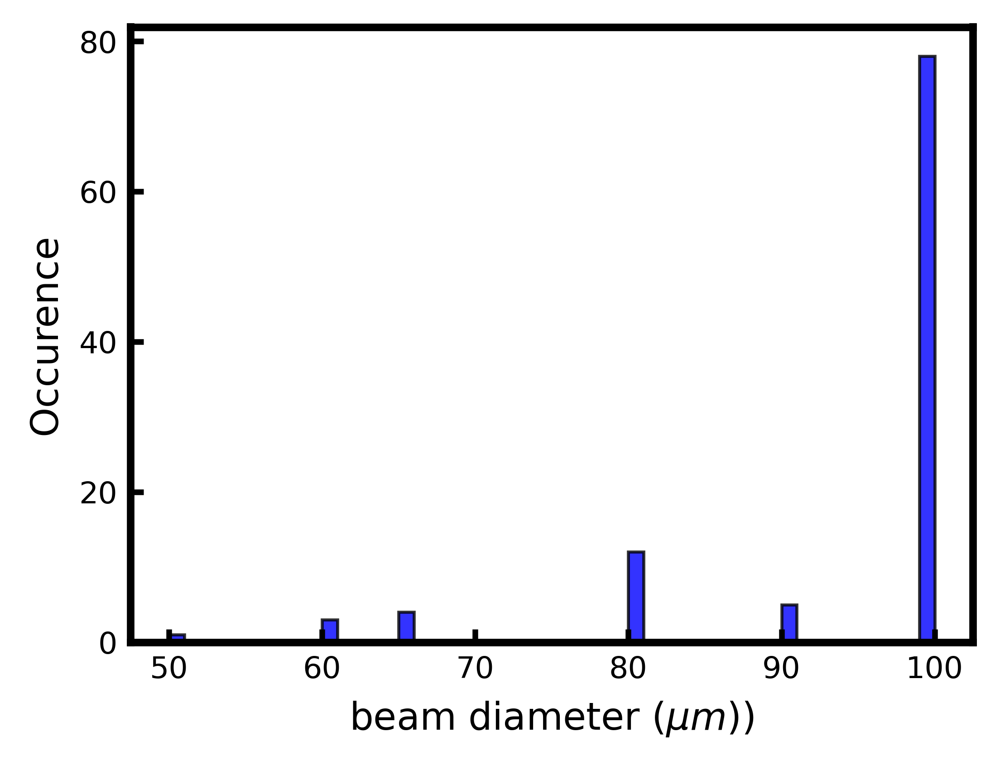

In [50]:
print(speed)
fig = plt.figure(figsize = (4,3), dpi = 600)

plt.hist(beam, edgecolor = 'k', bins = 50, color='blue', alpha= 0.8, linewidth=0.8)
plt.xticks(fontsize = 8)
plt.yticks(fontsize = 8)
plt.xlabel(r'beam diameter ($\mu m$))')
plt.ylabel(r'Occurence')
#plt.xlim(-100,2200)
frame_tick()

0      1500.0
1       500.0
2       250.0
3       500.0
4         5.0
        ...  
104    1400.0
105    1680.0
106    1680.0
107    1680.0
108    1680.0
Name: speed (mm/s), Length: 109, dtype: float64


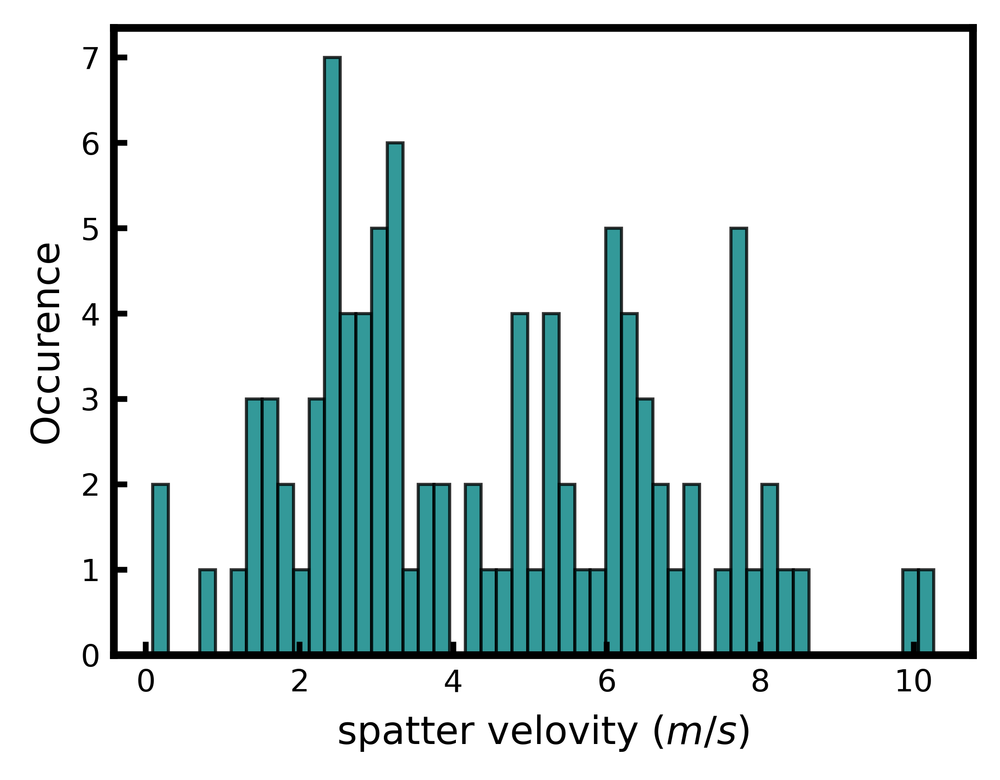

In [51]:
print(speed)
fig = plt.figure(figsize = (4,3), dpi = 600)

plt.hist(velocity, edgecolor = 'k', bins = 50, color='teal', alpha= 0.8, linewidth=0.8)
plt.xticks(fontsize = 8)
plt.yticks(fontsize = 8)
plt.xlabel(r'spatter velovity ($m/s$)')
plt.ylabel(r'Occurence')
#plt.xlim(-100,2200)
frame_tick()

0      1500.0
1       500.0
2       250.0
3       500.0
4         5.0
        ...  
104    1400.0
105    1680.0
106    1680.0
107    1680.0
108    1680.0
Name: speed (mm/s), Length: 109, dtype: float64


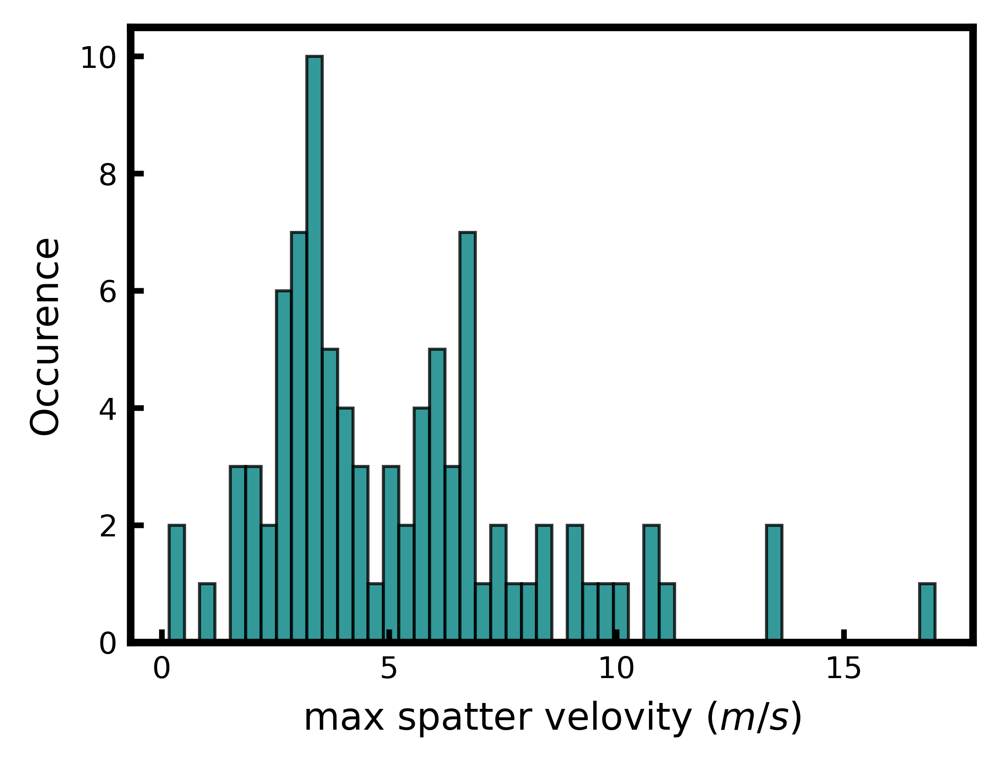

In [52]:
print(speed)
fig = plt.figure(figsize = (4,3), dpi = 600)

plt.hist(maxvelocity, edgecolor = 'k', bins = 50, color='teal', alpha= 0.8, linewidth=0.8)
plt.xticks(fontsize = 8)
plt.yticks(fontsize = 8)
plt.xlabel(r'max spatter velovity ($m/s$)')
plt.ylabel(r'Occurence')
#plt.xlim(-100,2200)
frame_tick()

0      1500.0
1       500.0
2       250.0
3       500.0
4         5.0
        ...  
104    1400.0
105    1680.0
106    1680.0
107    1680.0
108    1680.0
Name: speed (mm/s), Length: 109, dtype: float64


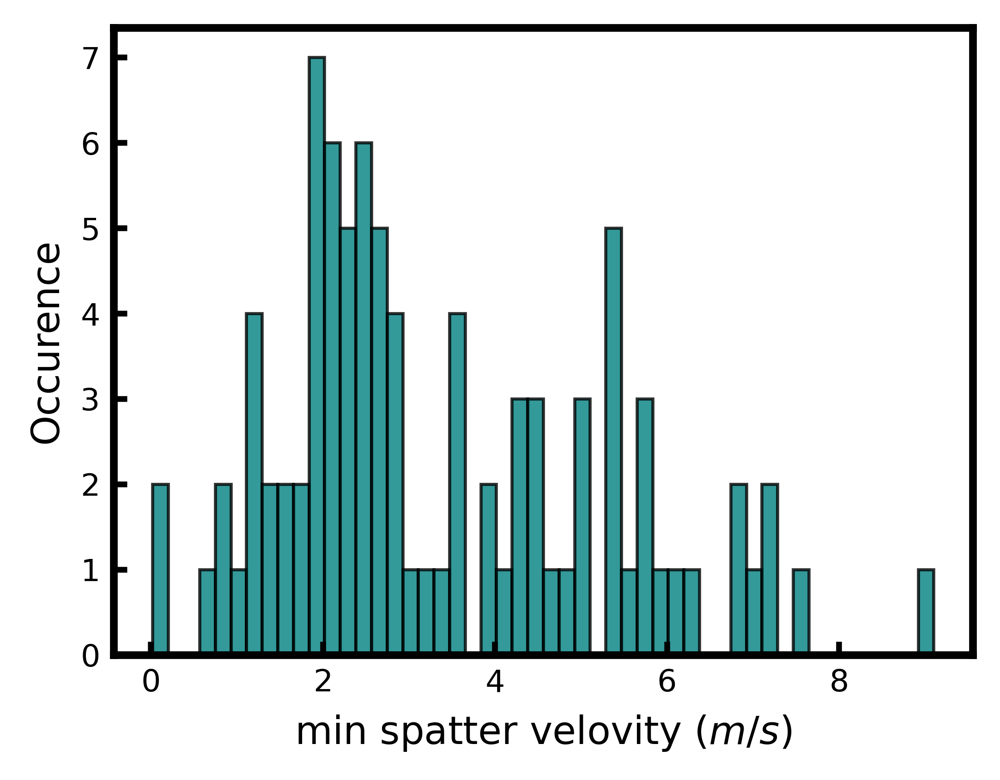

In [53]:
print(speed)
fig = plt.figure(figsize = (4,3), dpi = 600)

plt.hist(minvelocity, edgecolor = 'k', bins = 50, color='teal', alpha= 0.8, linewidth=0.8)
plt.xticks(fontsize = 8)
plt.yticks(fontsize = 8)
plt.xlabel(r'min spatter velovity ($m/s$)')
plt.ylabel(r'Occurence')
#plt.xlim(-100,2200)
frame_tick()

0      1500.0
1       500.0
2       250.0
3       500.0
4         5.0
        ...  
104    1400.0
105    1680.0
106    1680.0
107    1680.0
108    1680.0
Name: speed (mm/s), Length: 109, dtype: float64


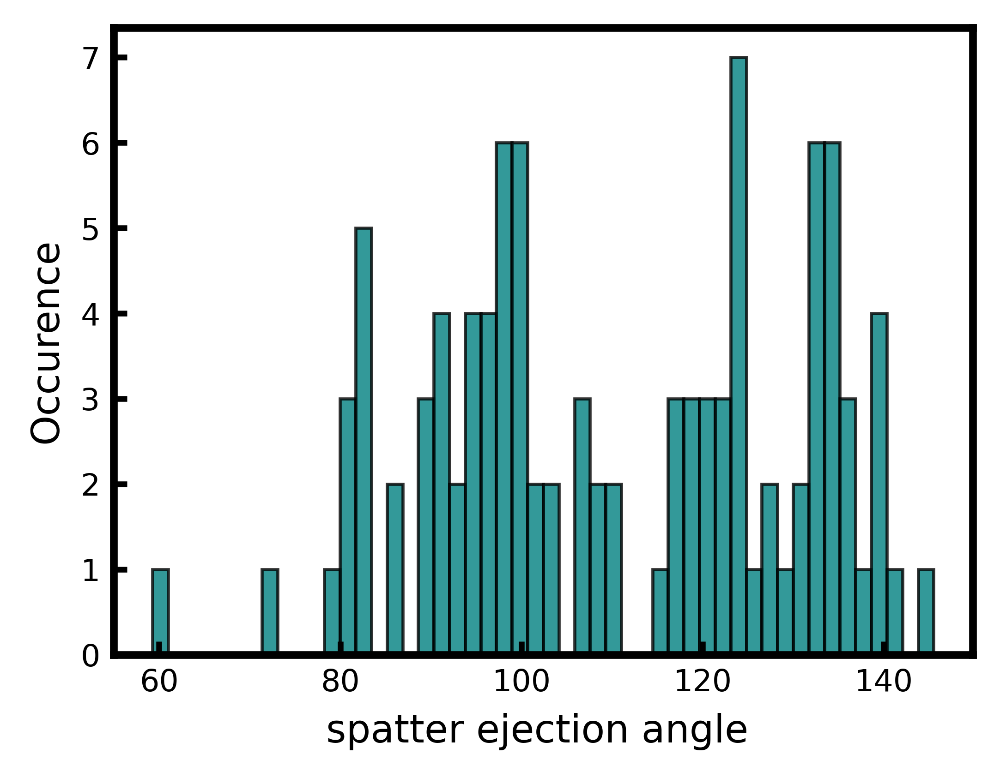

In [54]:
print(speed)
fig = plt.figure(figsize = (4,3), dpi = 600)

plt.hist(angle, edgecolor = 'k', bins = 50, color='teal', alpha= 0.8, linewidth=0.8)
plt.xticks(fontsize = 8)
plt.yticks(fontsize = 8)
plt.xlabel(r'spatter ejection angle ')
plt.ylabel(r'Occurence')
#plt.xlim(-100,2200)
frame_tick()

0      1500.0
1       500.0
2       250.0
3       500.0
4         5.0
        ...  
104    1400.0
105    1680.0
106    1680.0
107    1680.0
108    1680.0
Name: speed (mm/s), Length: 109, dtype: float64


C:\Users\EZ-TECH.IR\anaconda3\New folder\lib\site-packages\matplotlib\axes\_axes.py:6628: RuntimeWarning: All-NaN slice encountered
  xmin = min(xmin, np.nanmin(xi))
C:\Users\EZ-TECH.IR\anaconda3\New folder\lib\site-packages\matplotlib\axes\_axes.py:6629: RuntimeWarning: All-NaN slice encountered
  xmax = max(xmax, np.nanmax(xi))


ValueError: autodetected range of [nan, nan] is not finite

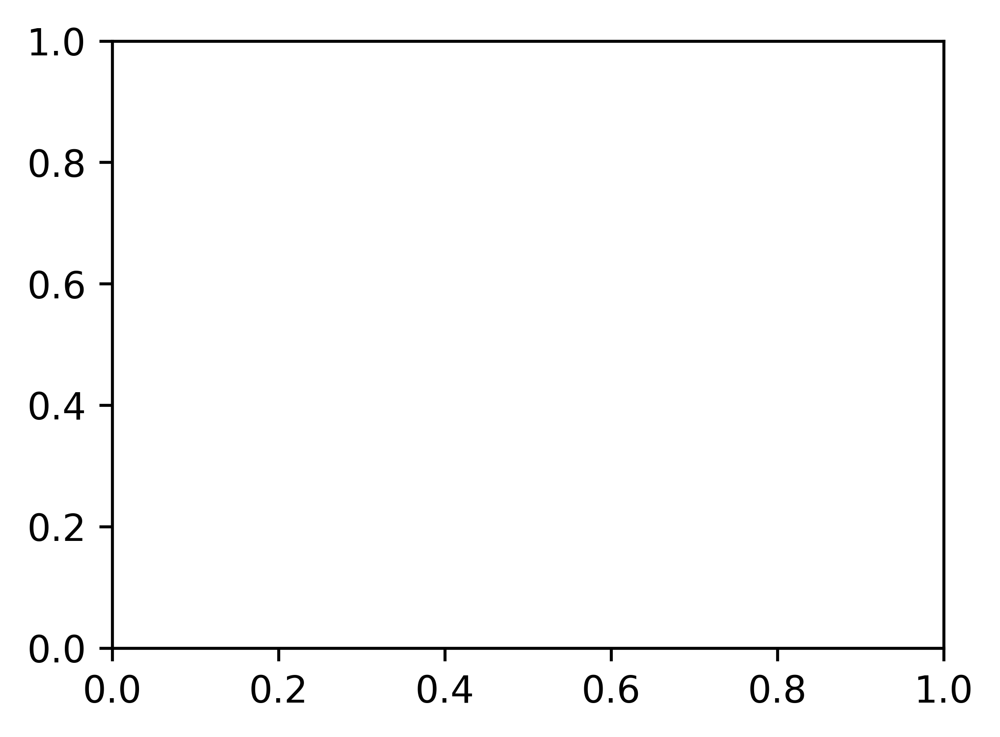

In [55]:
print(speed)
fig = plt.figure(figsize = (4,3), dpi = 600)

plt.hist(area, edgecolor = 'k', bins = 50, color='teal', alpha= 0.8, linewidth=0.8)
plt.xticks(fontsize = 8)
plt.yticks(fontsize = 8)
plt.xlabel(r'spatter area ($\mu ^2$)')
plt.ylabel(r'Occurence')
#plt.xlim(-100,2200)
frame_tick()

0      1500.0
1       500.0
2       250.0
3       500.0
4         5.0
        ...  
104    1400.0
105    1680.0
106    1680.0
107    1680.0
108    1680.0
Name: speed (mm/s), Length: 109, dtype: float64


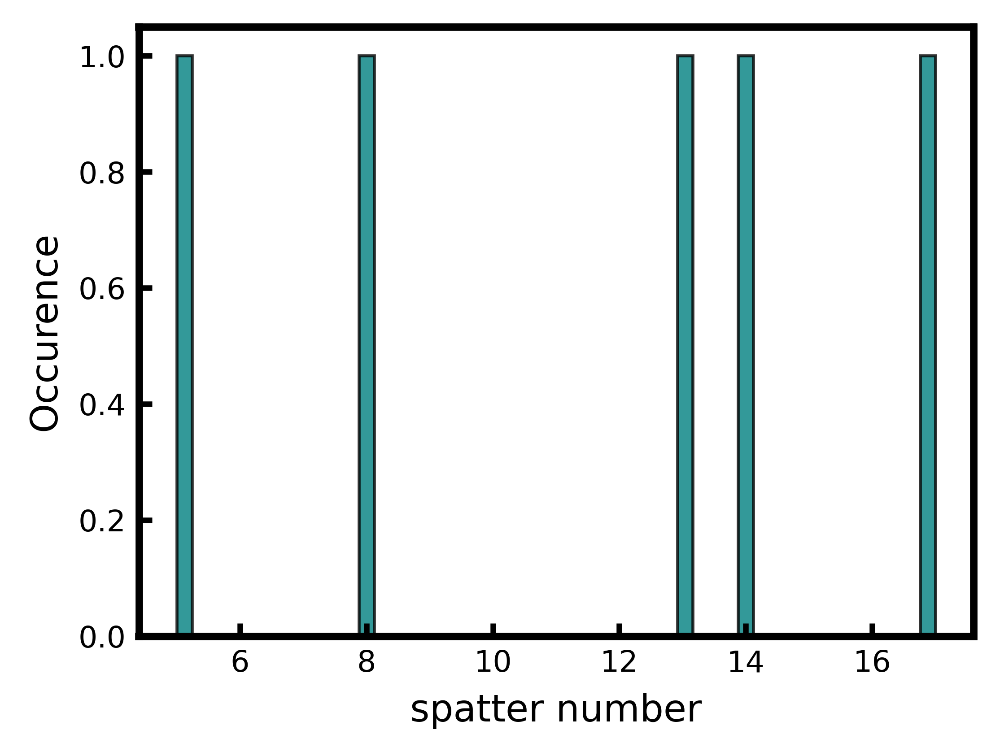

In [56]:
print(speed)
fig = plt.figure(figsize = (4,3), dpi = 600)

plt.hist(number, edgecolor = 'k', bins = 50, color='teal', alpha= 0.8, linewidth=0.8)
plt.xticks(fontsize = 8)
plt.yticks(fontsize = 8)
plt.xlabel(r'spatter number')
plt.ylabel(r'Occurence')
#plt.xlim(-100,2200)
frame_tick()

###

materials
 SS316L      136
AlSi10Mg     12
In718         4
Invar36       1
Name: material, dtype: int64
4
materials
 SS316L      136
AlSi10Mg     12
In718         4
Invar36       1
Name: material, dtype: int64
[0 1 2 3]


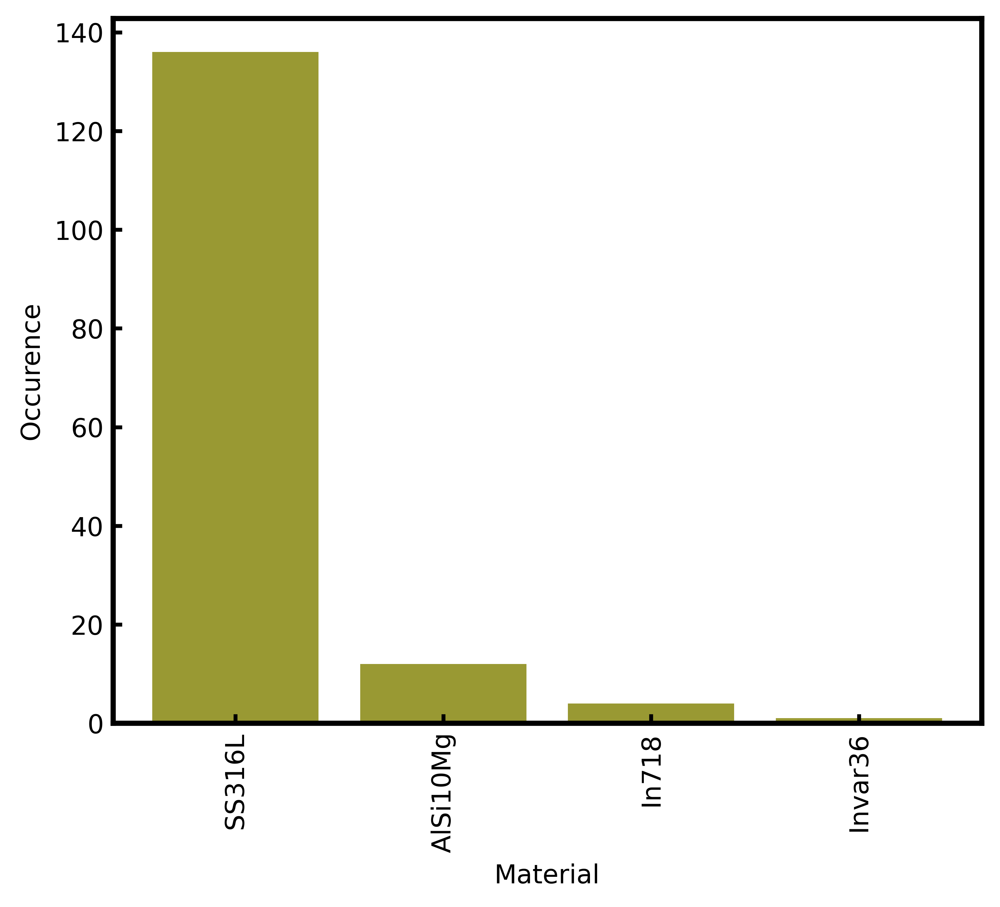

In [26]:
fig = plt.figure(figsize = (6,5), dpi = 600)


materials = csv['material'].value_counts()
print('materials\n',materials)

dir(materials)
materials.keys()
print(len(materials))
print('materials\n',materials)

y_pos = np.arange(len(materials.keys()))
y_pos_str = np.array([key for key  in materials.keys()], dtype = 'object')
print(y_pos)

#plt.bar(y_pos, materials)

plt.xticks(y_pos, y_pos_str, fontsize = 10, rotation=90)
plt.bar(y_pos, materials,  color = 'olive', alpha = 0.8)

plt.ylabel("Occurence")
plt.xlabel("Material")
frame_tick()

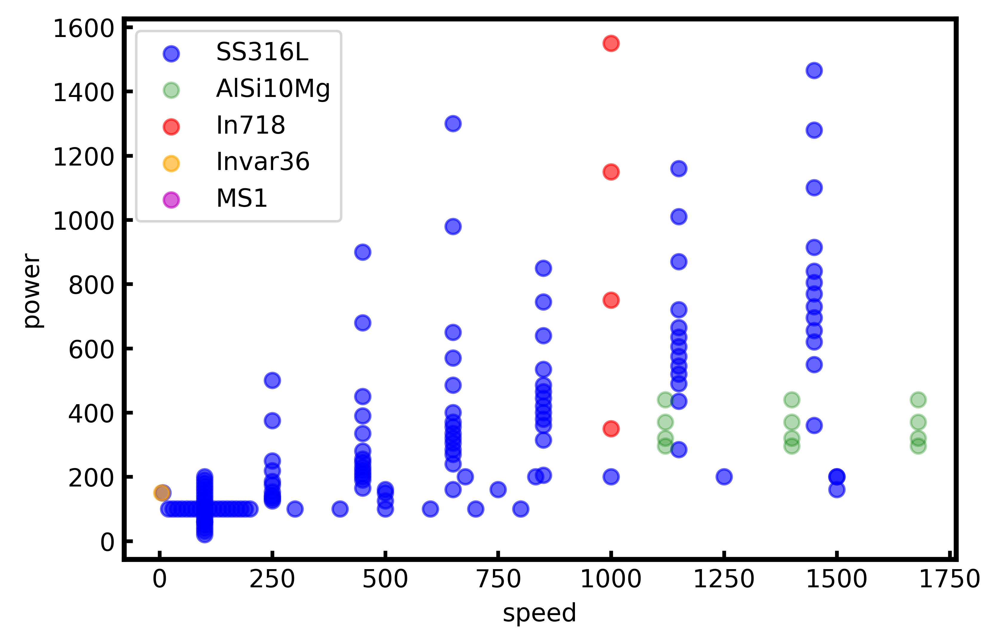

In [27]:
fig = plt.figure(figsize=(6,4), dpi = 600)

plt.scatter(speed[material =="SS316L"], power[material=="SS316L"],  color="blue", label="SS316L", alpha=0.6)
plt.scatter(speed[material =="AlSi10Mg"], power[material=="AlSi10Mg"], color="green", label="AlSi10Mg", alpha=0.3)
plt.scatter(speed[material =="In718"], power[material=="In718"], color="red", label="In718", alpha=0.6)
plt.scatter(speed[material =="Invar36"], power[material=="Invar36"], color="orange", label="Invar36", alpha=0.6)
plt.scatter(speed[material =="MS1"], power[material=="MS1"], color="m", label="MS1", alpha=0.6)

plt.xlabel("speed")
plt.ylabel("power")
plt.legend()
frame_tick()

In [28]:
# Examine distribution of features
for col in csv.columns:
    values = csv[col]
    num_present = len([value for value in values if not pd.isnull(value)])
    total = len(values)
    parameter = col
    print('for '+ parameter + ' we have'+ ' {:.1f} '.format(num_present) + 'data')
    print('{:.1f} % samples has '.format(100*num_present/total) + parameter + ' value\n')

for material we have 153.0 data
100.0 % samples has material value

for power (w) we have 153.0 data
100.0 % samples has power (w) value

for speed (mm/s) we have 153.0 data
100.0 % samples has speed (mm/s) value

for layer thickness we have 151.0 data
98.7 % samples has layer thickness value

for beam diameter we have 147.0 data
96.1 % samples has beam diameter value

for density we have 153.0 data
100.0 % samples has density value

for cp we have 153.0 data
100.0 % samples has cp value

for k we have 153.0 data
100.0 % samples has k value

for melting point we have 153.0 data
100.0 % samples has melting point value

for velocity mean we have 94.0 data
61.4 % samples has velocity mean value

for velocity std we have 89.0 data
58.2 % samples has velocity std value

for angle mean we have 145.0 data
94.8 % samples has angle mean value

for angle std we have 133.0 data
86.9 % samples has angle std value

for area mean we have 44.0 data
28.8 % samples has area mean value

for area std we 

In [4]:
# select subset of data containing material, process, etc
# select_subset generalizes this for any feature
def select_material(csv, material):
    material_csv = csv.loc[csv['Material'] == material]

    return material_csv

def select_process(csv, process):
    process_csv = csv.loc[csv['Process'] == process]
    return process_csv
def select_subset(csv, feature, value):
    select_csv = csv.loc[csv[feature] == value]
    return select_csv


def select_parameters(csv, parameter_list, label_col):
    '''
    Select data with valid values for each parameter in parameter_list, and
    select the feature in label_col as the prediction feature
    
    Arguments:
    new_csv: data csv to be processed (Pandas DataFrame)
    parameter_list: list of strings corresponding to feature names
    label_col: string corresponding to feature name
    
    Returns:
    X: n x m numpy array of data features with n samples and m features
    y: n x 1 numpy array of data labels
    '''
    data_list = []
    label_list = []
    for i in range(len(csv)):
        success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
        if success < 0:
          #  print("CONTINUE")
            continue
        else:
            data_list.append(features)
            label_list.append(label)
    X = np.array(np.squeeze(data_list))  
    
    y = np.array(label_list)
    print(X.shape)
    return(X, y)

def extract_features(data_point, parameters, label):
    '''
    Given a sample in the dataset, determine if it has all of the features listed in parameters and a valid label
    If it does, return the data point as a single sample, if not, return -1
    
    Arguments:
    data_point: row of Pandas DataFrame
    parameters: list of strings
    label: string
    
    Returns:
    success: -1 if not all parameters found, 1 if all parameters found
    features: list of floats if all parameters found
    data_point[label]: float corresponding to the label of the datapoint
    '''
    
    features = []
    success = 0
    for parameter in parameters:
        if pd.isnull(data_point[parameter]) or pd.isnull(data_point[label]):
            success = -1
            return success, features, data_point[label]
        else:
            success = 1
            try:
                features.append(float(data_point[parameter]))
            except:
                success = -1
                return success, features, data_point[label]
    return success, features, data_point[label]
        
    

## K FOLD RF

In [5]:
%matplotlib inline 

def learn(data, depth, material = None, parameters = None, title = None, plot = False, paper_ID= None):
    
    '''
    
    
    Iterate over the models, performing training/cross-validation and plotting regression results

    
    Arguments:
    data: Matrix array of data, n samples x m features, numpy array
    depth: vector of depth values, n samples x 1 feature, numpy array
    
    (Optional, only displayed on figure)
    material: Material that is trained on (string)
    parameters: parameters contained in data (list of strings)
    title: Any additional information (e.g. process, paper ID) to be specified (string)
    plot: Whether to produce plots
    
    Returns:
    fit_models: List of fit models
    train_accuracy: List of CV Pearson R^2
    train_accuracy_std: List of standard deviation of Pearson R^2
    test_accuracy: List of test Pearson R^2
    test_accuracy_std: List of standard deviation of Pearson R^2
   
    
    
    '''
    
    labels = depth

    params = { #'font.family'      : 'serif',
               'font.size'        : 12,
               'xtick.labelsize'  : 'small',
               'ytick.labelsize'  : 'small',
               #'axes.labelsize'   : 'large',
               'axes.linewidth'   : 1.3 }
    plt.rcParams.update(params)


    y  = labels
    X = data
    
    # transpose if shape of label and data do not match
    if len(X) != len(labels):
        X = X.T
        print(len(labels), len(X))
        print('transposed to ' + str(X.shape[0]) + ', ' + str(X.shape[1]))
        

    idx_normalize = len(X[0])

    

    
        
    fit_models = []
    train_accuracy = []
    train_accuracy_std = []
    test_accuracy = []
    test_accuracy_std = []
    
    
    # Iterate over implemented models
    modeltoggle= 'RF'
    model = RandomForestRegressor(n_estimators = 42)



    # Perform cross validation for each model
    kf = KFold(n_splits=5)
    trains = []
    tests = []
    train_maes = []
    test_maes = []
    # Perform cross validation for each model
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    for train, test in kf.split(X_train):


        # Shuffle data points before prediction
        X_shuffle, y_shuffle = shuffle(X_train, y_train, random_state=42)

        X_cv_train = X_shuffle[train]
        X_cv_test = X_shuffle[test]
        y_cv_train = y_shuffle[train]
        y_cv_test = y_shuffle[test]
#     X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
#     for train, test in kf.split(X):

        
#         X_train = X[train]
#         X_test = X[test]
#         y_train = y[train]
#         y_test = y[test]

       

        model.fit(X_cv_train, y_cv_train)

        # Calculate MAE and R^2

        y_predtrain = model.predict(X_cv_train)
        y_predtest = model.predict(X_cv_test)
        trains.append(model.score(X_cv_train, y_cv_train))
        tests.append(model.score(X_cv_test, y_cv_test))



        mae_test = metrics.mean_absolute_error(y_cv_test, y_predtest)
        mae_train = metrics.mean_absolute_error(y_cv_train,y_predtrain)
        train_maes.append(mae_train)
        test_maes.append(mae_test)


    print('trains', trains)
    print('tests', tests)
    # Aggregate information
    trains = np.array(trains)
    tests = np.array(tests)
    train_maes = np.array(train_maes)
    test_maes = np.array(test_maes)
    r2_mean = tests.mean()
    r2_std = tests.std()
    r2_train_mean = trains.mean()
    r2_train_std =  trains.std()



    mae_mean_train = train_maes.mean()
    mae_mean_test = test_maes.mean()

    mae_mean_train_std = train_maes.std()
    mae_mean_test_std = test_maes.std()

    train_accuracy.append(r2_train_mean)
    test_accuracy_std.append(r2_std)
    test_accuracy.append(r2_mean)
    train_accuracy_std.append(r2_train_std)

    print(modeltoggle, ' Train R^2: {:.5f} ± {:.5f}, Test R^2: {:.5f} ± {:.5f}'.
            format( r2_train_mean, r2_train_std, r2_mean, r2_std))

    
    print(modeltoggle, ' Train MAE: {:.5f} ± {:.5f}, Test MAE: {:.5f} ± {:.5f}'.
            format( mae_mean_train,mae_mean_train_std, mae_mean_test, mae_mean_test_std))
        
        
        
    #cv= RepeatedKFold(n_splits=5, n_repeats=5, random_state=1)
#     cv= KFold(n_splits=5, shuffle=True, random_state=42)

#     n_scores= cross_val_score(model, X, y, scoring='r2', cv=cv, n_jobs=-1)
#     print('accuracy: %.5f (%.5f)'% (mean(n_scores), std(n_scores)))
        
    # Plot results: everything scaled back to original values by multiplying by std and adding mean of training labels
    if modeltoggle == 'RF':
        fig = plt.figure(figsize = [4,3], dpi = 600)
        importance = model.feature_importances_
        indices = np.argsort(importance)
        plt.title('RF Feature Importance')
        plt.barh(range(len(indices)), importance[indices], color='rosybrown', align='center')
        plt.yticks(range(len(indices)), [parameter_list[i] for i in indices])
        plt.xlabel('relative importance')
        plt.show()
        #print(importance)
            #plt.barh(parameter_list, model.feature_importances_)

    if plot:
        fig = plt.figure(figsize = [4,3], dpi = 300)
        plt.scatter(y_cv_test, y_predtest, c='seagreen')
        p1= max(max(y_predtest), max(y_cv_test))
        p2= min(min(y_predtest), min(y_cv_test))
        plt.plot([p1,p2], [p1,p2], 'k-')
        plt.title(modeltoggle+ ' test set')
        plt.xlabel("Actual")
        plt.ylabel("Predicted")
        
        fig = plt.figure(figsize = [4,3], dpi = 300)
        plt.scatter(y_cv_train, y_predtrain, c='purple')
        p1= max(max(y_predtrain), max(y_cv_train))
        p2= min(min(y_predtrain), min(y_cv_train))
        plt.plot([p1,p2], [p1,p2], 'k-')
        plt.title(modeltoggle+ ' train set')
        plt.xlabel("Actual")
        plt.ylabel("Predicted")
        
    return fit_models, train_accuracy, train_accuracy_std, test_accuracy, test_accuracy_std 

In [6]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted

parameter_list = ['Power', 'Velocity', 'density', 'Cp', 'k' , 'beam D', 'melting T' , 'layer thickness',  'absorption coefficient','absorption coefficient 2']
label_col = 'depth of meltpool'

# Form dataset array from dataframe, given parameter_list, label_col
# function select_parameters() does this as well

data_list = []
label_list = []

new_csv = select_subset(regressioncsv, 'Sub-process','SLM')
materials_present = []

for i in range(len(new_csv)):
    success, features, label = extract_features(new_csv.iloc[i], parameter_list, label_col)
    #breakpoint()
    if success < 0 or  new_csv['paper ID'].iloc[i] in [34]:
        
        continue
    else:
        
        data_list.append(features)
        label_list.append(label)
        materials_present.append(new_csv['Material'].iloc[i])
    materials_ohe = [np.zeros(len(materials_present)) for key in materials.keys()]
    len(materials_ohe)
    materials_ohe = np.array(materials_ohe).T
    material_pos = np.arange(len(materials.keys()))
    
    for idx in range(len(materials_present)):
        for j_idx in range(len(material_pos)):
            if materials_present[idx] == materials.keys()[j_idx]:

                materials_ohe[idx,j_idx] = 1 
X = np.array(np.squeeze(data_list))  

y = np.array(label_list)
print(len(X), 'length of X')

fit_models, train_accuracy, train_accuracy_std, test_accuracy, test_accuracy_std  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = False, title = 'LPBF')



NameError: name 'materials' is not defined

LEN 88
trains [0.9883266590702952, 0.9902565821085233, 0.9882546675593248, 0.9900605887261207, 0.985839859778084]
tests [0.9346892888761565, 0.9027794163049512, 0.8834963986874556, 0.9652243563660082, 0.8943743702022134]
RF  Train R^2: 0.98855 ± 0.00159, Test R^2: 0.91611 ± 0.02990
RF  Train MAE: 0.16961 ± 0.00915, Test MAE: 0.44857 ± 0.11414


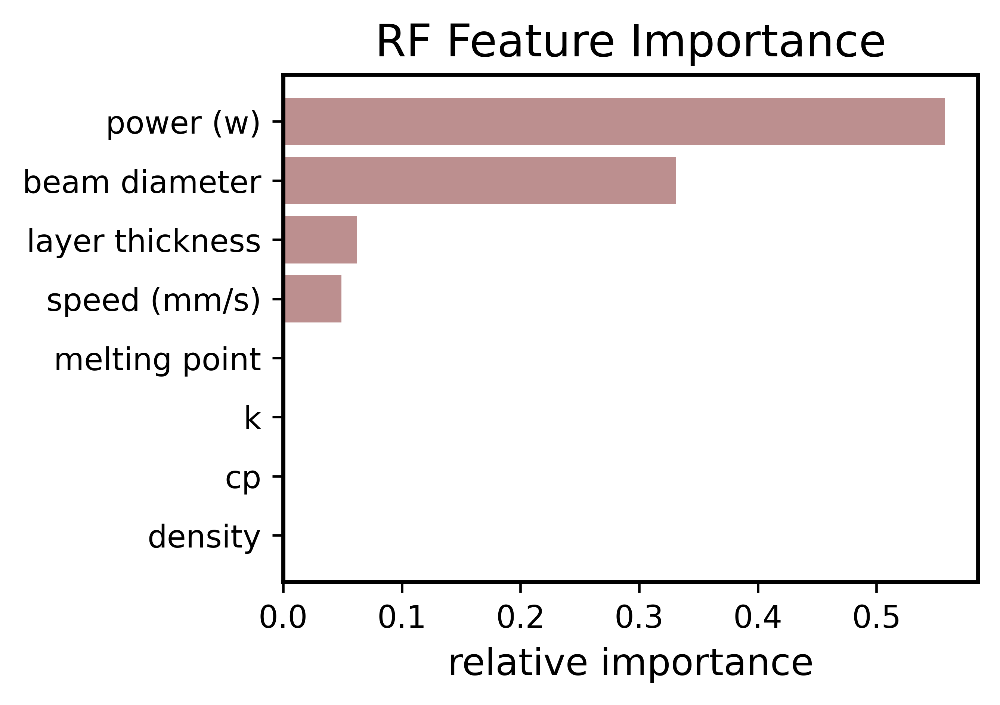

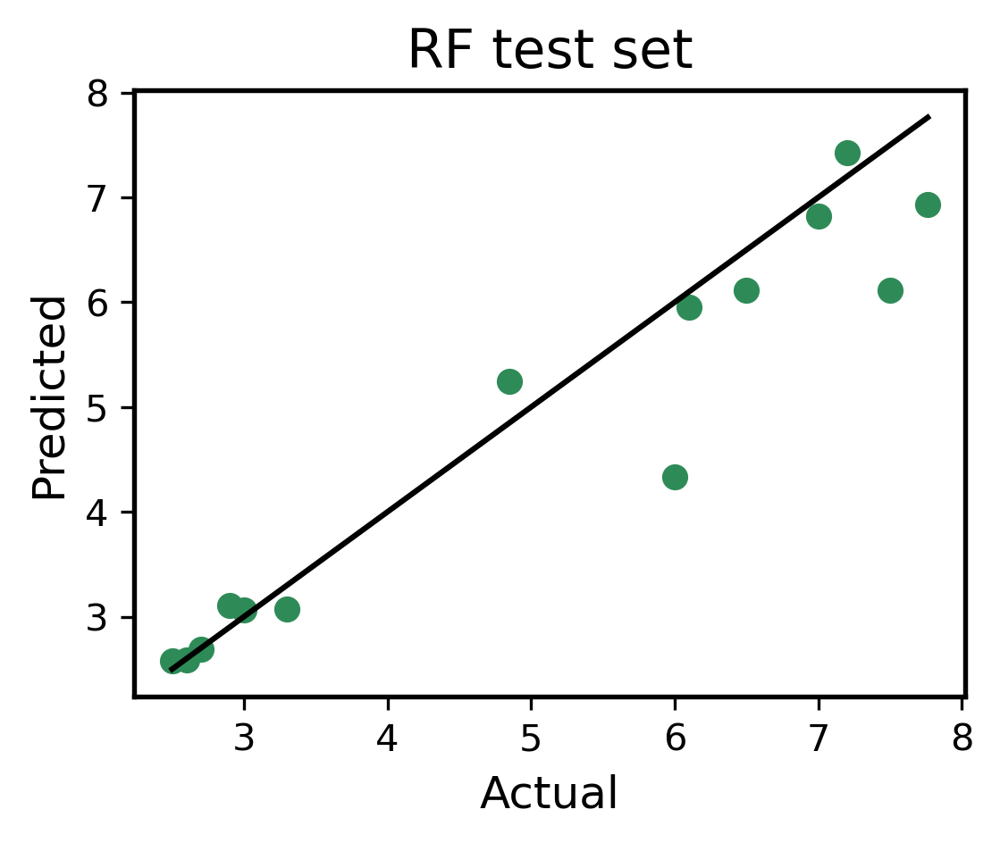

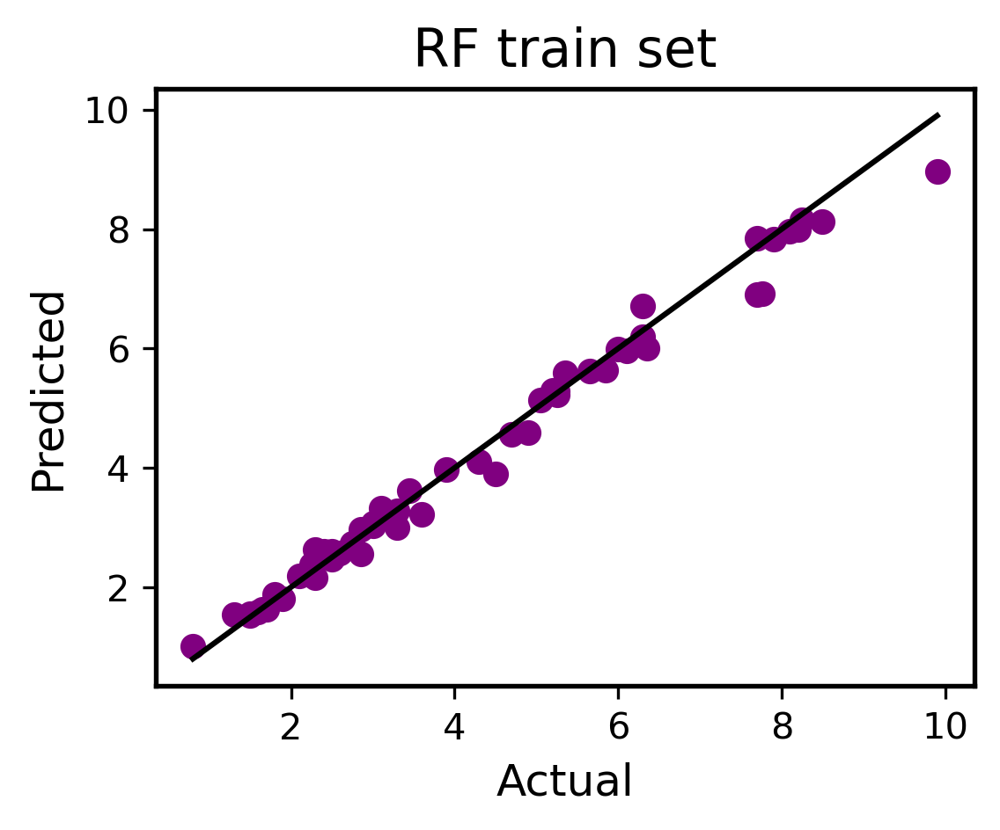

In [66]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'velocity mean'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')




LEN 83
trains [0.9734960624099964, 0.9770552576649514, 0.9695152534927924, 0.9791473592387706, 0.9781142336331902]
tests [0.9065718950375963, 0.9517407921636177, 0.829766678067756, 0.9557901996070409, 0.784229885092317]
RF  Train R^2: 0.97547 ± 0.00353, Test R^2: 0.88562 ± 0.06802
RF  Train MAE: 0.22419 ± 0.01171, Test MAE: 0.55254 ± 0.20510


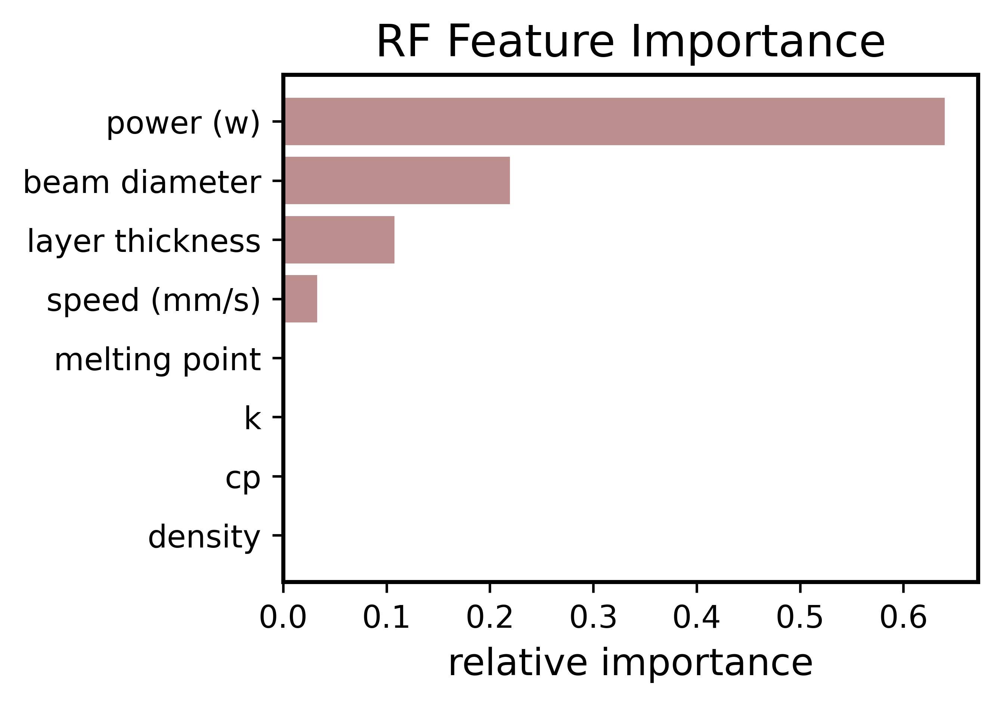

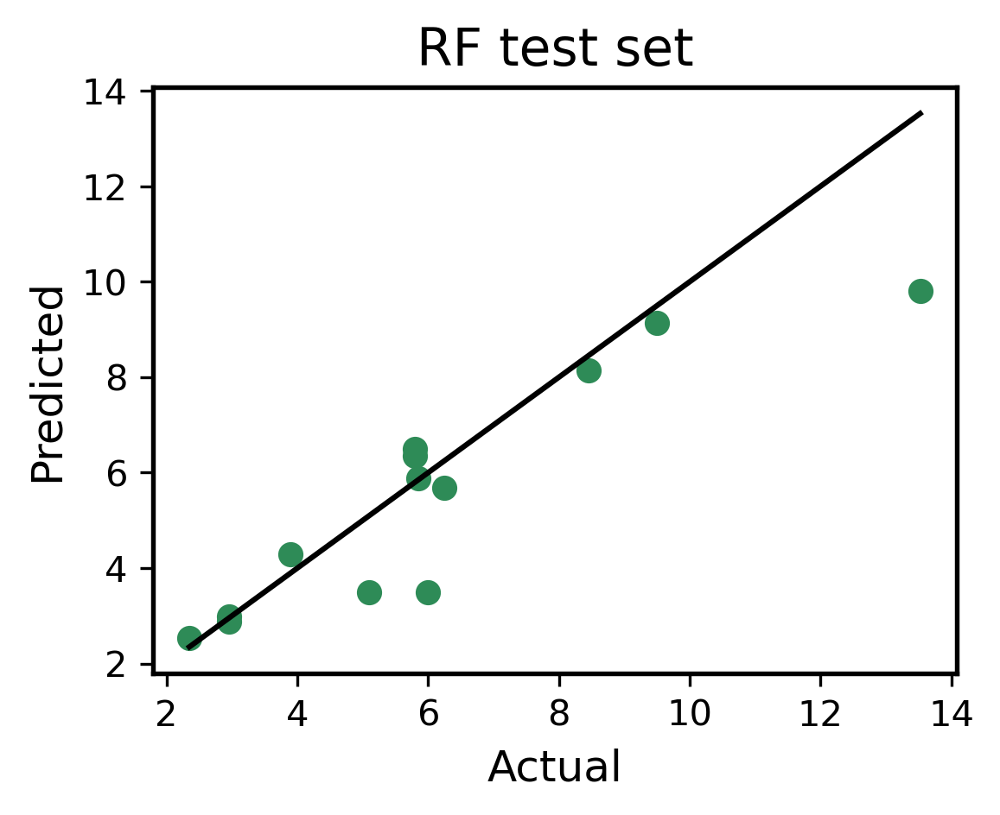

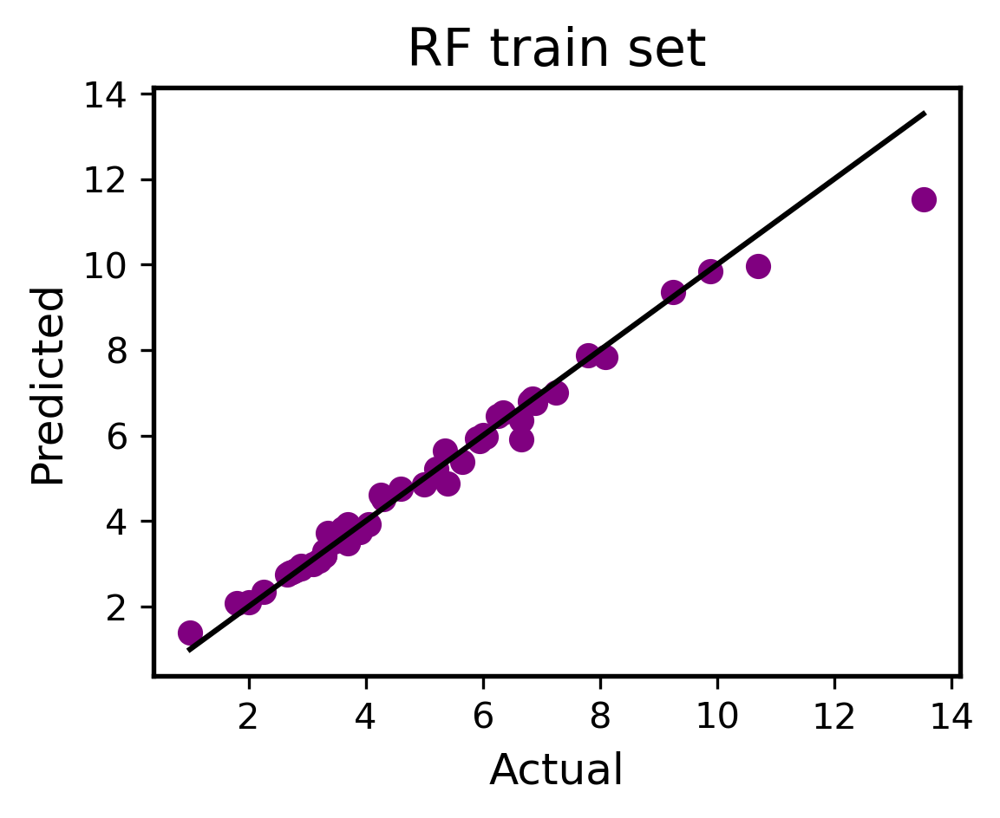

In [67]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'max velocity'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')




LEN 83
trains [0.9879212642021595, 0.9714805825858409, 0.9697786484294234, 0.9612259845672082, 0.9651905491858895]
tests [0.7198937396520366, 0.9109055081281887, 0.7422144716219166, 0.9468044191500034, 0.6600426754681983]
RF  Train R^2: 0.97112 ± 0.00914, Test R^2: 0.79597 ± 0.11235
RF  Train MAE: 0.20127 ± 0.02915, Test MAE: 0.55192 ± 0.19454


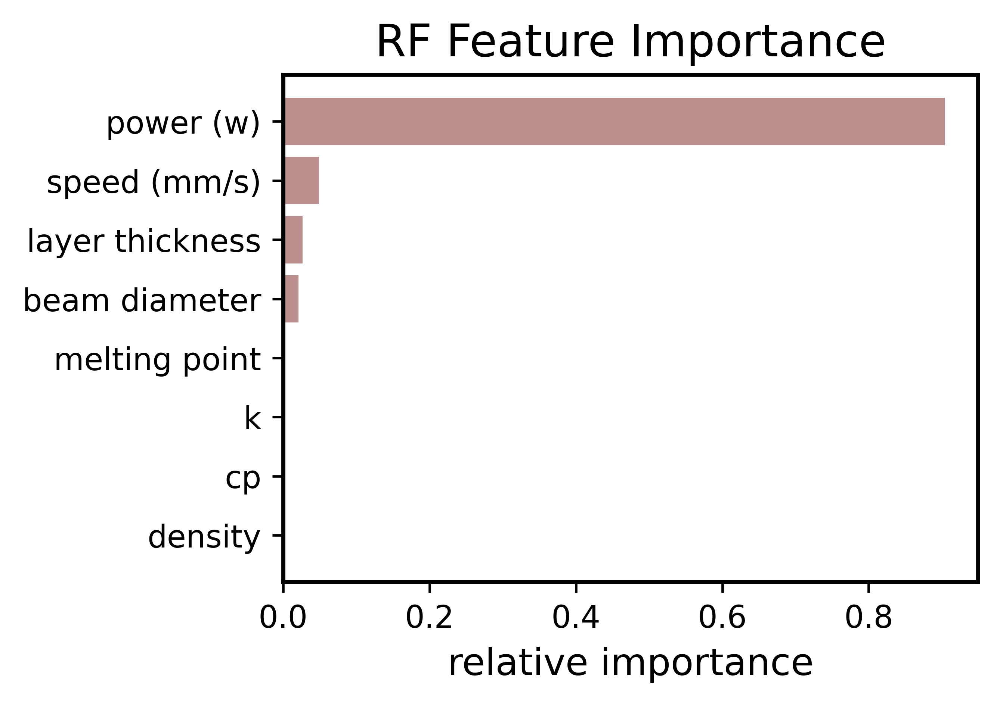

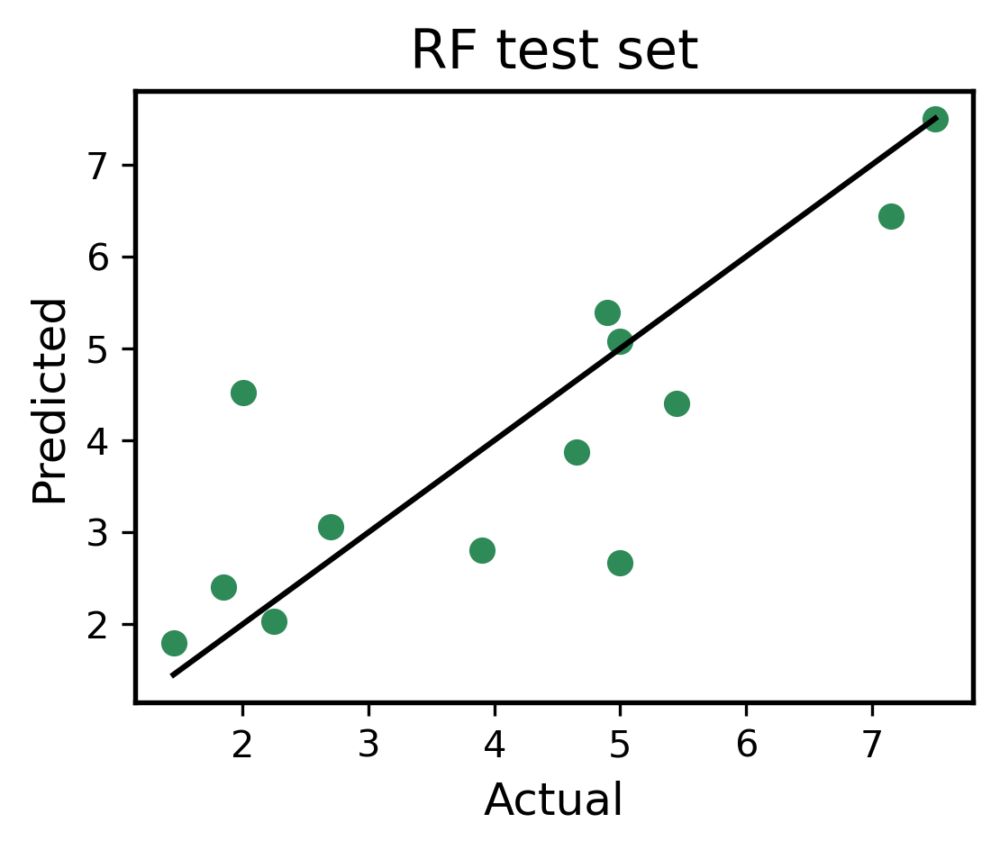

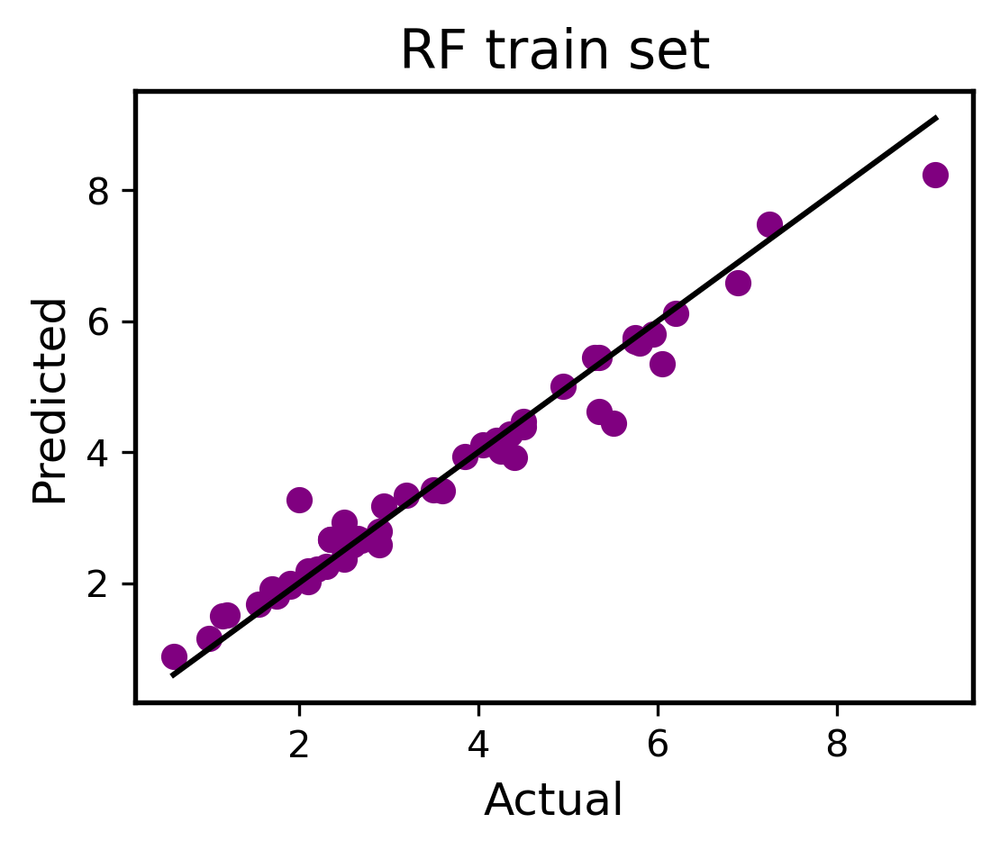

In [68]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'min velocity'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



In [146]:
%matplotlib inline 

def learn(data, depth, material = None, parameters = None, title = None, plot = False, paper_ID= None):
    
    '''
    
    
    Iterate over the models, performing training/cross-validation and plotting regression results

    
    Arguments:
    data: Matrix array of data, n samples x m features, numpy array
    depth: vector of depth values, n samples x 1 feature, numpy array
    
    (Optional, only displayed on figure)
    material: Material that is trained on (string)
    parameters: parameters contained in data (list of strings)
    title: Any additional information (e.g. process, paper ID) to be specified (string)
    plot: Whether to produce plots
    
    Returns:
    fit_models: List of fit models
    train_accuracy: List of CV Pearson R^2
    train_accuracy_std: List of standard deviation of Pearson R^2
    test_accuracy: List of test Pearson R^2
    test_accuracy_std: List of standard deviation of Pearson R^2
   
    
    
    '''
    
    labels = depth

    params = { #'font.family'      : 'serif',
               'font.size'        : 12,
               'xtick.labelsize'  : 'small',
               'ytick.labelsize'  : 'small',
               #'axes.labelsize'   : 'large',
               'axes.linewidth'   : 1.3 }
    plt.rcParams.update(params)


    y  = labels
    X = data
    
    # transpose if shape of label and data do not match
    if len(X) != len(labels):
        X = X.T
        print(len(labels), len(X))
        print('transposed to ' + str(X.shape[0]) + ', ' + str(X.shape[1]))
        

    idx_normalize = len(X[0])

    

    
        
    fit_models = []
    train_accuracy = []
    train_accuracy_std = []
    test_accuracy = []
    test_accuracy_std = []
    
    
    # Iterate over implemented models
    modeltoggle= 'RF'
    model = RandomForestRegressor(n_estimators = 56)



    # Perform cross validation for each model
    kf = KFold(n_splits=5)
    trains = []
    tests = []
    train_maes = []
    test_maes = []
    # Perform cross validation for each model
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    for train, test in kf.split(X_train):


        # Shuffle data points before prediction
        X_shuffle, y_shuffle = shuffle(X_train, y_train, random_state=42)

        X_cv_train = X_shuffle[train]
        X_cv_test = X_shuffle[test]
        y_cv_train = y_shuffle[train]
        y_cv_test = y_shuffle[test]
#     X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
#     for train, test in kf.split(X):

        
#         X_train = X[train]
#         X_test = X[test]
#         y_train = y[train]
#         y_test = y[test]

       

        model.fit(X_cv_train, y_cv_train)

        # Calculate MAE and R^2

        y_predtrain = model.predict(X_cv_train)
        y_predtest = model.predict(X_cv_test)
        trains.append(model.score(X_cv_train, y_cv_train))
        tests.append(model.score(X_cv_test, y_cv_test))



        mae_test = metrics.mean_absolute_error(y_cv_test, y_predtest)
        mae_train = metrics.mean_absolute_error(y_cv_train,y_predtrain)
        train_maes.append(mae_train)
        test_maes.append(mae_test)


    print('trains', trains)
    print('tests', tests)
    # Aggregate information
    trains = np.array(trains)
    tests = np.array(tests)
    train_maes = np.array(train_maes)
    test_maes = np.array(test_maes)
    r2_mean = tests.mean()
    r2_std = tests.std()
    r2_train_mean = trains.mean()
    r2_train_std =  trains.std()



    mae_mean_train = train_maes.mean()
    mae_mean_test = test_maes.mean()

    mae_mean_train_std = train_maes.std()
    mae_mean_test_std = test_maes.std()

    train_accuracy.append(r2_train_mean)
    test_accuracy_std.append(r2_std)
    test_accuracy.append(r2_mean)
    train_accuracy_std.append(r2_train_std)

    print(modeltoggle, ' Train R^2: {:.5f} ± {:.5f}, Test R^2: {:.5f} ± {:.5f}'.
            format( r2_train_mean, r2_train_std, r2_mean, r2_std))

    
    print(modeltoggle, ' Train MAE: {:.5f} ± {:.5f}, Test MAE: {:.5f} ± {:.5f}'.
            format( mae_mean_train,mae_mean_train_std, mae_mean_test, mae_mean_test_std))
        
        
        
    #cv= RepeatedKFold(n_splits=5, n_repeats=5, random_state=1)
#     cv= KFold(n_splits=5, shuffle=True, random_state=42)

#     n_scores= cross_val_score(model, X, y, scoring='r2', cv=cv, n_jobs=-1)
#     print('accuracy: %.5f (%.5f)'% (mean(n_scores), std(n_scores)))
        
    # Plot results: everything scaled back to original values by multiplying by std and adding mean of training labels
    if modeltoggle == 'RF':
        fig = plt.figure(figsize = [4,3], dpi = 600)
        importance = model.feature_importances_
        indices = np.argsort(importance)
        plt.title('RF Feature Importance')
        plt.barh(range(len(indices)), importance[indices], color='rosybrown', align='center')
        plt.yticks(range(len(indices)), [parameter_list[i] for i in indices])
        plt.xlabel('relative importance')
        plt.show()
        #print(importance)
            #plt.barh(parameter_list, model.feature_importances_)

    if plot:
        fig = plt.figure(figsize = [4,3], dpi = 300)
        plt.scatter(y_cv_test, y_predtest, c='seagreen')
        p1= max(max(y_predtest), max(y_cv_test))
        p2= min(min(y_predtest), min(y_cv_test))
        plt.plot([p1,p2], [p1,p2], 'k-')
        plt.title(modeltoggle+ ' test set')
        plt.xlabel("Actual")
        plt.ylabel("Predicted")
        
        fig = plt.figure(figsize = [4,3], dpi = 300)
        plt.scatter(y_cv_train, y_predtrain, c='purple')
        p1= max(max(y_predtrain), max(y_cv_train))
        p2= min(min(y_predtrain), min(y_cv_train))
        plt.plot([p1,p2], [p1,p2], 'k-')
        plt.title(modeltoggle+ ' train set')
        plt.xlabel("Actual")
        plt.ylabel("Predicted")
        
    return fit_models, train_accuracy, train_accuracy_std, test_accuracy, test_accuracy_std 

LEN 141
trains [0.9800212836106278, 0.9790890871160886, 0.9793799234049028, 0.9849192382182965, 0.979817213337046]
tests [0.9276709391502256, 0.8939253637141702, 0.8236323011267398, 0.7008153197463798, 0.8972965931538868]
RF  Train R^2: 0.98065 ± 0.00216, Test R^2: 0.84867 ± 0.08141
RF  Train MAE: 1.82449 ± 0.08924, Test MAE: 4.96704 ± 0.93058


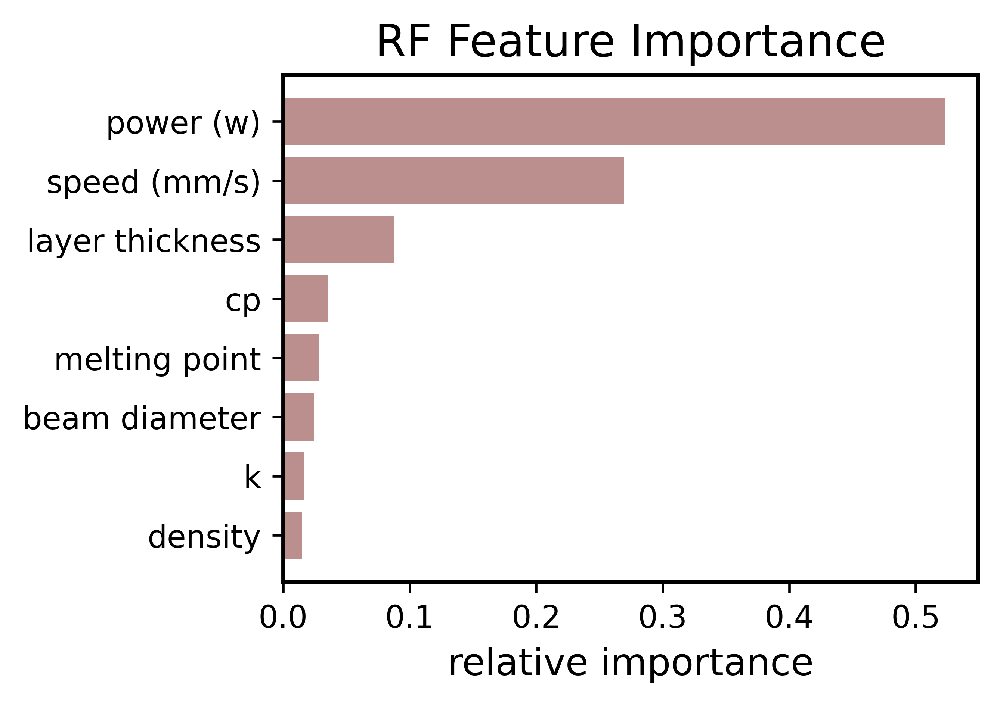

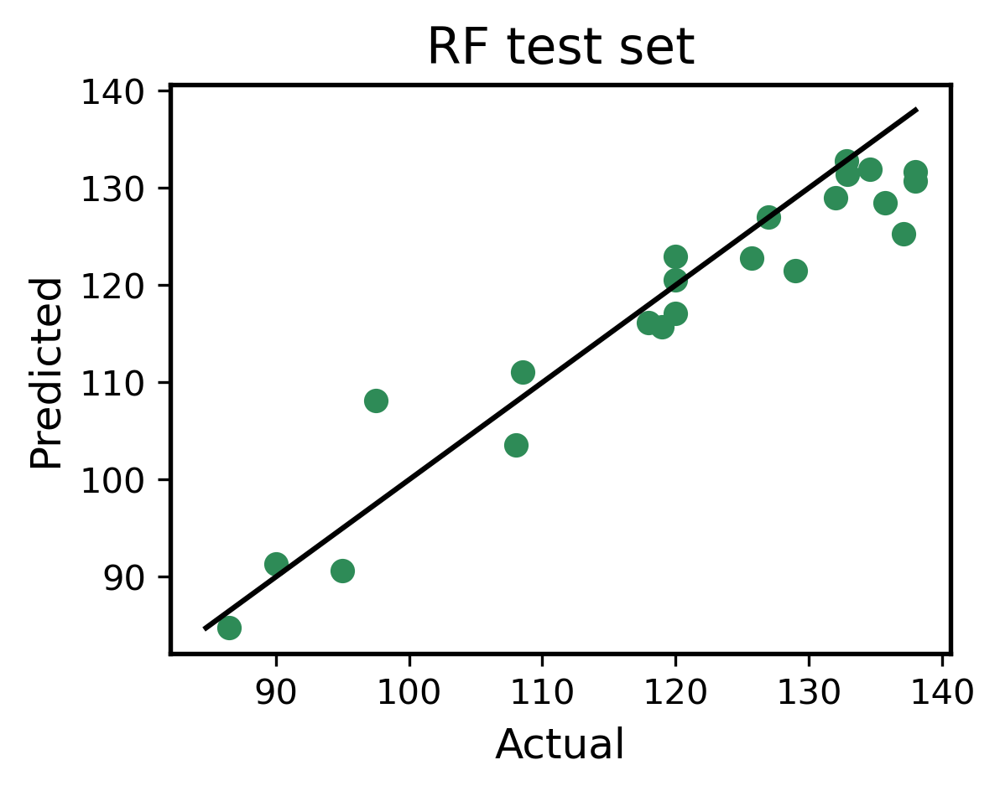

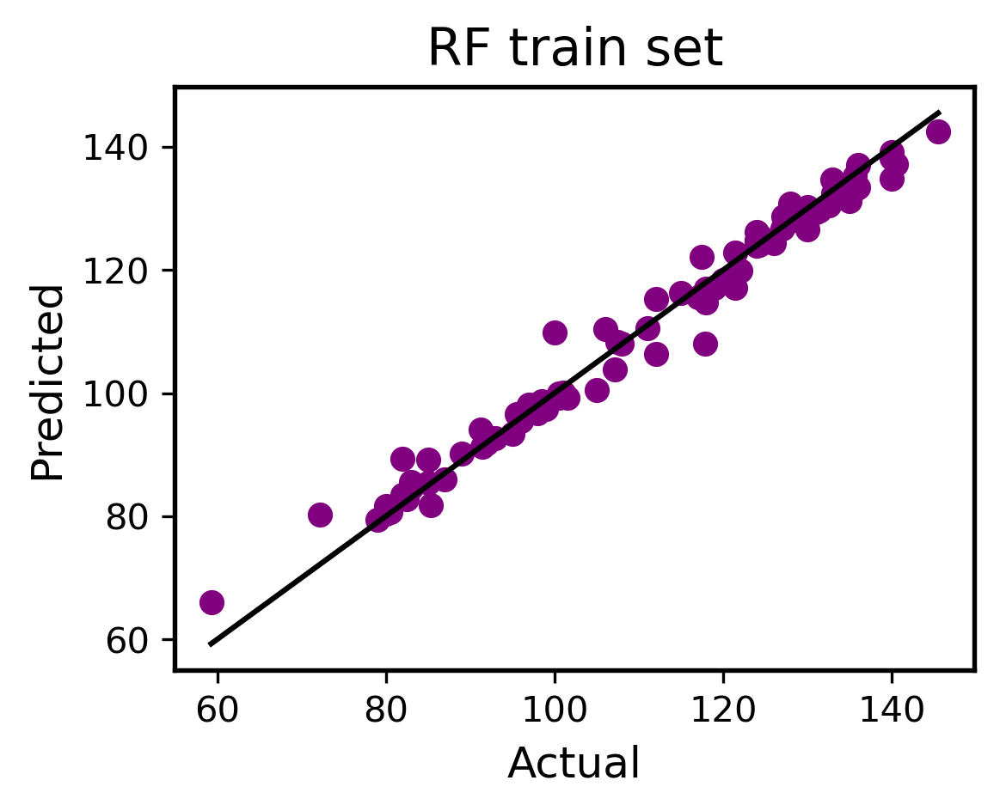

In [147]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'angle mean'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



LEN 129
trains [0.9763057374458922, 0.9650926427665621, 0.971527661212138, 0.979961846013659, 0.9732763482505022]
tests [0.6401641648722262, 0.8899678916377268, 0.9157350380185996, 0.7693963130164284, 0.7584104422452485]
RF  Train R^2: 0.97323 ± 0.00498, Test R^2: 0.79473 ± 0.09956
RF  Train MAE: 2.10395 ± 0.16789, Test MAE: 5.79260 ± 1.05363


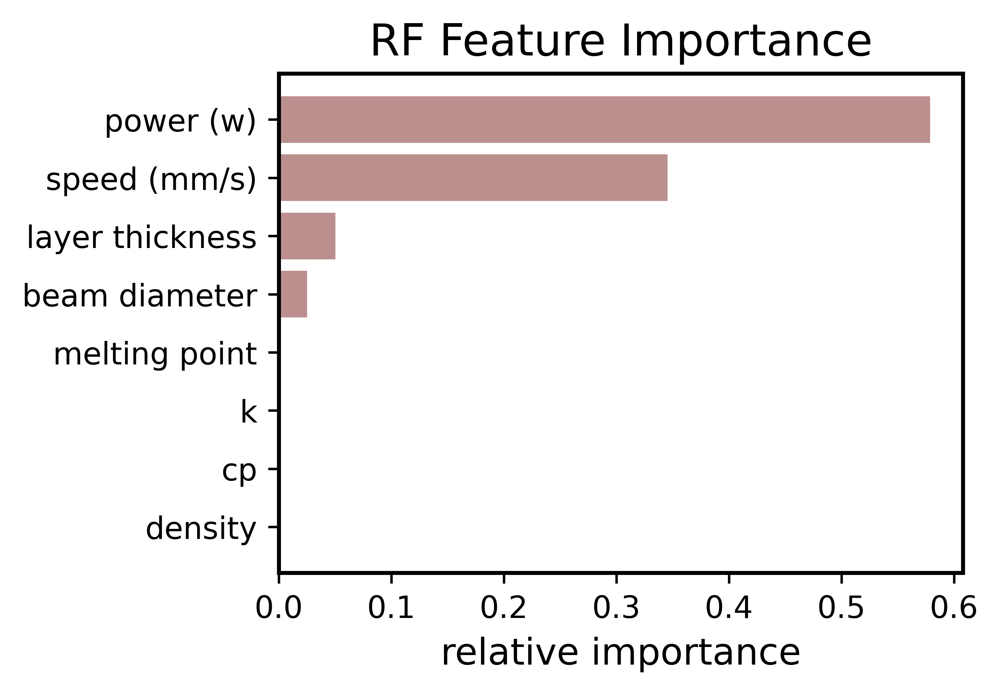

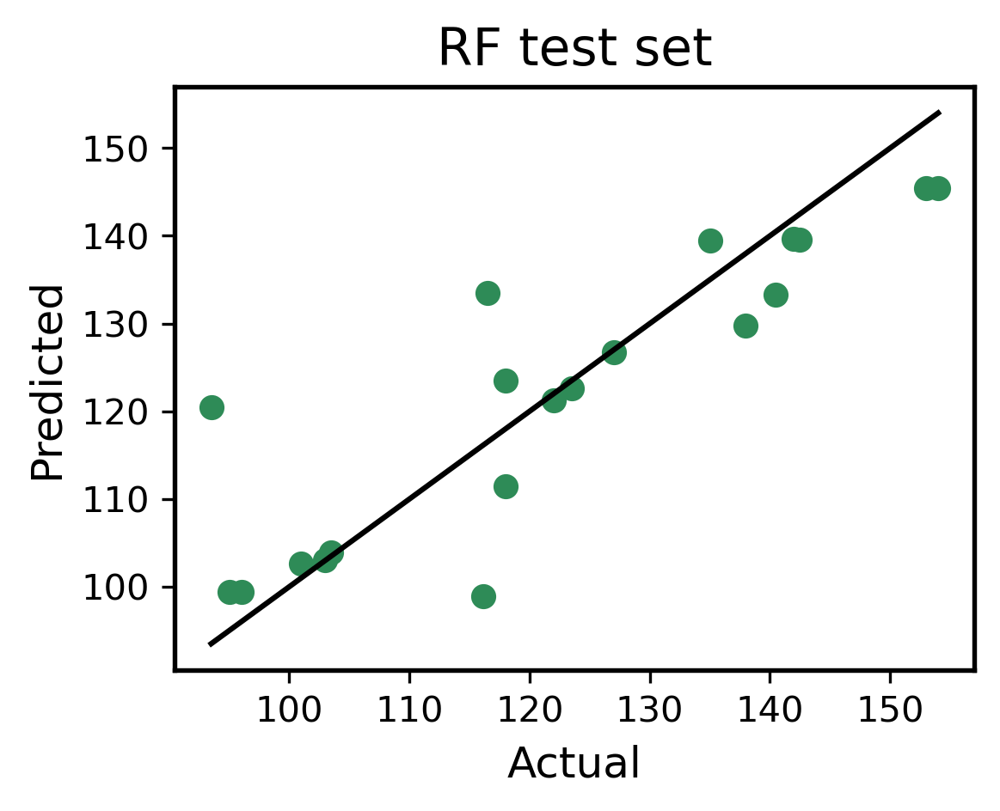

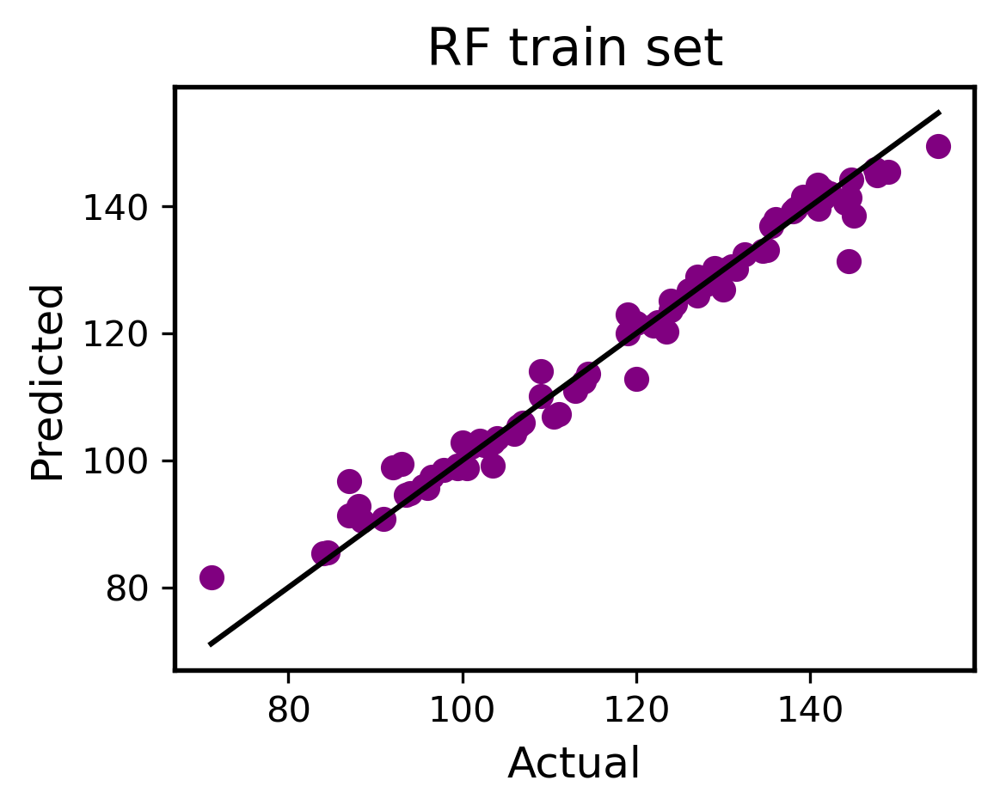

In [71]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'max angle'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



LEN 129
trains [0.9815499313074622, 0.9794706745101134, 0.9759364729851452, 0.9719284192457293, 0.985307590896654]
tests [0.8261345017148416, 0.8872068184848845, 0.8762656881988924, 0.9367837871806475, 0.7574159193360523]
RF  Train R^2: 0.97884 ± 0.00460, Test R^2: 0.85676 ± 0.06086
RF  Train MAE: 2.09091 ± 0.16537, Test MAE: 5.72143 ± 1.11598


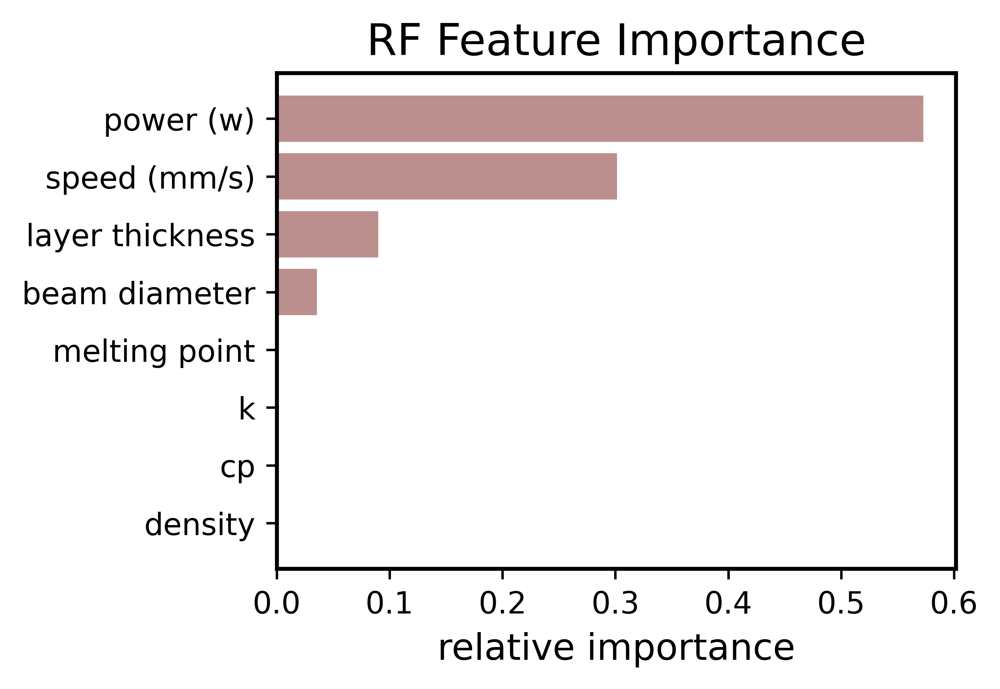

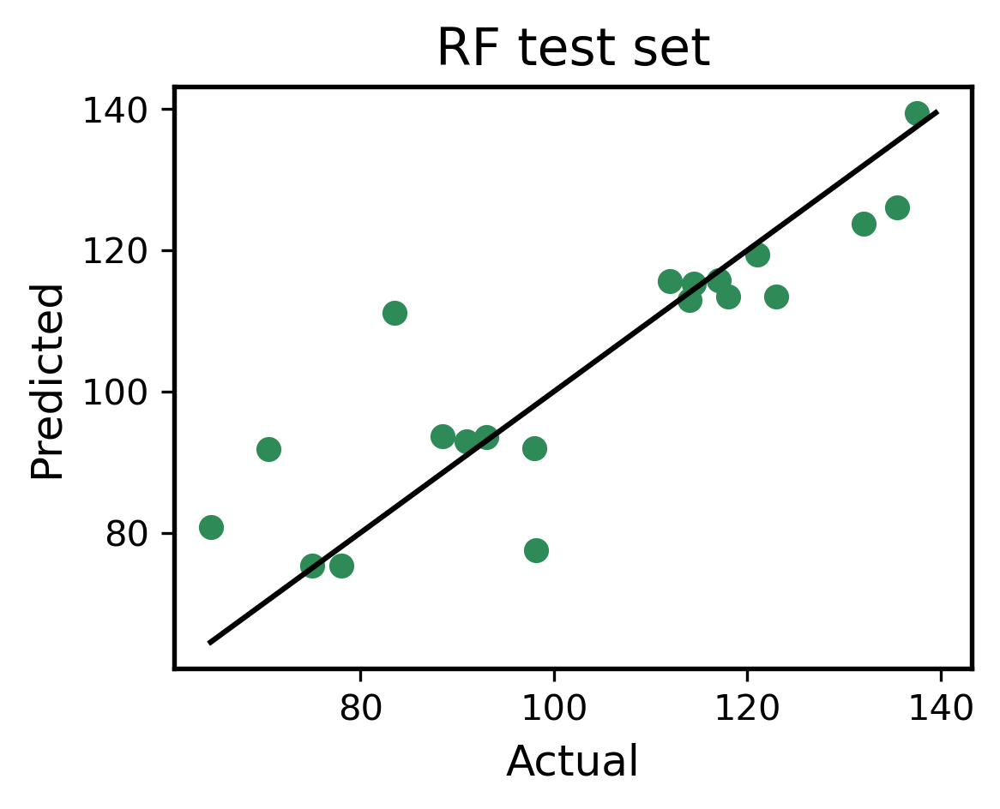

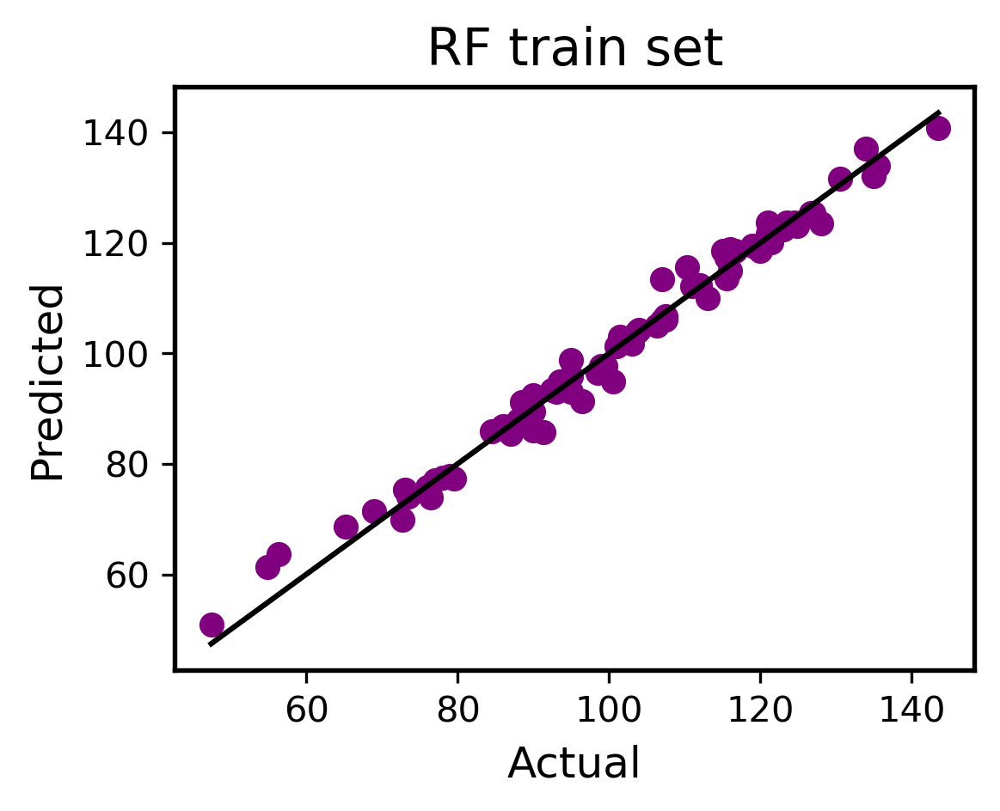

In [72]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'min angle'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



## GPR

In [79]:
%matplotlib inline 

def learn(data, depth, material = None, parameters = None, title = None, plot = False, paper_ID= None):
    
    '''
    
    
    Iterate over the models, performing training/cross-validation and plotting regression results

    
    Arguments:
    data: Matrix array of data, n samples x m features, numpy array
    depth: vector of depth values, n samples x 1 feature, numpy array
    
    (Optional, only displayed on figure)
    material: Material that is trained on (string)
    parameters: parameters contained in data (list of strings)
    title: Any additional information (e.g. process, paper ID) to be specified (string)
    plot: Whether to produce plots
    
    Returns:
    fit_models: List of fit models
    train_accuracy: List of CV Pearson R^2
    train_accuracy_std: List of standard deviation of Pearson R^2
    test_accuracy: List of test Pearson R^2
    test_accuracy_std: List of standard deviation of Pearson R^2
   
    
    
    '''
    
    labels = depth

    params = { #'font.family'      : 'serif',
               'font.size'        : 12,
               'xtick.labelsize'  : 'small',
               'ytick.labelsize'  : 'small',
               #'axes.labelsize'   : 'large',
               'axes.linewidth'   : 1.3 }
    plt.rcParams.update(params)


    y  = labels
    X = data
    
    # transpose if shape of label and data do not match
    if len(X) != len(labels):
        X = X.T
        print(len(labels), len(X))
        print('transposed to ' + str(X.shape[0]) + ', ' + str(X.shape[1]))
        

    idx_normalize = len(X[0])

    scaler = preprocessing.StandardScaler()
    X = scaler.fit_transform(X)            
        
    fit_models = []
    train_accuracy = []
    train_accuracy_std = []
    test_accuracy = []
    test_accuracy_std = []
    
    
    # Iterate over implemented models
    modeltoggle= 'GPR'
    kernel = gp.kernels.ConstantKernel(1.0, (1e-1, 1e3))*gp.kernels.RBF(1.0, (1e-3, 1e3))
            
    model = gp.GaussianProcessRegressor(kernel = kernel, n_restarts_optimizer = 10, alpha = 0.5, normalize_y = True)
            


    # Perform cross validation for each model
    kf = KFold(n_splits=5)
    trains = []
    tests = []
    train_maes = []
    test_maes = []
    # Perform cross validation for each model

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    for train, test in kf.split(X_train):


        # Shuffle data points before prediction
        X_shuffle, y_shuffle = shuffle(X_train, y_train, random_state=42)

        X_cv_train = X_shuffle[train]
        X_cv_test = X_shuffle[test]
        y_cv_train = y_shuffle[train]
        y_cv_test = y_shuffle[test]


        model.fit(X_cv_train, y_cv_train)

        # Calculate MAE and R^2

        y_predtrain = model.predict(X_cv_train)
        y_predtest = model.predict(X_cv_test)
        trains.append(model.score(X_cv_train, y_cv_train))
        tests.append(model.score(X_cv_test, y_cv_test))



        mae_test = metrics.mean_absolute_error(y_cv_test, y_predtest)
        mae_train = metrics.mean_absolute_error(y_cv_train,y_predtrain)
        train_maes.append(mae_train)
        test_maes.append(mae_test)


    print('trains', trains)
    print('tests', tests)
    # Aggregate information
    trains = np.array(trains)
    tests = np.array(tests)
    train_maes = np.array(train_maes)
    test_maes = np.array(test_maes)
    r2_mean = tests.mean()
    r2_std = tests.std()
    r2_train_mean = trains.mean()
    r2_train_std =  trains.std()



    mae_mean_train = train_maes.mean()
    mae_mean_test = test_maes.mean()

    mae_mean_train_std = train_maes.std()
    mae_mean_test_std = test_maes.std()

    train_accuracy.append(r2_train_mean)
    test_accuracy_std.append(r2_std)
    test_accuracy.append(r2_mean)
    train_accuracy_std.append(r2_train_std)

    print(modeltoggle, ' Train R^2: {:.5f} ± {:.5f}, Test R^2: {:.5f} ± {:.5f}'.
            format( r2_train_mean, r2_train_std, r2_mean, r2_std))

    
    print(modeltoggle, ' Train MAE: {:.5f} ± {:.5f}, Test MAE: {:.5f} ± {:.5f}'.
            format( mae_mean_train,mae_mean_train_std, mae_mean_test, mae_mean_test_std))
        
        
        
#     #cv= RepeatedKFold(n_splits=5, n_repeats=5, random_state=1)
#     cv= KFold(n_splits=5, shuffle=True, random_state=10)

#     n_scores= cross_val_score(model, X, y, scoring='r2', cv=cv, n_jobs=-1)
#     print('accuracy: %.5f (%.5f)'% (mean(n_scores), std(n_scores)))
        
    # Plot results: everything scaled back to original values by multiplying by std and adding mean of training labels
    if modeltoggle == 'RF':
        fig = plt.figure(figsize = [4,3], dpi = 600)
        importance = model.feature_importances_
        indices = np.argsort(importance)
        plt.title('RF Feature Importance')
        plt.barh(range(len(indices)), importance[indices], color='c', align='center')
        plt.yticks(range(len(indices)), [parameter_list[i] for i in indices])
        plt.xlabel('relative importance')
        plt.show()
        #print(importance)
            #plt.barh(parameter_list, model.feature_importances_)

    if plot:
        fig = plt.figure(figsize = [4,3], dpi = 300)
        plt.scatter(y_cv_test, y_predtest, c='seagreen')
        p1= max(max(y_predtest), max(y_cv_test))
        p2= min(min(y_predtest), min(y_cv_test))
        plt.plot([p1,p2], [p1,p2], 'k-')
        plt.title(modeltoggle+ ' test set')
        plt.xlabel("Actual")
        plt.ylabel("Predicted")
        
        fig = plt.figure(figsize = [4,3], dpi = 300)
        plt.scatter(y_cv_train, y_predtrain, c='purple')
        p1= max(max(y_predtrain), max(y_cv_train))
        p2= min(min(y_predtrain), min(y_cv_train))
        plt.plot([p1,p2], [p1,p2], 'k-')
        plt.title(modeltoggle+ ' train set')
        plt.xlabel("Actual")
        plt.ylabel("Predicted")
        

    return fit_models, train_accuracy, train_accuracy_std, test_accuracy, test_accuracy_std 

LEN 88
trains [0.948111133520665, 0.9636528298449998, 0.9438644746862896, 0.9529357121783333, 0.9544852363916215]
tests [0.8115720717932277, 0.9037901795856008, 0.8367264524225263, 0.968396741430546, 0.9565124834099932]
GPR  Train R^2: 0.95261 ± 0.00667, Test R^2: 0.89540 ± 0.06262
GPR  Train MAE: 0.38392 ± 0.03352, Test MAE: 0.51112 ± 0.17564


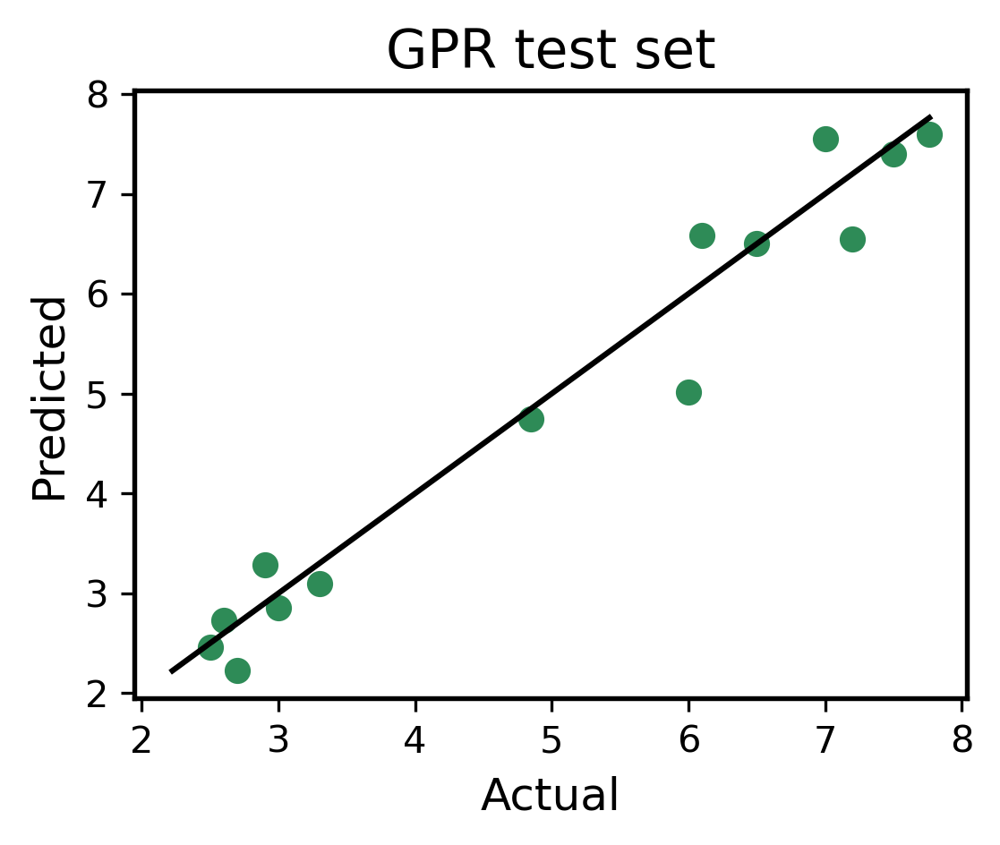

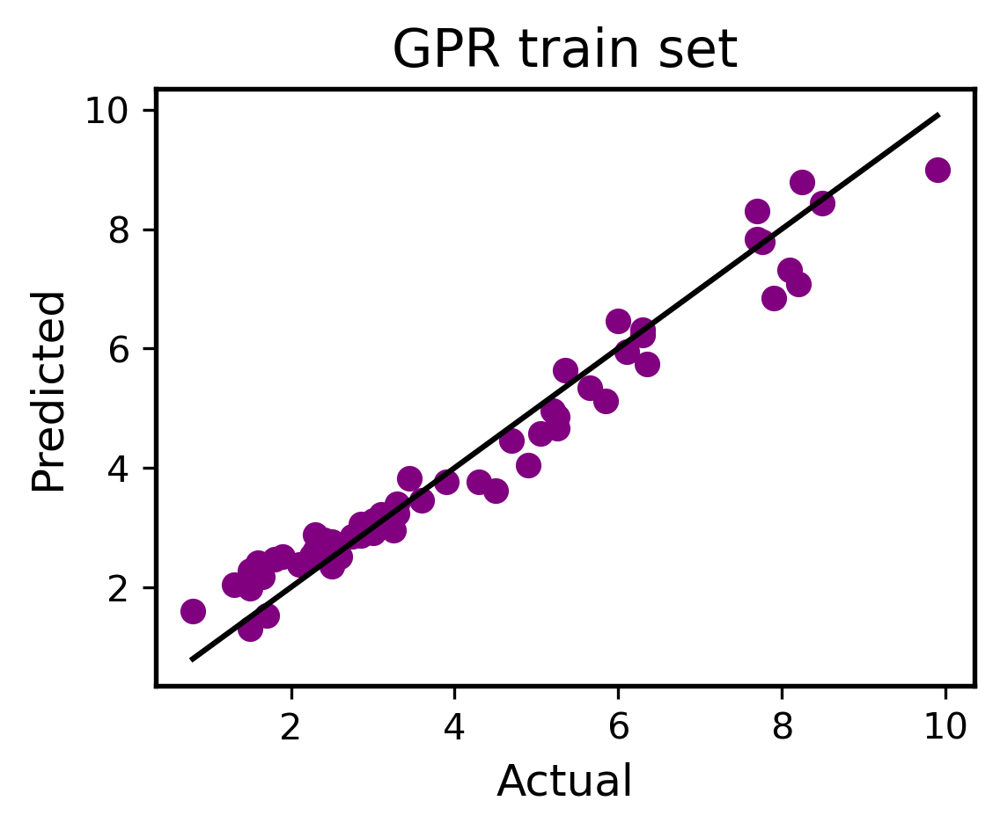

In [80]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'velocity mean'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



LEN 83
trains [0.957301579204257, 0.9379097566484793, 0.943712524514652, 0.9399840126663428, 0.9299683403232937]
tests [0.8560723251560546, 0.9263514085113469, 0.8726399665330205, 0.9469766207798354, 0.922308696561067]
GPR  Train R^2: 0.94178 ± 0.00897, Test R^2: 0.90487 ± 0.03452
GPR  Train MAE: 0.46850 ± 0.02936, Test MAE: 0.57156 ± 0.15565


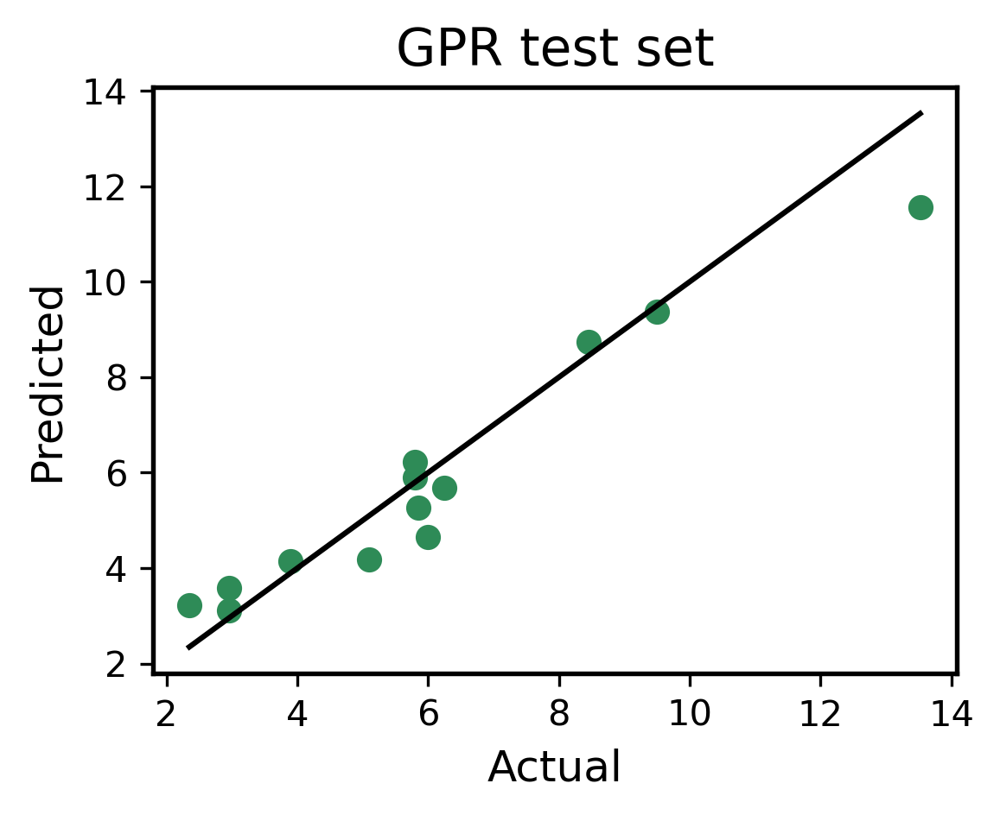

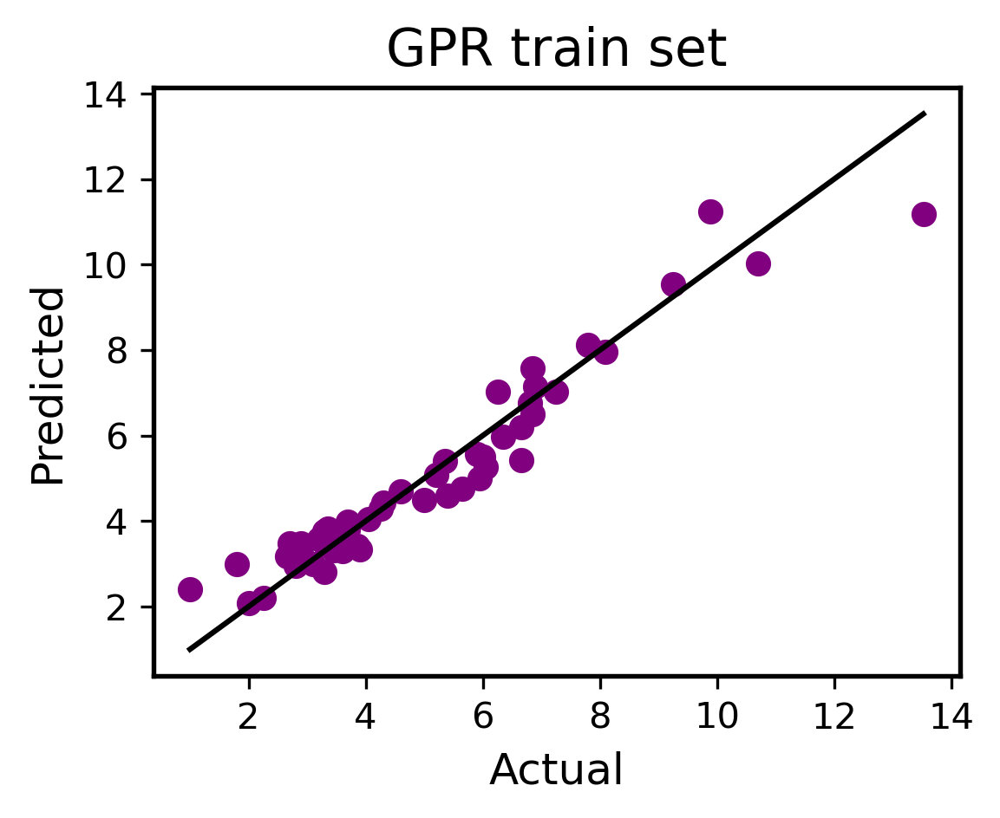

In [81]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'max velocity'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



LEN 83
trains [0.9572195610299927, 0.9056288809551555, 0.9196415017198898, 0.9029042924789282, 0.9169980254316854]
tests [0.7064151461641737, 0.9491650726141372, 0.8140757701489953, 0.9521943031718093, 0.8083143353695355]
GPR  Train R^2: 0.92048 ± 0.01945, Test R^2: 0.84603 ± 0.09364
GPR  Train MAE: 0.37830 ± 0.04788, Test MAE: 0.47652 ± 0.15893


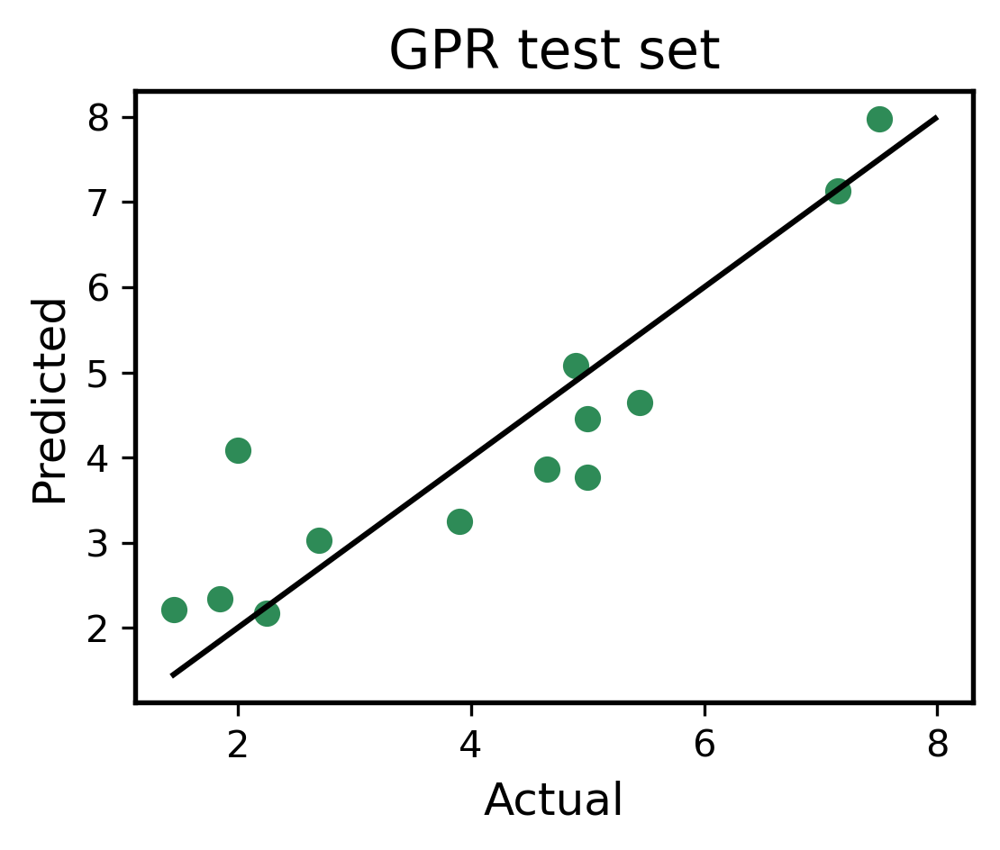

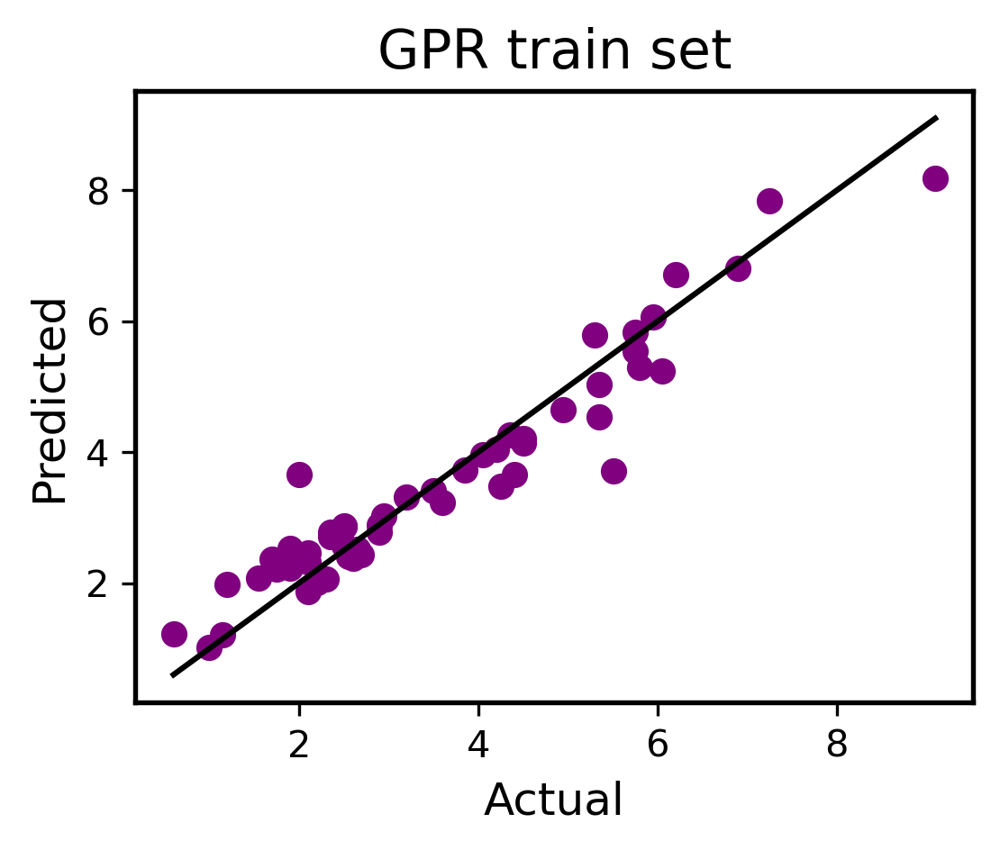

In [82]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'min velocity'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



LEN 141
trains [0.790083097500699, 0.7793757956799082, 0.7884043509716432, 0.8857659380811922, 0.7831263896079891]
tests [0.8925881054789365, 0.7639949988378114, 0.819497547949965, 0.21349641260544927, 0.600829492477334]
GPR  Train R^2: 0.80535 ± 0.04039, Test R^2: 0.65808 ± 0.24216
GPR  Train MAE: 5.93880 ± 0.59634, Test MAE: 7.26822 ± 1.66060


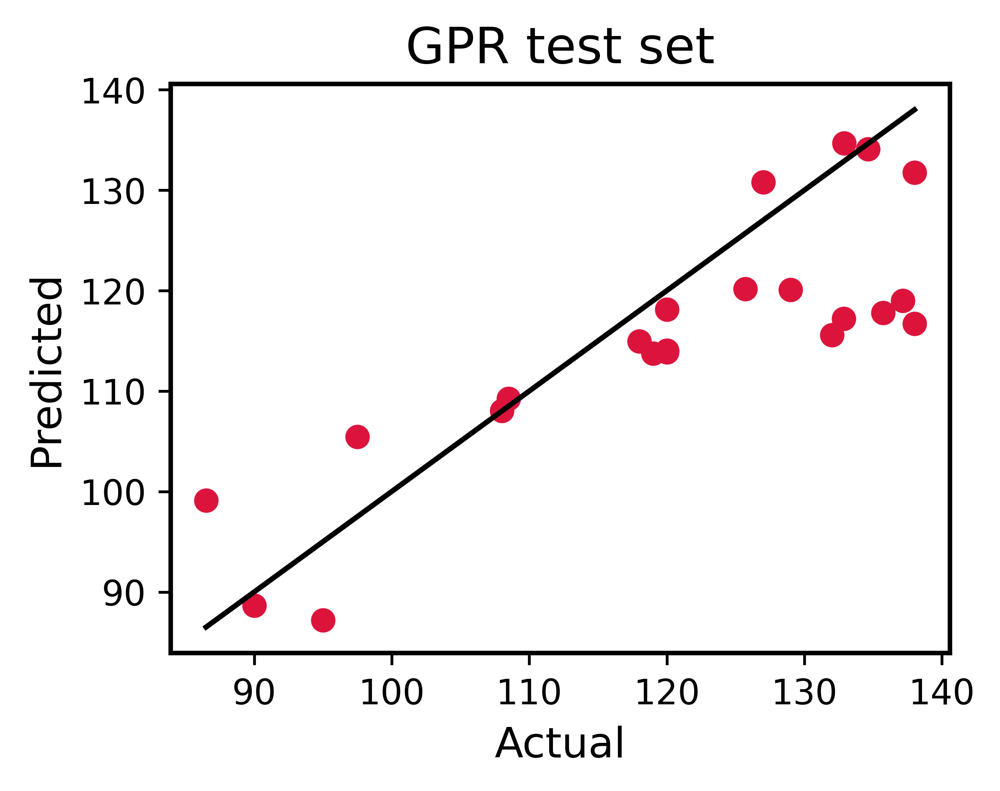

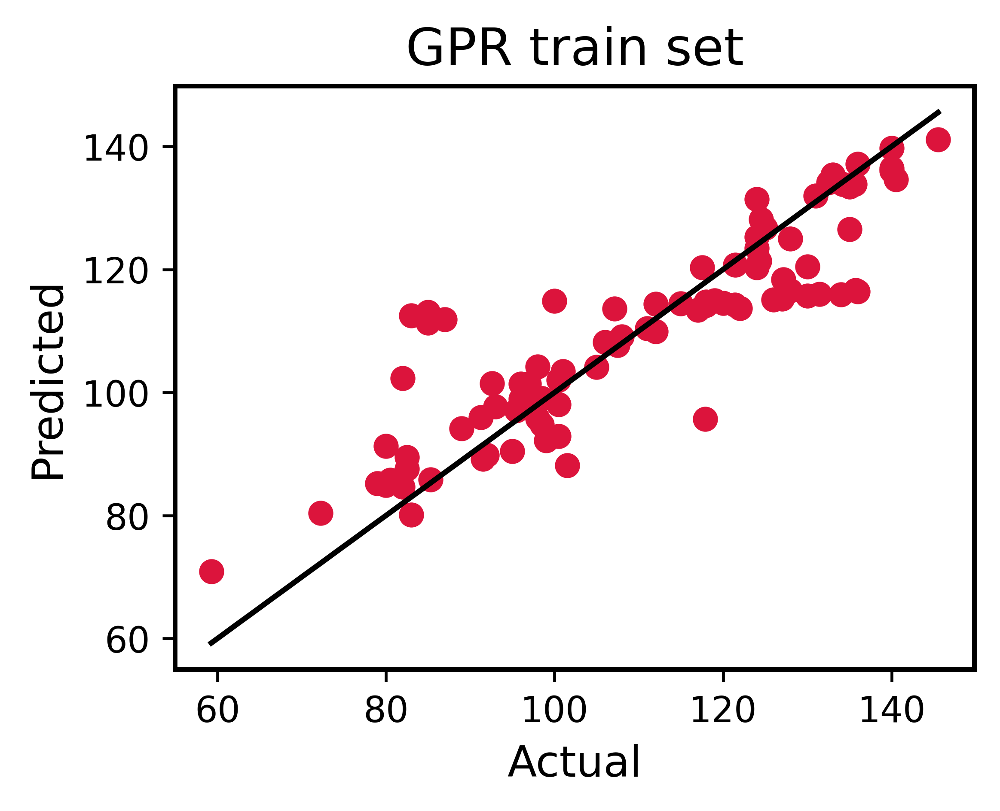

In [149]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'angle mean'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



LEN 129
trains [0.7719092592942907, 0.8083346695440939, 0.7746179463224823, 0.7697950742310189, 0.8115607239547461]
tests [0.7913584700152515, 0.4765770378591041, 0.8391684123513918, 0.737439084898416, 0.370536385470013]
GPR  Train R^2: 0.78724 ± 0.01863, Test R^2: 0.64302 ± 0.18512
GPR  Train MAE: 5.98021 ± 0.38291, Test MAE: 7.58930 ± 2.09058


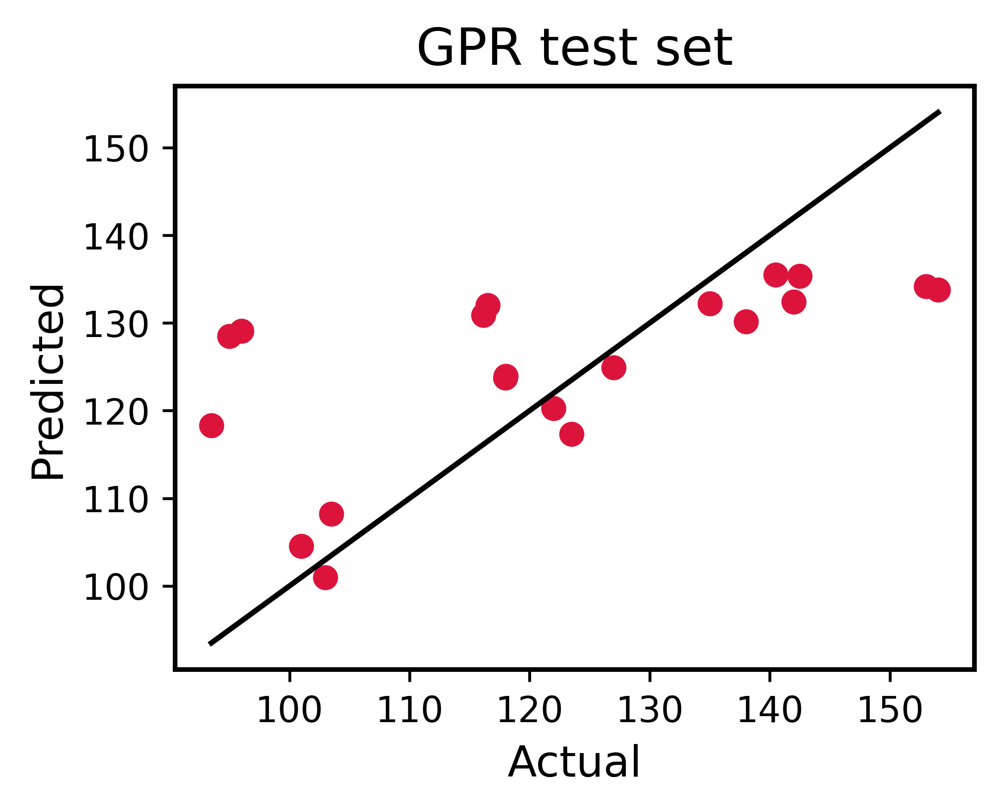

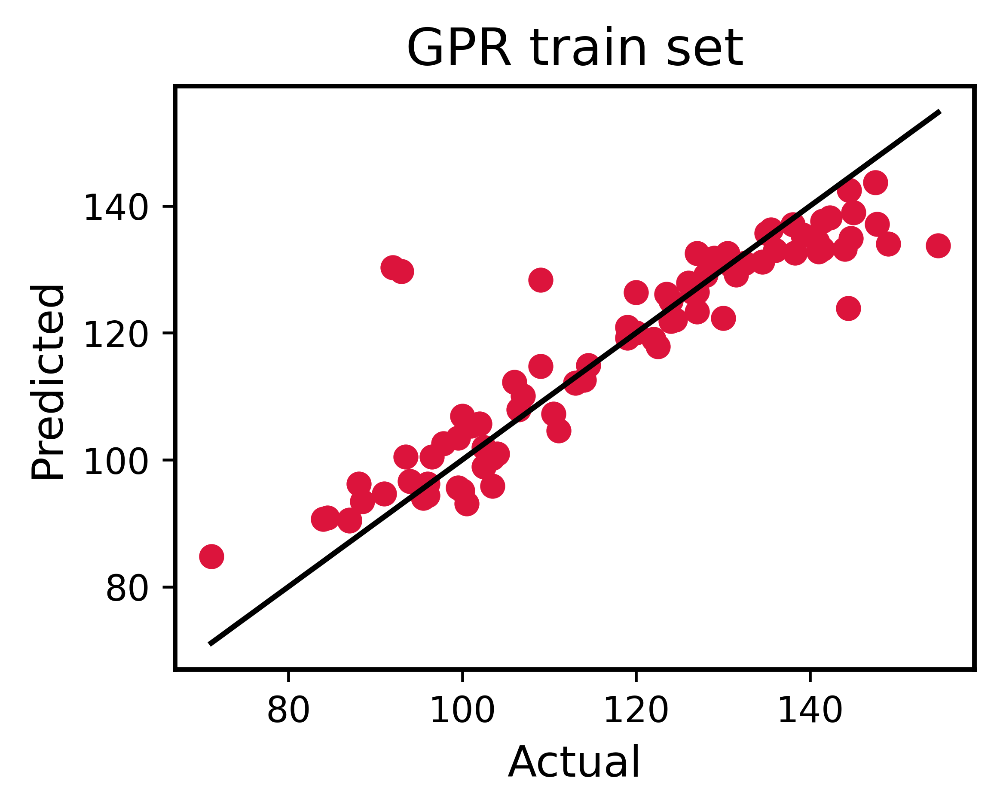

In [78]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'max angle'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



LEN 129
trains [0.7655980072598445, 0.8243629362601113, 0.7600784173430203, 0.7411445578034235, 0.8051217214644559]
tests [0.765161947636179, 0.5106012385152091, 0.7687913594392967, 0.9120579026789507, 0.5862970108178347]
GPR  Train R^2: 0.77926 ± 0.03069, Test R^2: 0.70858 ± 0.14309
GPR  Train MAE: 6.95376 ± 0.52011, Test MAE: 7.83581 ± 1.96611


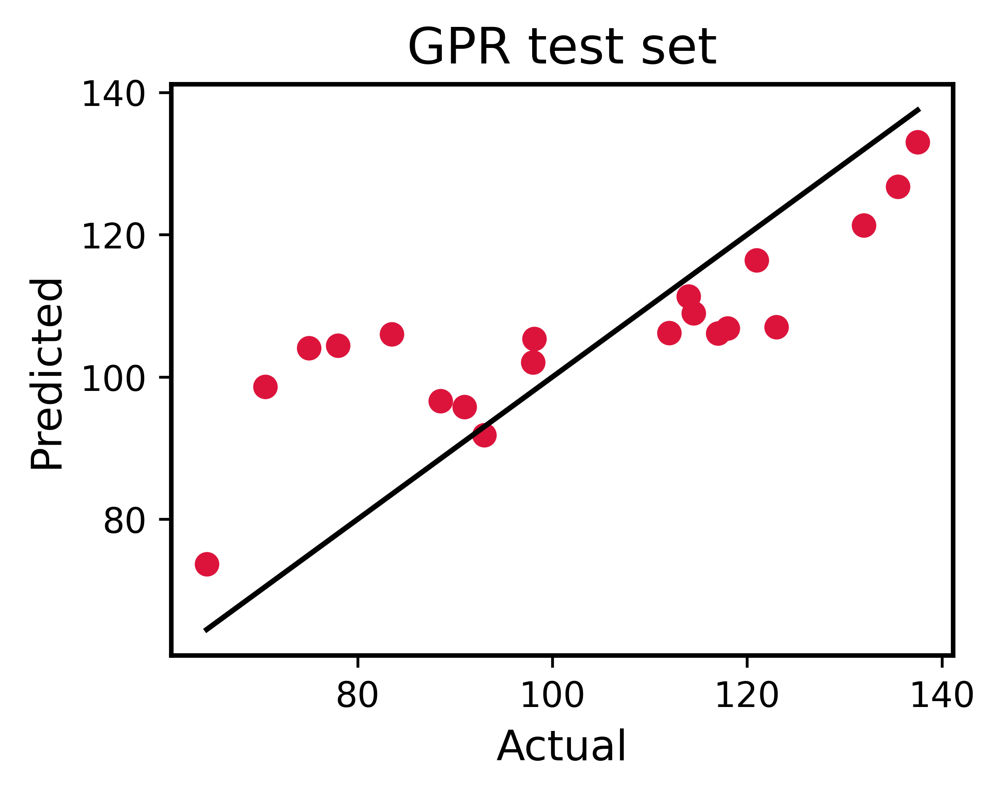

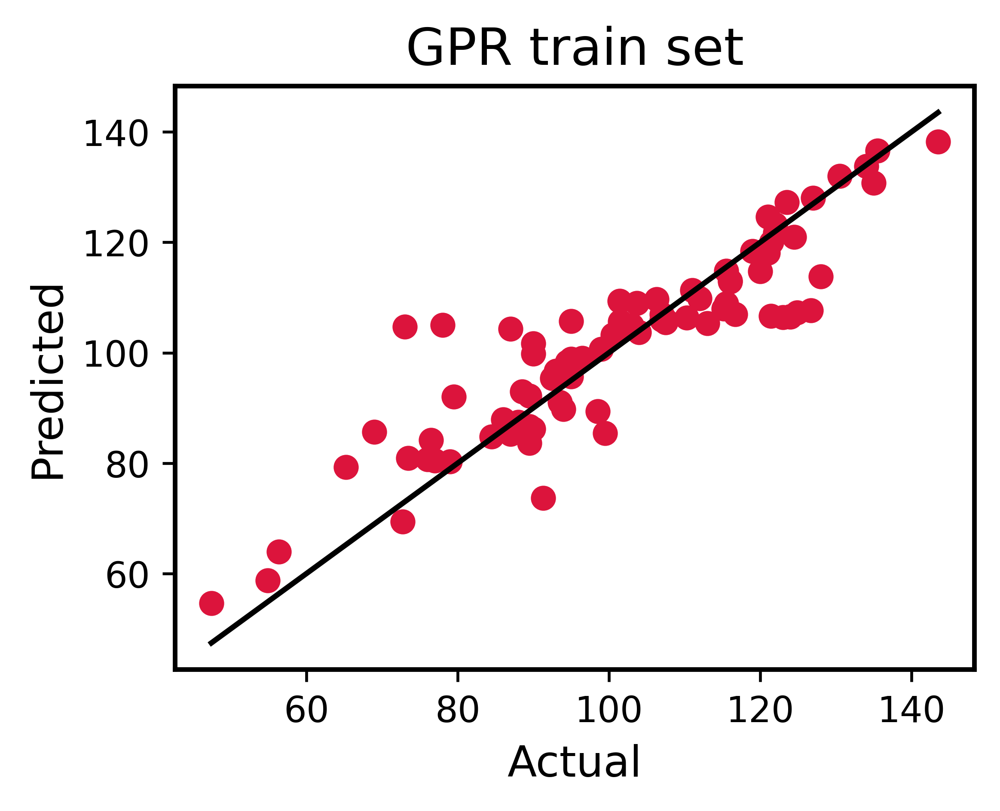

In [79]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'min angle'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



## SVR

In [80]:
%matplotlib inline 

def learn(data, depth, material = None, parameters = None, title = None, plot = False, paper_ID= None):
    
    '''
    
    
    Iterate over the models, performing training/cross-validation and plotting regression results

    
    Arguments:
    data: Matrix array of data, n samples x m features, numpy array
    depth: vector of depth values, n samples x 1 feature, numpy array
    
    (Optional, only displayed on figure)
    material: Material that is trained on (string)
    parameters: parameters contained in data (list of strings)
    title: Any additional information (e.g. process, paper ID) to be specified (string)
    plot: Whether to produce plots
    
    Returns:
    fit_models: List of fit models
    train_accuracy: List of CV Pearson R^2
    train_accuracy_std: List of standard deviation of Pearson R^2
    test_accuracy: List of test Pearson R^2
    test_accuracy_std: List of standard deviation of Pearson R^2
   
    
    
    '''
    
    labels = depth

    params = { #'font.family'      : 'serif',
               'font.size'        : 12,
               'xtick.labelsize'  : 'small',
               'ytick.labelsize'  : 'small',
               #'axes.labelsize'   : 'large',
               'axes.linewidth'   : 1.3 }
    plt.rcParams.update(params)


    y  = labels
    X = data
    
    # transpose if shape of label and data do not match
    if len(X) != len(labels):
        X = X.T
        print(len(labels), len(X))
        print('transposed to ' + str(X.shape[0]) + ', ' + str(X.shape[1]))
        

    idx_normalize = len(X[0])

    scaler = preprocessing.StandardScaler()
    X = scaler.fit_transform(X)
            
        
    fit_models = []
    train_accuracy = []
    train_accuracy_std = []
    test_accuracy = []
    test_accuracy_std = []
    
    
    # Iterate over implemented models
    modeltoggle= 'SVR'
    model = SVR(C=30, kernel='rbf')

    # Perform cross validation for each model
    kf = KFold(n_splits=5)
    trains = []
    tests = []
    train_maes = []
    test_maes = []
    # Perform cross validation for each model
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    for train, test in kf.split(X_train):


        # Shuffle data points before prediction
        X_shuffle, y_shuffle = shuffle(X_train, y_train, random_state=42)

        X_cv_train = X_shuffle[train]
        X_cv_test = X_shuffle[test]
        y_cv_train = y_shuffle[train]
        y_cv_test = y_shuffle[test]


        model.fit(X_cv_train, y_cv_train)

        # Calculate MAE and R^2

        y_predtrain = model.predict(X_cv_train)
        y_predtest = model.predict(X_cv_test)
        trains.append(model.score(X_cv_train, y_cv_train))
        tests.append(model.score(X_cv_test, y_cv_test))



        mae_test = metrics.mean_absolute_error(y_cv_test, y_predtest)
        mae_train = metrics.mean_absolute_error(y_cv_train,y_predtrain)
        train_maes.append(mae_train)
        test_maes.append(mae_test)


    print('trains', trains)
    print('tests', tests)
    # Aggregate information
    trains = np.array(trains)
    tests = np.array(tests)
    train_maes = np.array(train_maes)
    test_maes = np.array(test_maes)
    r2_mean = tests.mean()
    r2_std = tests.std()
    r2_train_mean = trains.mean()
    r2_train_std =  trains.std()



    mae_mean_train = train_maes.mean()
    mae_mean_test = test_maes.mean()

    mae_mean_train_std = train_maes.std()
    mae_mean_test_std = test_maes.std()

    train_accuracy.append(r2_train_mean)
    test_accuracy_std.append(r2_std)
    test_accuracy.append(r2_mean)
    train_accuracy_std.append(r2_train_std)

    print(modeltoggle, ' Train R^2: {:.5f} ± {:.5f}, Test R^2: {:.5f} ± {:.5f}'.
            format( r2_train_mean, r2_train_std, r2_mean, r2_std))

    
    print(modeltoggle, ' Train MAE: {:.5f} ± {:.5f}, Test MAE: {:.5f} ± {:.5f}'.
            format( mae_mean_train,mae_mean_train_std, mae_mean_test, mae_mean_test_std))
        
        
        
#     #cv= RepeatedKFold(n_splits=5, n_repeats=5, random_state=1)
#     cv= KFold(n_splits=5, shuffle=True, random_state=10)

#     n_scores= cross_val_score(model, X, y, scoring='r2', cv=cv, n_jobs=-1)
#     print('accuracy: %.5f (%.5f)'% (mean(n_scores), std(n_scores)))
        
    # Plot results: everything scaled back to original values by multiplying by std and adding mean of training labels
    if modeltoggle == 'RF':
        fig = plt.figure(figsize = [4,3], dpi = 600)
        importance = model.feature_importances_
        indices = np.argsort(importance)
        plt.title('RF Feature Importance')
        plt.barh(range(len(indices)), importance[indices], color='c', align='center')
        plt.yticks(range(len(indices)), [parameter_list[i] for i in indices])
        plt.xlabel('relative importance')
        plt.show()
        #print(importance)
            #plt.barh(parameter_list, model.feature_importances_)

    if plot:
        fig = plt.figure(figsize = [4,3], dpi = 600)
        plt.scatter(y_cv_test, y_predtest, c='crimson')
        p1= max(max(y_predtest), max(y_cv_test))
        p2= min(min(y_predtest), min(y_cv_test))
        plt.plot([p1,p2], [p1,p2], 'k-')
        plt.title(modeltoggle+ ' test set')
        plt.xlabel("Actual")
        plt.ylabel("Predicted")
        
        fig = plt.figure(figsize = [4,3], dpi = 600)
        plt.scatter(y_cv_train, y_predtrain, c='crimson')
        p1= max(max(y_predtrain), max(y_cv_train))
        p2= min(min(y_predtrain), min(y_cv_train))
        plt.plot([p1,p2], [p1,p2], 'k-')
        plt.title(modeltoggle+ ' train set')
        plt.xlabel("Actual")
        plt.ylabel("Predicted")
        

    return fit_models, train_accuracy, train_accuracy_std, test_accuracy, test_accuracy_std 

LEN 88
trains [0.990468465911692, 0.9893160604075957, 0.9918557914070756, 0.9898571917296755, 0.9915365286101534]
tests [0.9594210031021968, 0.9241468129971518, 0.9763613617237916, 0.9896253059799295, 0.9632175637282611]
SVR  Train R^2: 0.99061 ± 0.00097, Test R^2: 0.96255 ± 0.02195
SVR  Train MAE: 0.16385 ± 0.00566, Test MAE: 0.29238 ± 0.09613


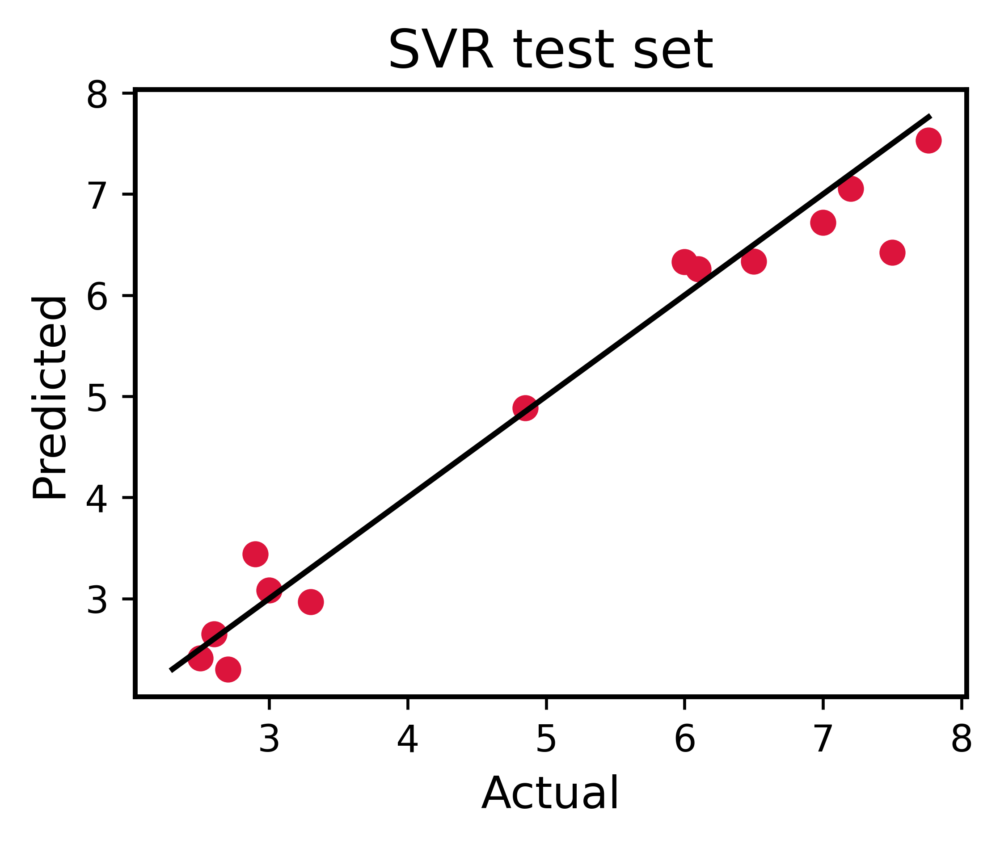

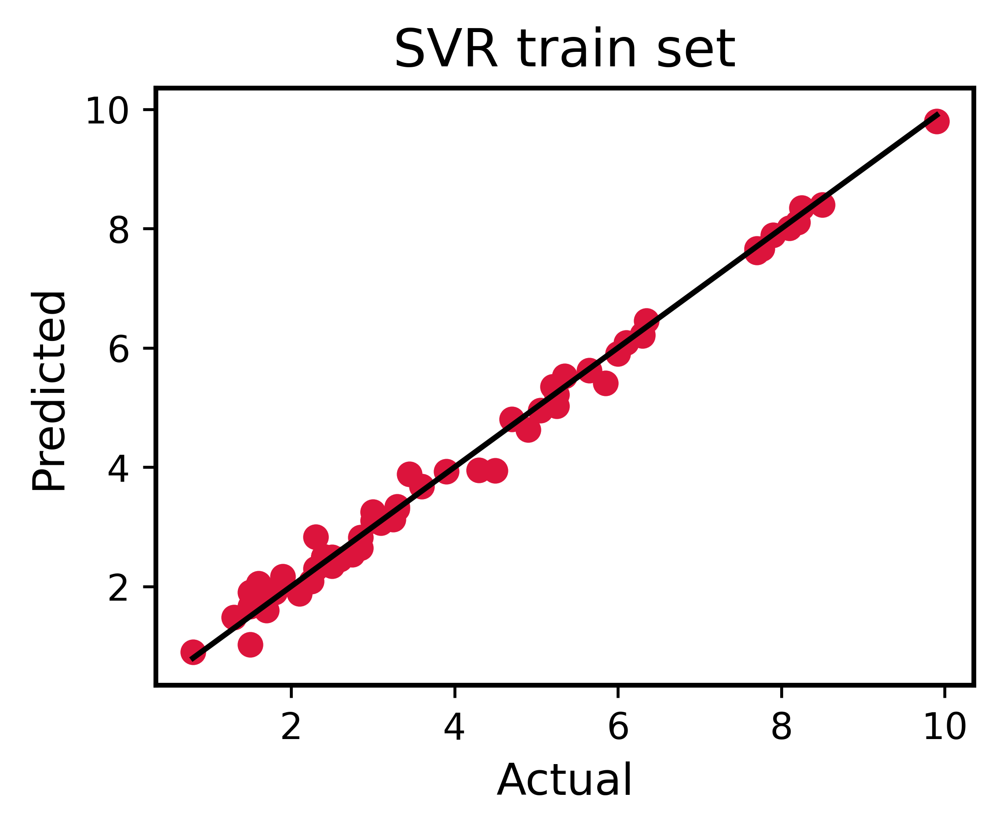

In [81]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'velocity mean'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



LEN 83
trains [0.9853857337133097, 0.9605462419002067, 0.9860555026533379, 0.9639714777042595, 0.9518659131795886]
tests [0.8165760512399048, 0.9720054187222202, 0.8605323359830875, 0.9184590103614513, 0.8142336562498511]
SVR  Train R^2: 0.96956 ± 0.01377, Test R^2: 0.87636 ± 0.06100
SVR  Train MAE: 0.25822 ± 0.03205, Test MAE: 0.55977 ± 0.18702


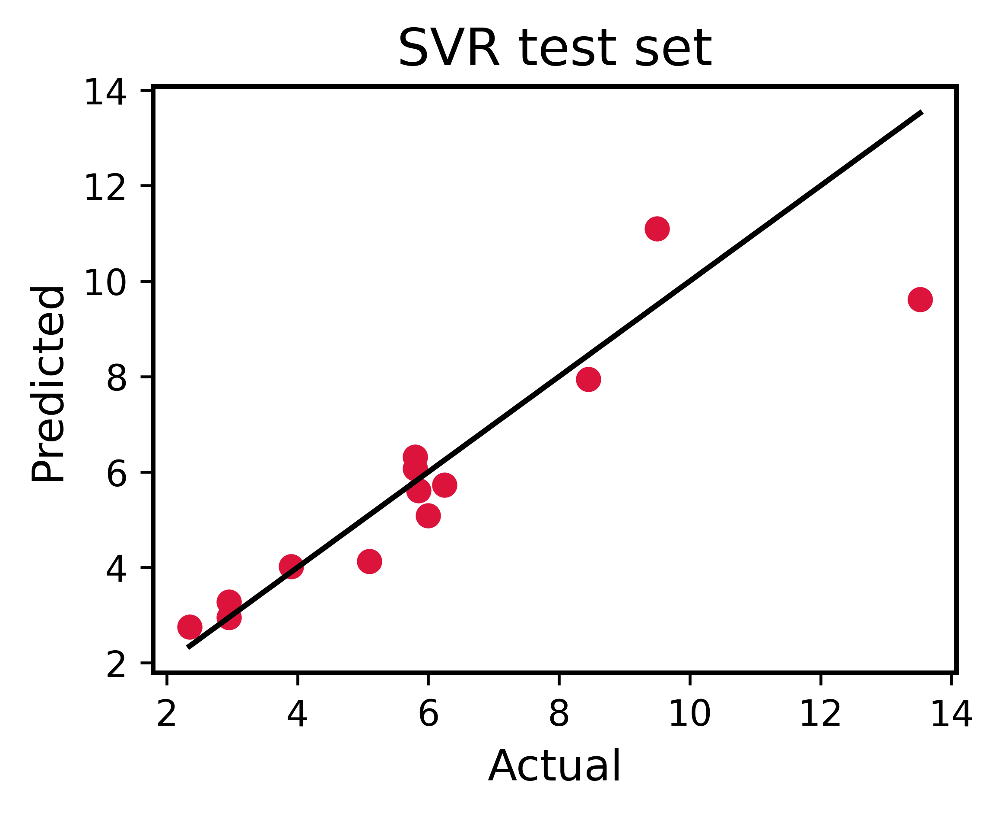

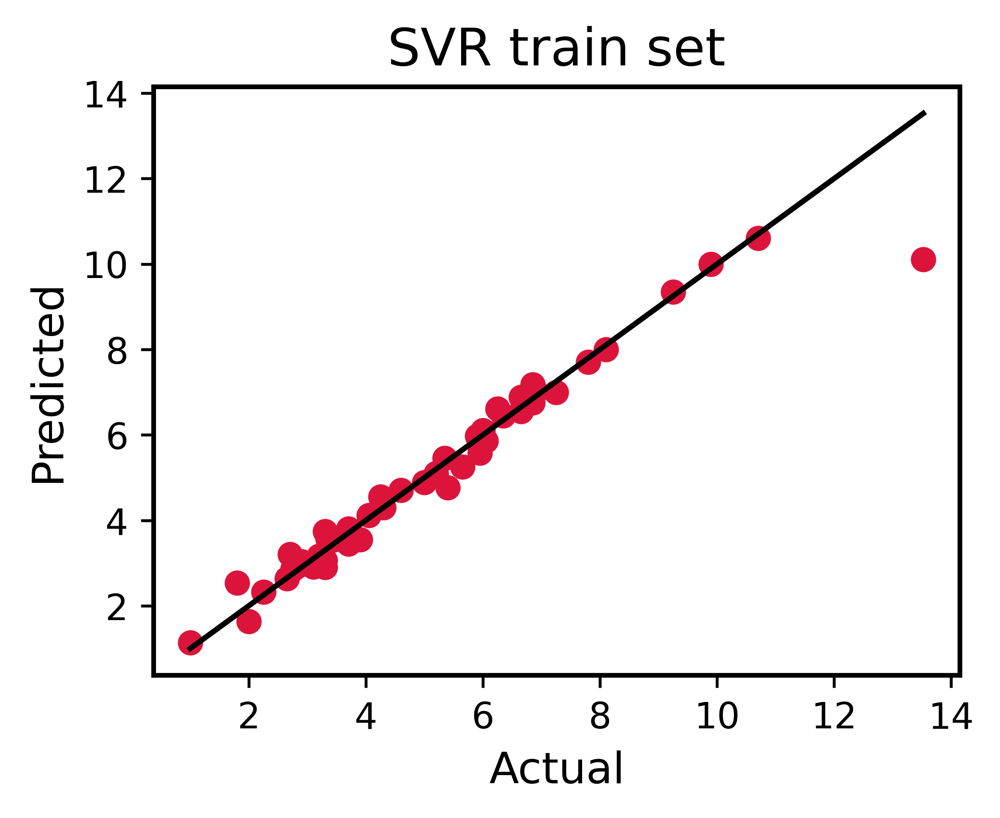

In [82]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'max velocity'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



LEN 83
trains [0.9806706336341011, 0.9247119034120506, 0.9839494299436269, 0.9213780552270395, 0.9248487348846129]
tests [0.7323412495011965, 0.9796399344529961, 0.5358420840657038, 0.9572588824963518, 0.66884351353052]
SVR  Train R^2: 0.94711 ± 0.02878, Test R^2: 0.77479 ± 0.17052
SVR  Train MAE: 0.21688 ± 0.03199, Test MAE: 0.45366 ± 0.18313


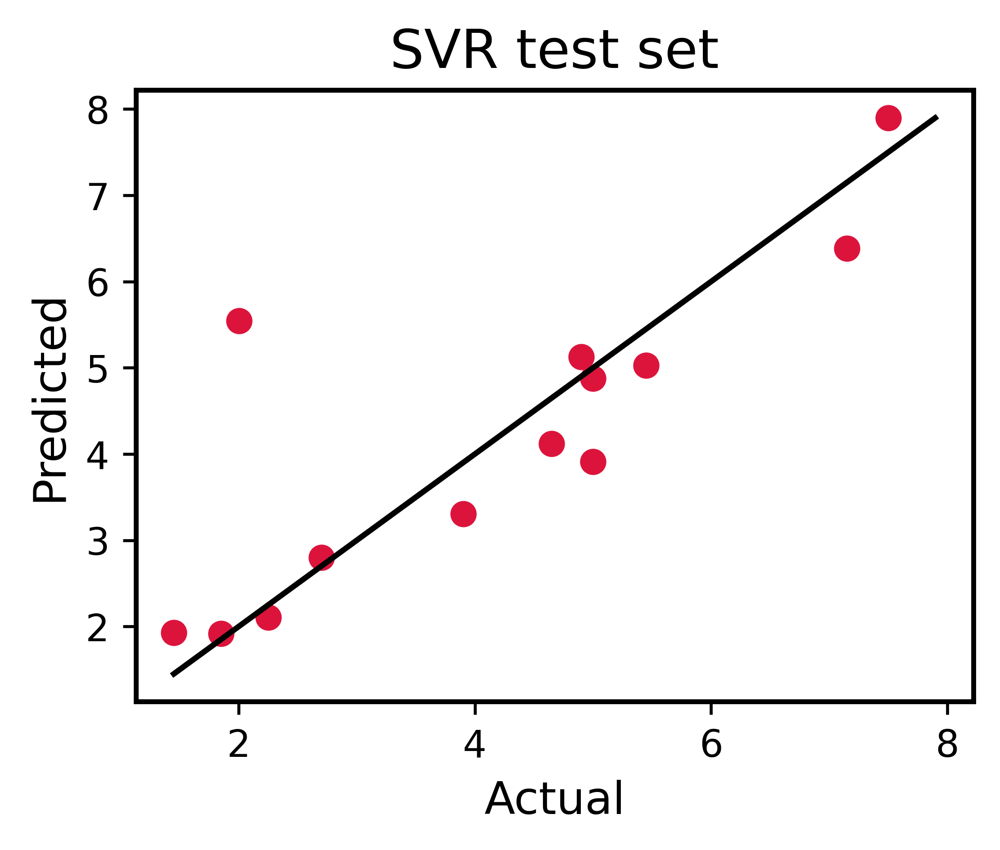

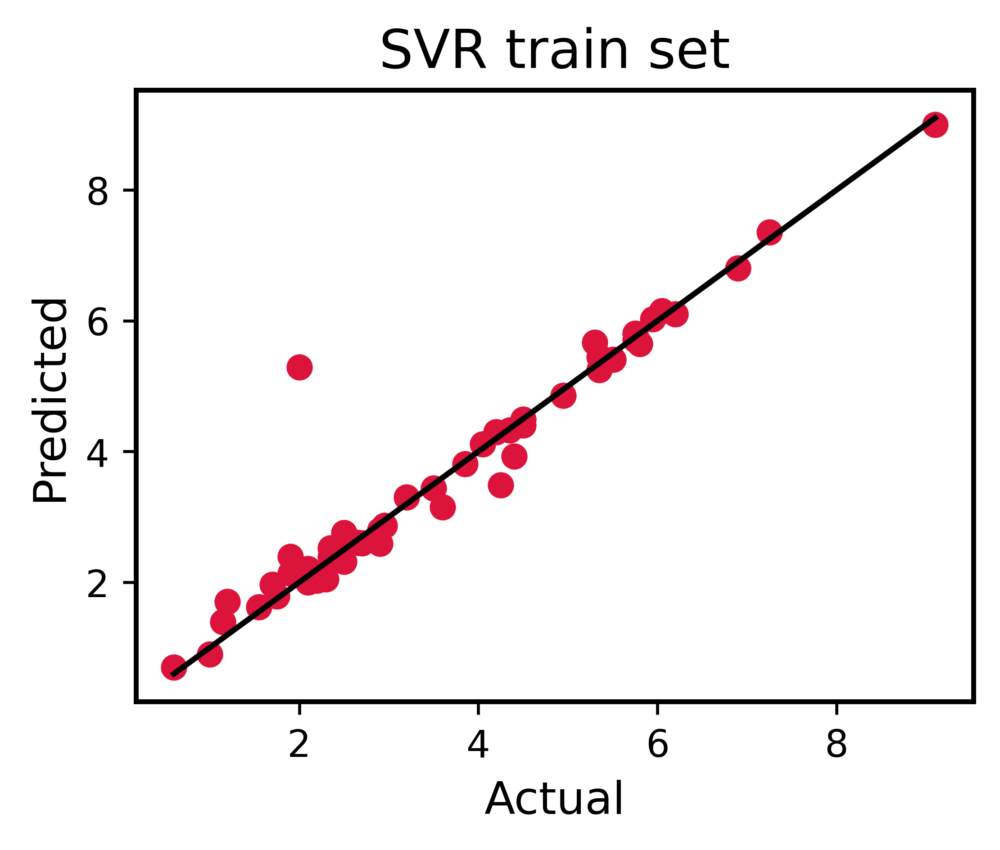

In [83]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'min velocity'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



In [150]:
%matplotlib inline 

def learn(data, depth, material = None, parameters = None, title = None, plot = False, paper_ID= None):
    
    '''
    
    
    Iterate over the models, performing training/cross-validation and plotting regression results

    
    Arguments:
    data: Matrix array of data, n samples x m features, numpy array
    depth: vector of depth values, n samples x 1 feature, numpy array
    
    (Optional, only displayed on figure)
    material: Material that is trained on (string)
    parameters: parameters contained in data (list of strings)
    title: Any additional information (e.g. process, paper ID) to be specified (string)
    plot: Whether to produce plots
    
    Returns:
    fit_models: List of fit models
    train_accuracy: List of CV Pearson R^2
    train_accuracy_std: List of standard deviation of Pearson R^2
    test_accuracy: List of test Pearson R^2
    test_accuracy_std: List of standard deviation of Pearson R^2
   
    
    
    '''
    
    labels = depth

    params = { #'font.family'      : 'serif',
               'font.size'        : 12,
               'xtick.labelsize'  : 'small',
               'ytick.labelsize'  : 'small',
               #'axes.labelsize'   : 'large',
               'axes.linewidth'   : 1.3 }
    plt.rcParams.update(params)


    y  = labels
    X = data
    
    # transpose if shape of label and data do not match
    if len(X) != len(labels):
        X = X.T
        print(len(labels), len(X))
        print('transposed to ' + str(X.shape[0]) + ', ' + str(X.shape[1]))
        

    idx_normalize = len(X[0])

    scaler = preprocessing.StandardScaler()
    X = scaler.fit_transform(X)
            
        
    fit_models = []
    train_accuracy = []
    train_accuracy_std = []
    test_accuracy = []
    test_accuracy_std = []
    
    
    # Iterate over implemented models
    modeltoggle= 'SVR'
    model = SVR(C=275, kernel='rbf')

    # Perform cross validation for each model
    kf = KFold(n_splits=5)
    trains = []
    tests = []
    train_maes = []
    test_maes = []
    # Perform cross validation for each model
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    for train, test in kf.split(X_train):


        # Shuffle data points before prediction
        X_shuffle, y_shuffle = shuffle(X_train, y_train, random_state=42)

        X_cv_train = X_shuffle[train]
        X_cv_test = X_shuffle[test]
        y_cv_train = y_shuffle[train]
        y_cv_test = y_shuffle[test]


        model.fit(X_cv_train, y_cv_train)

        # Calculate MAE and R^2

        y_predtrain = model.predict(X_cv_train)
        y_predtest = model.predict(X_cv_test)
        trains.append(model.score(X_cv_train, y_cv_train))
        tests.append(model.score(X_cv_test, y_cv_test))



        mae_test = metrics.mean_absolute_error(y_cv_test, y_predtest)
        mae_train = metrics.mean_absolute_error(y_cv_train,y_predtrain)
        train_maes.append(mae_train)
        test_maes.append(mae_test)


    print('trains', trains)
    print('tests', tests)
    # Aggregate information
    trains = np.array(trains)
    tests = np.array(tests)
    train_maes = np.array(train_maes)
    test_maes = np.array(test_maes)
    r2_mean = tests.mean()
    r2_std = tests.std()
    r2_train_mean = trains.mean()
    r2_train_std =  trains.std()



    mae_mean_train = train_maes.mean()
    mae_mean_test = test_maes.mean()

    mae_mean_train_std = train_maes.std()
    mae_mean_test_std = test_maes.std()

    train_accuracy.append(r2_train_mean)
    test_accuracy_std.append(r2_std)
    test_accuracy.append(r2_mean)
    train_accuracy_std.append(r2_train_std)

    print(modeltoggle, ' Train R^2: {:.5f} ± {:.5f}, Test R^2: {:.5f} ± {:.5f}'.
            format( r2_train_mean, r2_train_std, r2_mean, r2_std))

    
    print(modeltoggle, ' Train MAE: {:.5f} ± {:.5f}, Test MAE: {:.5f} ± {:.5f}'.
            format( mae_mean_train,mae_mean_train_std, mae_mean_test, mae_mean_test_std))
        
        
        
#     #cv= RepeatedKFold(n_splits=5, n_repeats=5, random_state=1)
#     cv= KFold(n_splits=5, shuffle=True, random_state=10)

#     n_scores= cross_val_score(model, X, y, scoring='r2', cv=cv, n_jobs=-1)
#     print('accuracy: %.5f (%.5f)'% (mean(n_scores), std(n_scores)))
        
    # Plot results: everything scaled back to original values by multiplying by std and adding mean of training labels
    if modeltoggle == 'RF':
        fig = plt.figure(figsize = [4,3], dpi = 600)
        importance = model.feature_importances_
        indices = np.argsort(importance)
        plt.title('RF Feature Importance')
        plt.barh(range(len(indices)), importance[indices], color='c', align='center')
        plt.yticks(range(len(indices)), [parameter_list[i] for i in indices])
        plt.xlabel('relative importance')
        plt.show()
        #print(importance)
            #plt.barh(parameter_list, model.feature_importances_)

    if plot:
        fig = plt.figure(figsize = [4,3], dpi = 600)
        plt.scatter(y_cv_test, y_predtest, c='crimson')
        p1= max(max(y_predtest), max(y_cv_test))
        p2= min(min(y_predtest), min(y_cv_test))
        plt.plot([p1,p2], [p1,p2], 'k-')
        plt.title(modeltoggle+ ' test set')
        plt.xlabel("Actual")
        plt.ylabel("Predicted")
        
        fig = plt.figure(figsize = [4,3], dpi = 600)
        plt.scatter(y_cv_train, y_predtrain, c='crimson')
        p1= max(max(y_predtrain), max(y_cv_train))
        p2= min(min(y_predtrain), min(y_cv_train))
        plt.plot([p1,p2], [p1,p2], 'k-')
        plt.title(modeltoggle+ ' train set')
        plt.xlabel("Actual")
        plt.ylabel("Predicted")
        

    return fit_models, train_accuracy, train_accuracy_std, test_accuracy, test_accuracy_std 

LEN 141
trains [0.7836296406193844, 0.7970587092496014, 0.7777175177438163, 0.9139404835093726, 0.7962010679734101]
tests [0.8984825284993646, 0.8067450390421989, 0.9131513770895927, 0.13521853292800468, 0.8269284965466359]
SVR  Train R^2: 0.81371 ± 0.05066, Test R^2: 0.71611 ± 0.29326
SVR  Train MAE: 4.47240 ± 0.62836, Test MAE: 5.94693 ± 2.28596


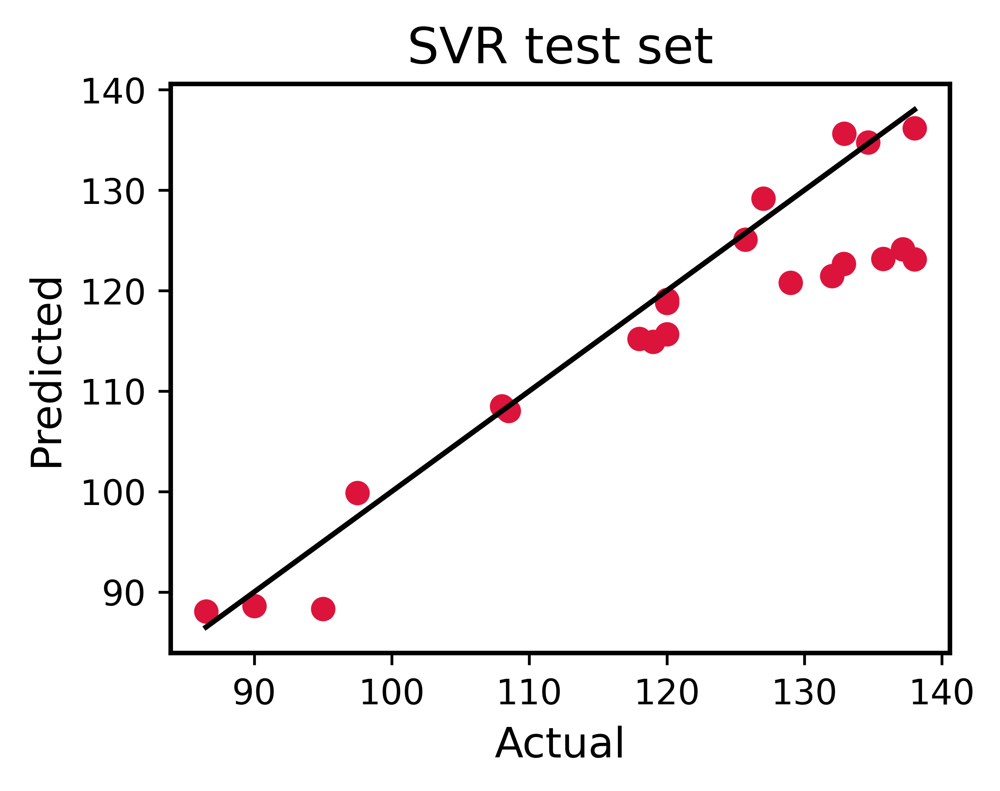

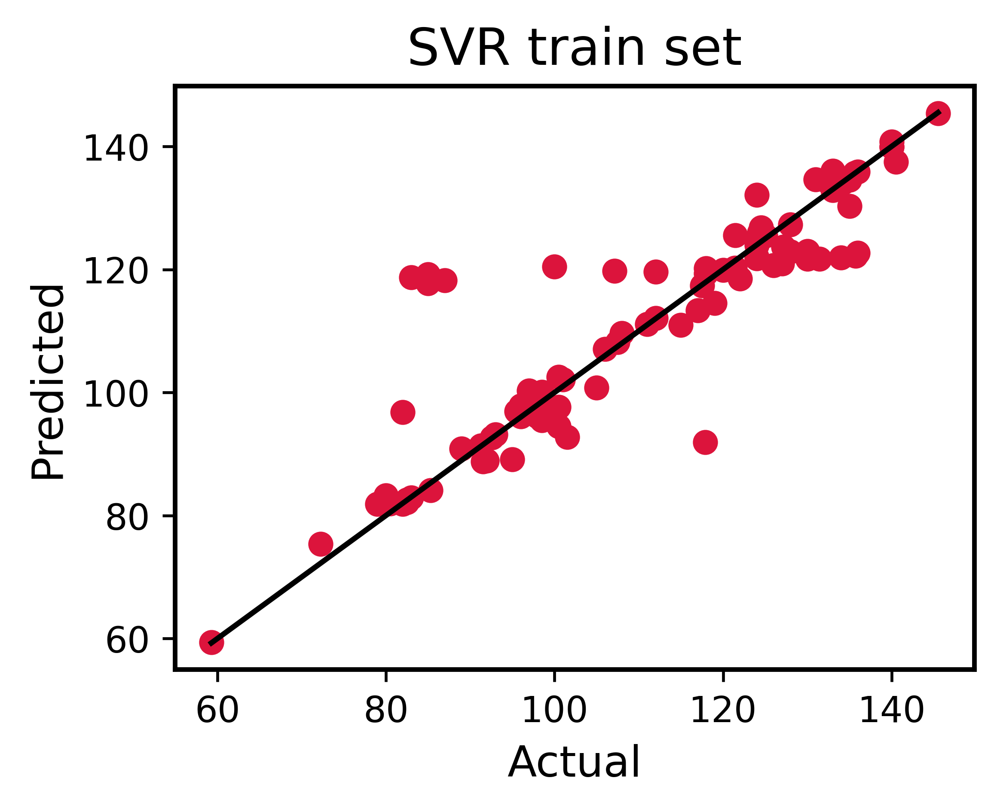

In [151]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'angle mean'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



LEN 129
trains [0.7809890879962021, 0.8313216429737527, 0.7713590835899602, 0.754068166392438, 0.8442661551127769]
tests [0.8767610376491979, 0.46312312256131904, 0.8713945995816779, 0.8304574973026835, 0.32898056078337046]
SVR  Train R^2: 0.79640 ± 0.03512, Test R^2: 0.67414 ± 0.23154
SVR  Train MAE: 4.49300 ± 0.56461, Test MAE: 6.15764 ± 2.43565


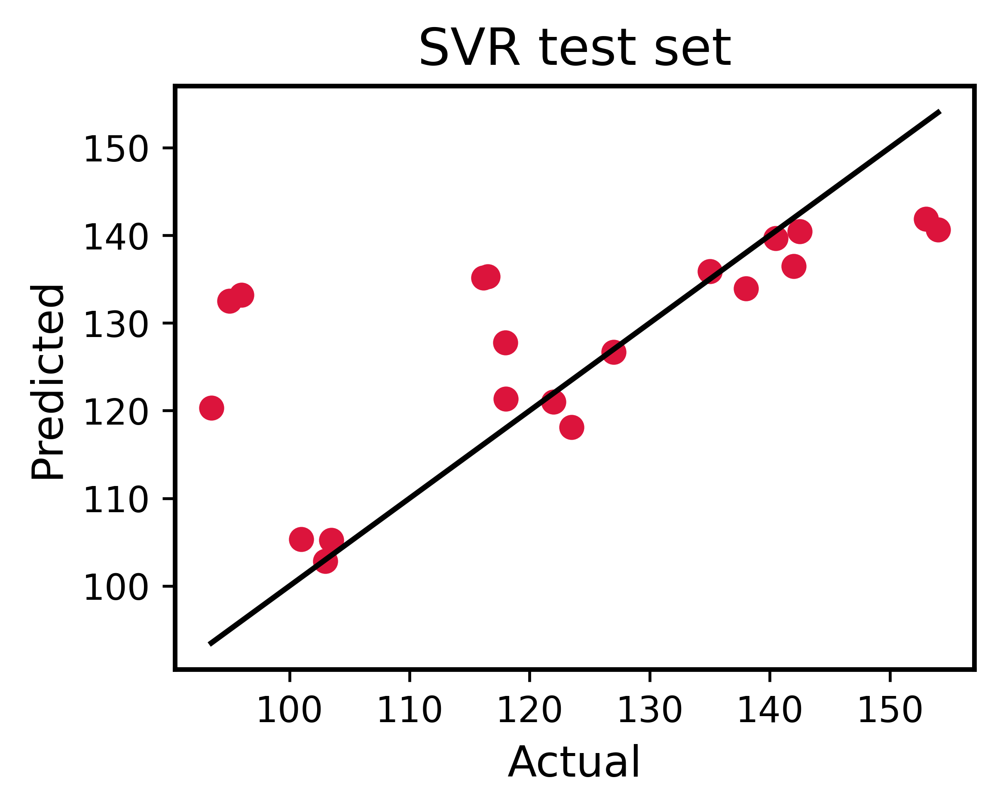

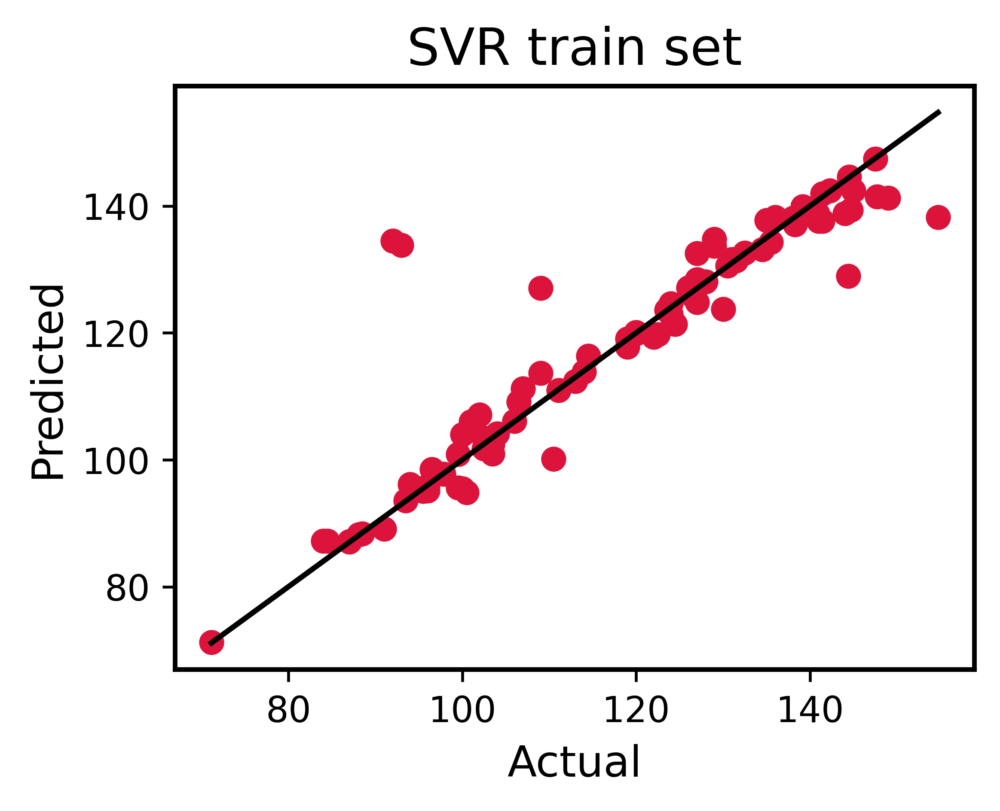

In [86]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'max angle'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



LEN 129
trains [0.8093825826229553, 0.8514924777667933, 0.807220796195667, 0.788564488284281, 0.8421306771067899]
tests [0.8118476541060722, 0.4611553725622939, 0.8728755785795754, 0.9063514357877441, 0.5641350112922289]
SVR  Train R^2: 0.81976 ± 0.02343, Test R^2: 0.72327 ± 0.17764
SVR  Train MAE: 5.04463 ± 0.42610, Test MAE: 6.92865 ± 1.96370


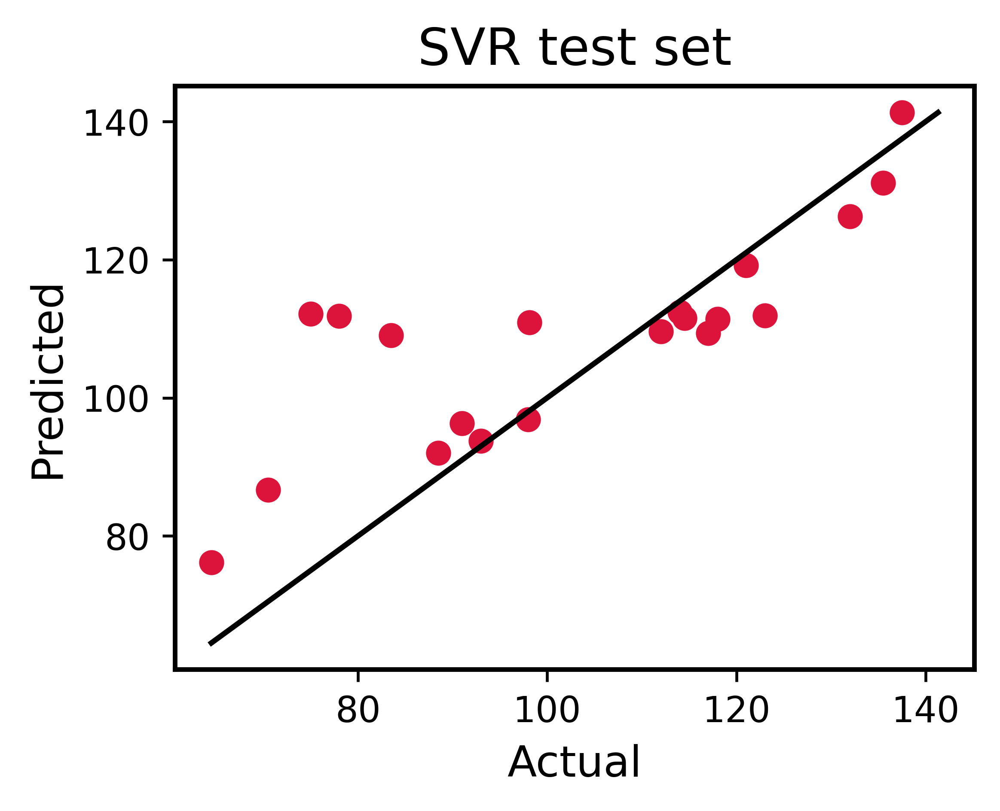

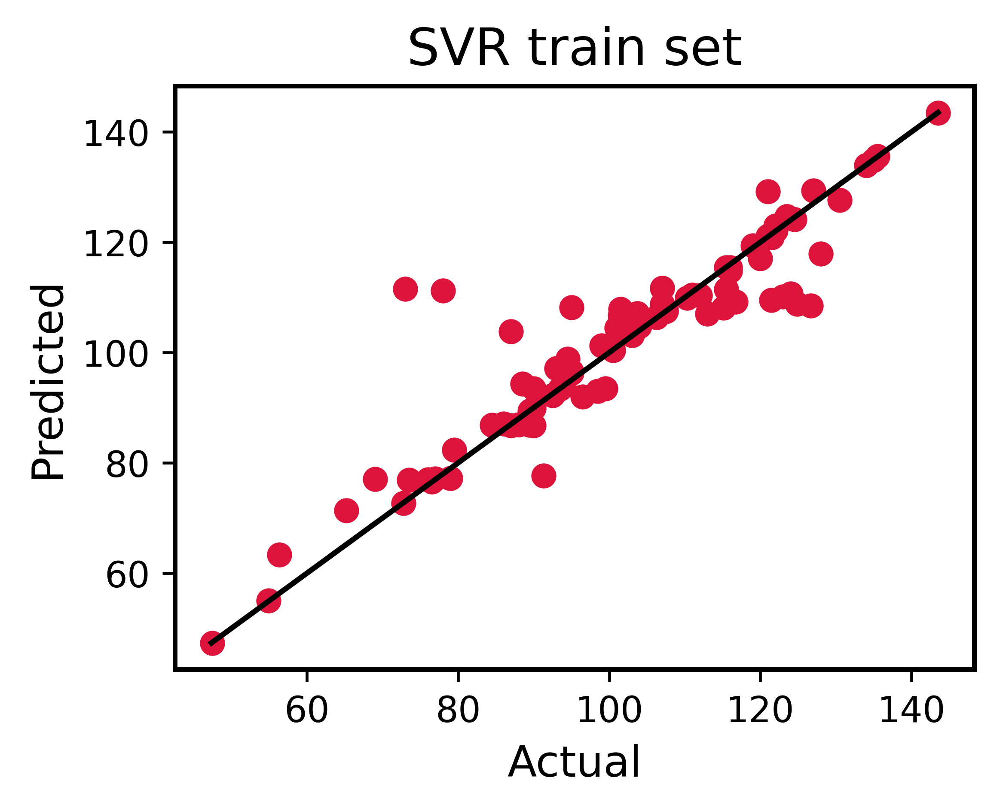

In [87]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'min angle'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



## GB

In [88]:
%matplotlib inline 

def learn(data, depth, material = None, parameters = None, title = None, plot = False, paper_ID= None):
    
    '''
    
    
    Iterate over the models, performing training/cross-validation and plotting regression results

    
    Arguments:
    data: Matrix array of data, n samples x m features, numpy array
    depth: vector of depth values, n samples x 1 feature, numpy array
    
    (Optional, only displayed on figure)
    material: Material that is trained on (string)
    parameters: parameters contained in data (list of strings)
    title: Any additional information (e.g. process, paper ID) to be specified (string)
    plot: Whether to produce plots
    
    Returns:
    fit_models: List of fit models
    train_accuracy: List of CV Pearson R^2
    train_accuracy_std: List of standard deviation of Pearson R^2
    test_accuracy: List of test Pearson R^2
    test_accuracy_std: List of standard deviation of Pearson R^2
   
    
    
    '''
    
    labels = depth

    params = { #'font.family'      : 'serif',
               'font.size'        : 12,
               'xtick.labelsize'  : 'small',
               'ytick.labelsize'  : 'small',
               #'axes.labelsize'   : 'large',
               'axes.linewidth'   : 1.3 }
    plt.rcParams.update(params)


    y  = labels
    X = data
    
    # transpose if shape of label and data do not match
    if len(X) != len(labels):
        X = X.T
        print(len(labels), len(X))
        print('transposed to ' + str(X.shape[0]) + ', ' + str(X.shape[1]))
        

    idx_normalize = len(X[0])

    #X=preprocessing.scale(X)       
    scaler = preprocessing.StandardScaler()
    X = scaler.fit_transform(X)
        
    fit_models = []
    train_accuracy = []
    train_accuracy_std = []
    test_accuracy = []
    test_accuracy_std = []
    
    
    # Iterate over implemented models
    modeltoggle= 'GB'
    model = GradientBoostingRegressor(n_estimators=463)

    # Perform cross validation for each model
    kf = KFold(n_splits=5)
    trains = []
    tests = []
    train_maes = []
    test_maes = []
    # Perform cross validation for each model

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    for train, test in kf.split(X_train):


        # Shuffle data points before prediction
        X_shuffle, y_shuffle = shuffle(X_train, y_train, random_state=42)

        X_cv_train = X_shuffle[train]
        X_cv_test = X_shuffle[test]
        y_cv_train = y_shuffle[train]
        y_cv_test = y_shuffle[test]


        model.fit(X_cv_train, y_cv_train)

        # Calculate MAE and R^2

        y_predtrain = model.predict(X_cv_train)
        y_predtest = model.predict(X_cv_test)
        trains.append(model.score(X_cv_train, y_cv_train))
        tests.append(model.score(X_cv_test, y_cv_test))



        mae_test = metrics.mean_absolute_error(y_cv_test, y_predtest)
        mae_train = metrics.mean_absolute_error(y_cv_train,y_predtrain)
        train_maes.append(mae_train)
        test_maes.append(mae_test)


    print('trains', trains)
    print('tests', tests)
    # Aggregate information
    trains = np.array(trains)
    tests = np.array(tests)
    train_maes = np.array(train_maes)
    test_maes = np.array(test_maes)
    r2_mean = tests.mean()
    r2_std = tests.std()
    r2_train_mean = trains.mean()
    r2_train_std =  trains.std()



    mae_mean_train = train_maes.mean()
    mae_mean_test = test_maes.mean()

    mae_mean_train_std = train_maes.std()
    mae_mean_test_std = test_maes.std()

    train_accuracy.append(r2_train_mean)
    test_accuracy_std.append(r2_std)
    test_accuracy.append(r2_mean)
    train_accuracy_std.append(r2_train_std)

    print(modeltoggle, ' Train R^2: {:.5f} ± {:.5f}, Test R^2: {:.5f} ± {:.5f}'.
            format( r2_train_mean, r2_train_std, r2_mean, r2_std))

    
    print(modeltoggle, ' Train MAE: {:.5f} ± {:.5f}, Test MAE: {:.5f} ± {:.5f}'.
            format( mae_mean_train,mae_mean_train_std, mae_mean_test, mae_mean_test_std))
        
        
        
#     #cv= RepeatedKFold(n_splits=5, n_repeats=5, random_state=1)
#     cv= KFold(n_splits=5, shuffle=True, random_state=10)

#     n_scores= cross_val_score(model, X, y, scoring='r2', cv=cv, n_jobs=-1)
#     print('accuracy: %.5f (%.5f)'% (mean(n_scores), std(n_scores)))
        
    # Plot results: everything scaled back to original values by multiplying by std and adding mean of training labels
    if modeltoggle == 'RF':
        fig = plt.figure(figsize = [4,3], dpi = 600)
        importance = model.feature_importances_
        indices = np.argsort(importance)
        plt.title('RF Feature Importance')
        plt.barh(range(len(indices)), importance[indices], color='c', align='center')
        plt.yticks(range(len(indices)), [parameter_list[i] for i in indices])
        plt.xlabel('relative importance')
        plt.show()
        #print(importance)
            #plt.barh(parameter_list, model.feature_importances_)

    if plot:
        fig = plt.figure(figsize = [4,3], dpi = 600)
        plt.scatter(y_cv_test, y_predtest, c='crimson')
        p1= max(max(y_predtest), max(y_cv_test))
        p2= min(min(y_predtest), min(y_cv_test))
        plt.plot([p1,p2], [p1,p2], 'k-')
        plt.title(modeltoggle+ ' test set')
        plt.xlabel("Actual")
        plt.ylabel("Predicted")
        
        fig = plt.figure(figsize = [4,3], dpi = 600)
        plt.scatter(y_cv_train, y_predtrain, c='crimson')
        p1= max(max(y_predtrain), max(y_cv_train))
        p2= min(min(y_predtrain), min(y_cv_train))
        plt.plot([p1,p2], [p1,p2], 'k-')
        plt.title(modeltoggle+ ' train set')
        plt.xlabel("Actual")
        plt.ylabel("Predicted")
        

    return fit_models, train_accuracy, train_accuracy_std, test_accuracy, test_accuracy_std 

LEN 88
trains [0.999999726318605, 0.9999998429491097, 0.9999999240273489, 0.9999998745219528, 0.9999992268272623]
tests [0.9698878748861438, 0.9290610807243401, 0.9439034476898214, 0.9815527444538595, 0.9240170113733688]
GB  Train R^2: 1.00000 ± 0.00000, Test R^2: 0.94968 ± 0.02254
GB  Train MAE: 0.00085 ± 0.00037, Test MAE: 0.34617 ± 0.10021


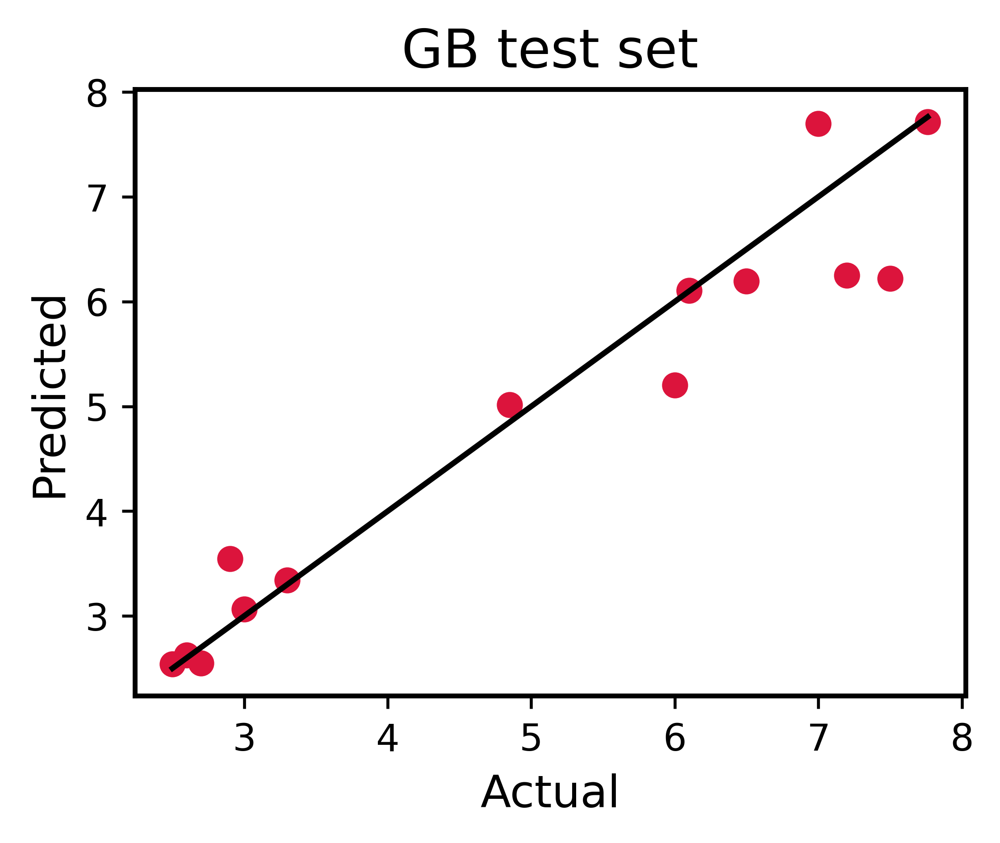

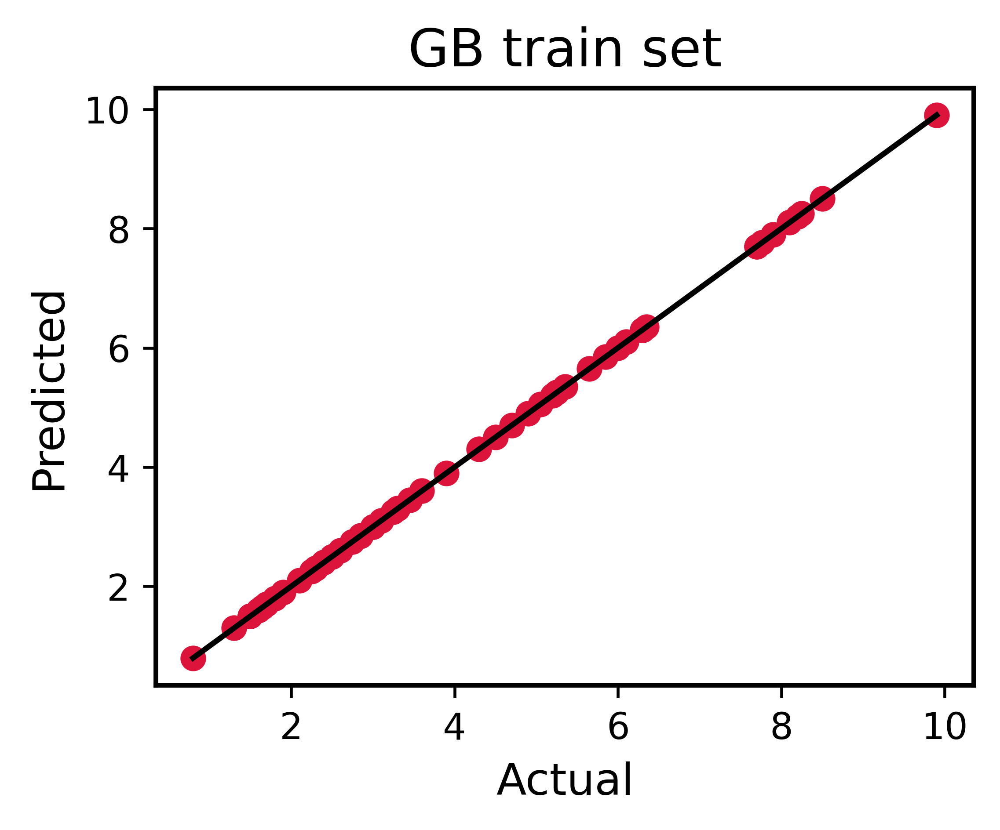

In [89]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'velocity mean'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



LEN 83
trains [0.9999998360878812, 0.9999999792381544, 0.9999999226790917, 0.9999997557597737, 0.9999998937703735]
tests [0.8187278244124081, 0.9511384067777848, 0.8537207766298737, 0.9646504737853729, 0.8030561657242847]
GB  Train R^2: 1.00000 ± 0.00000, Test R^2: 0.87826 ± 0.06720
GB  Train MAE: 0.00062 ± 0.00020, Test MAE: 0.51991 ± 0.18297


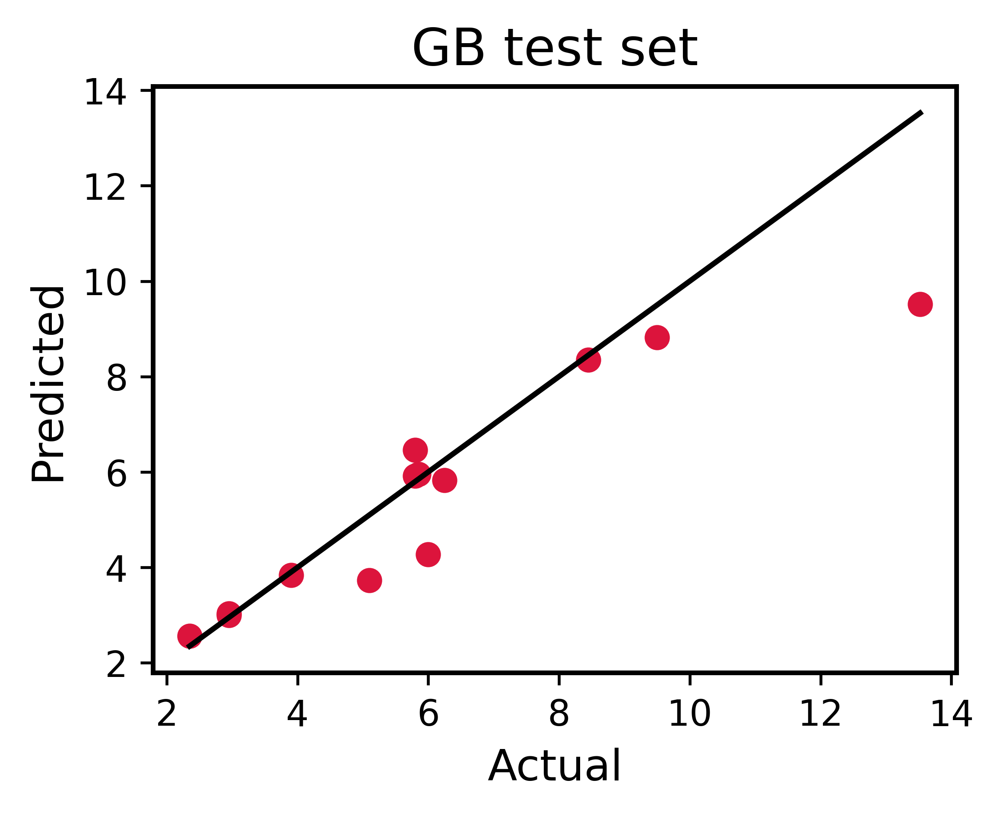

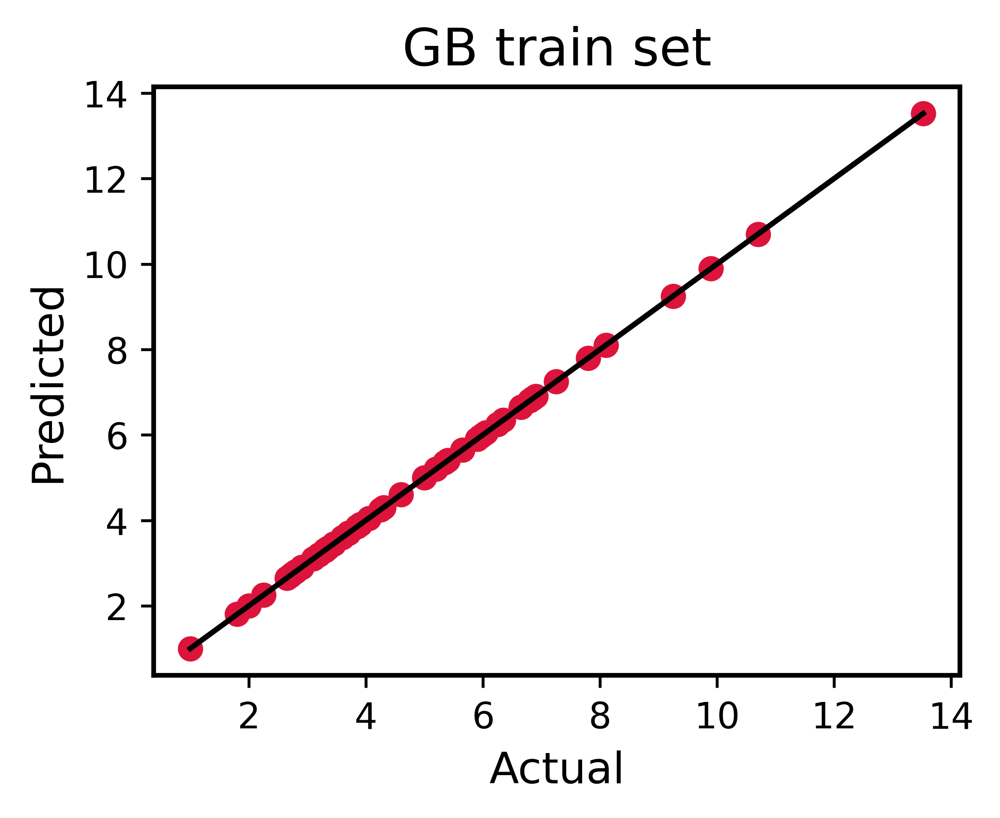

In [90]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'max velocity'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



LEN 83
trains [0.99999906223774, 0.9999999172757892, 0.9999999144820456, 0.9999997669201575, 0.9999997601702793]
tests [0.7220164980470052, 0.7887269280071004, 0.6343734163480277, 0.9543189190398608, 0.8134510368655845]
GB  Train R^2: 1.00000 ± 0.00000, Test R^2: 0.78258 ± 0.10594
GB  Train MAE: 0.00070 ± 0.00026, Test MAE: 0.52566 ± 0.12163


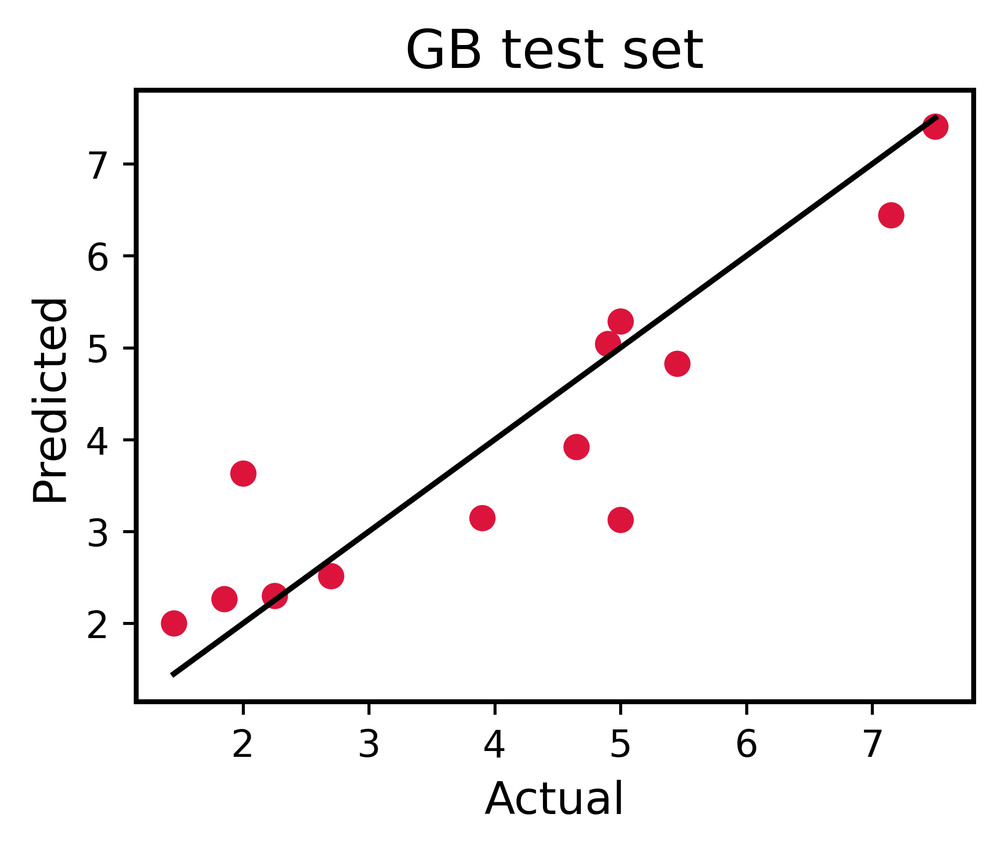

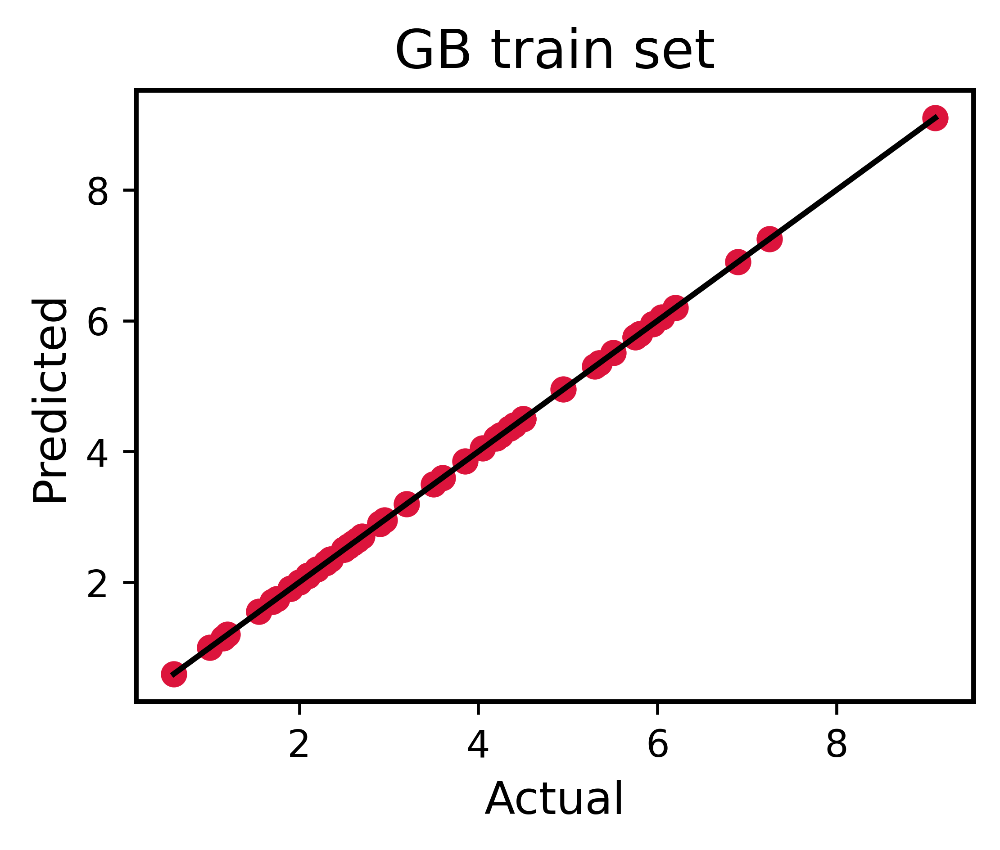

In [91]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'min velocity'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



In [83]:
%matplotlib inline 

def learn(data, depth, material = None, parameters = None, title = None, plot = False, paper_ID= None):
    
    '''
    
    
    Iterate over the models, performing training/cross-validation and plotting regression results

    
    Arguments:
    data: Matrix array of data, n samples x m features, numpy array
    depth: vector of depth values, n samples x 1 feature, numpy array
    
    (Optional, only displayed on figure)
    material: Material that is trained on (string)
    parameters: parameters contained in data (list of strings)
    title: Any additional information (e.g. process, paper ID) to be specified (string)
    plot: Whether to produce plots
    
    Returns:
    fit_models: List of fit models
    train_accuracy: List of CV Pearson R^2
    train_accuracy_std: List of standard deviation of Pearson R^2
    test_accuracy: List of test Pearson R^2
    test_accuracy_std: List of standard deviation of Pearson R^2
   
    
    
    '''
    
    labels = depth

    params = { #'font.family'      : 'serif',
               'font.size'        : 12,
               'xtick.labelsize'  : 'small',
               'ytick.labelsize'  : 'small',
               #'axes.labelsize'   : 'large',
               'axes.linewidth'   : 1.3 }
    plt.rcParams.update(params)


    y  = labels
    X = data
    
    # transpose if shape of label and data do not match
    if len(X) != len(labels):
        X = X.T
        print(len(labels), len(X))
        print('transposed to ' + str(X.shape[0]) + ', ' + str(X.shape[1]))
        

    idx_normalize = len(X[0])

    #X=preprocessing.scale(X)       
    scaler = preprocessing.StandardScaler()
    X = scaler.fit_transform(X)
        
    fit_models = []
    train_accuracy = []
    train_accuracy_std = []
    test_accuracy = []
    test_accuracy_std = []
    
    
    # Iterate over implemented models
    modeltoggle= 'GB'
    model = GradientBoostingRegressor(n_estimators=463)

    # Perform cross validation for each model
    kf = KFold(n_splits=5)
    trains = []
    tests = []
    train_maes = []
    test_maes = []
    # Perform cross validation for each model

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    for train, test in kf.split(X_train):


        # Shuffle data points before prediction
        X_shuffle, y_shuffle = shuffle(X_train, y_train, random_state=42)

        X_cv_train = X_shuffle[train]
        X_cv_test = X_shuffle[test]
        y_cv_train = y_shuffle[train]
        y_cv_test = y_shuffle[test]


        model.fit(X_cv_train, y_cv_train)

        # Calculate MAE and R^2

        y_predtrain = model.predict(X_cv_train)
        y_predtest = model.predict(X_cv_test)
        trains.append(model.score(X_cv_train, y_cv_train))
        tests.append(model.score(X_cv_test, y_cv_test))



        mae_test = metrics.mean_absolute_error(y_cv_test, y_predtest)
        mae_train = metrics.mean_absolute_error(y_cv_train,y_predtrain)
        train_maes.append(mae_train)
        test_maes.append(mae_test)


    print('trains', trains)
    print('tests', tests)
    # Aggregate information
    trains = np.array(trains)
    tests = np.array(tests)
    train_maes = np.array(train_maes)
    test_maes = np.array(test_maes)
    r2_mean = tests.mean()
    r2_std = tests.std()
    r2_train_mean = trains.mean()
    r2_train_std =  trains.std()



    mae_mean_train = train_maes.mean()
    mae_mean_test = test_maes.mean()

    mae_mean_train_std = train_maes.std()
    mae_mean_test_std = test_maes.std()

    train_accuracy.append(r2_train_mean)
    test_accuracy_std.append(r2_std)
    test_accuracy.append(r2_mean)
    train_accuracy_std.append(r2_train_std)

    print(modeltoggle, ' Train R^2: {:.5f} ± {:.5f}, Test R^2: {:.5f} ± {:.5f}'.
            format( r2_train_mean, r2_train_std, r2_mean, r2_std))

    
    print(modeltoggle, ' Train MAE: {:.5f} ± {:.5f}, Test MAE: {:.5f} ± {:.5f}'.
            format( mae_mean_train,mae_mean_train_std, mae_mean_test, mae_mean_test_std))
        
        
        
#     #cv= RepeatedKFold(n_splits=5, n_repeats=5, random_state=1)
#     cv= KFold(n_splits=5, shuffle=True, random_state=10)

#     n_scores= cross_val_score(model, X, y, scoring='r2', cv=cv, n_jobs=-1)
#     print('accuracy: %.5f (%.5f)'% (mean(n_scores), std(n_scores)))
        
    # Plot results: everything scaled back to original values by multiplying by std and adding mean of training labels
    if modeltoggle == 'RF':
        fig = plt.figure(figsize = [4,3], dpi = 600)
        importance = model.feature_importances_
        indices = np.argsort(importance)
        plt.title('RF Feature Importance')
        plt.barh(range(len(indices)), importance[indices], color='c', align='center')
        plt.yticks(range(len(indices)), [parameter_list[i] for i in indices])
        plt.xlabel('relative importance')
        plt.show()
        #print(importance)
            #plt.barh(parameter_list, model.feature_importances_)

    if plot:
        fig = plt.figure(figsize = [4,3], dpi = 300)
        plt.scatter(y_cv_test, y_predtest, c='seagreen')
        p1= max(max(y_predtest), max(y_cv_test))
        p2= min(min(y_predtest), min(y_cv_test))
        plt.plot([p1,p2], [p1,p2], 'k-')
        plt.title(modeltoggle+ ' test set')
        plt.xlabel("Actual")
        plt.ylabel("Predicted")
        
        fig = plt.figure(figsize = [4,3], dpi = 300)
        plt.scatter(y_cv_train, y_predtrain, c='purple')
        p1= max(max(y_predtrain), max(y_cv_train))
        p2= min(min(y_predtrain), min(y_cv_train))
        plt.plot([p1,p2], [p1,p2], 'k-')
        plt.title(modeltoggle+ ' train set')
        plt.xlabel("Actual")
        plt.ylabel("Predicted")
        

    return fit_models, train_accuracy, train_accuracy_std, test_accuracy, test_accuracy_std 

LEN 97
trains [0.9999944616834786, 0.9999979732459701, 0.99999607142349, 0.99999917944811, 0.999997735369714]
tests [0.9587694354512559, 0.32234142396328747, 0.9018251005777888, 0.9804804970596414, 0.924750028571963]
GB  Train R^2: 1.00000 ± 0.00000, Test R^2: 0.81763 ± 0.24912
GB  Train MAE: 0.02129 ± 0.00514, Test MAE: 3.70927 ± 1.85171


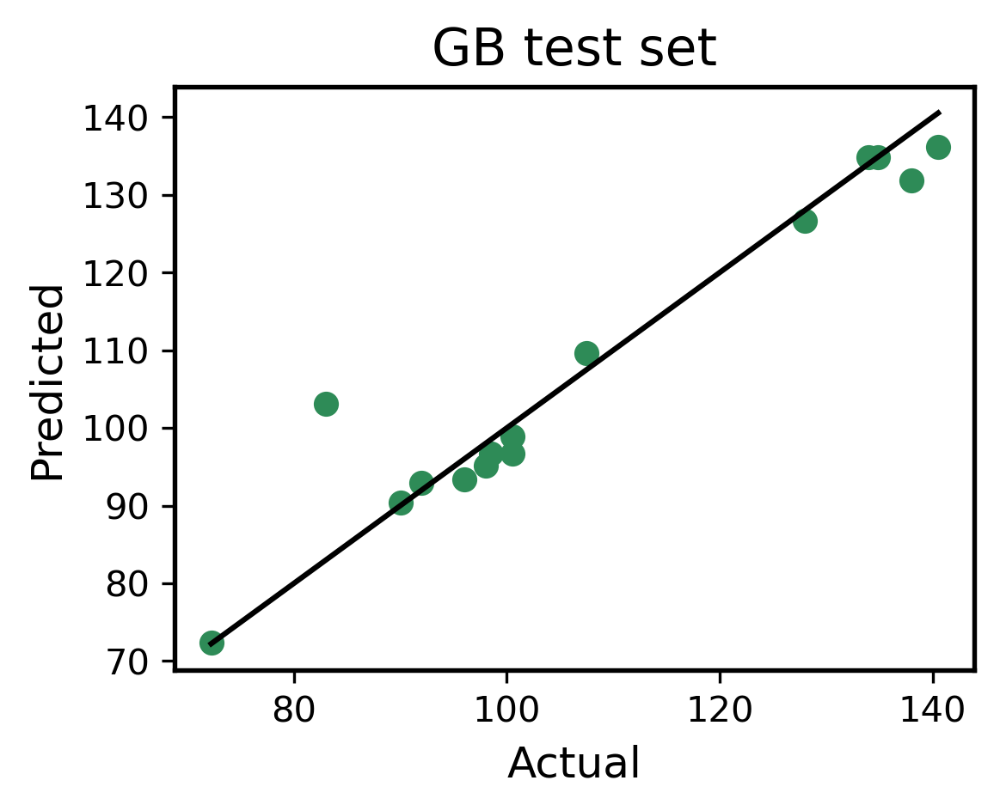

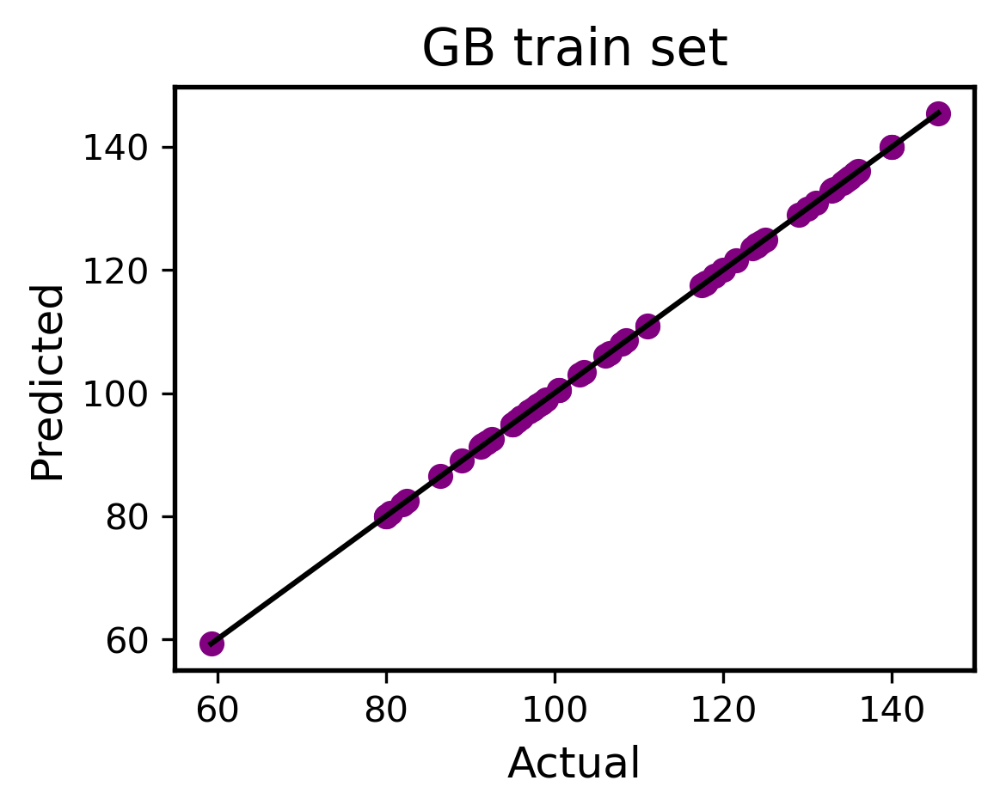

In [84]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'angle mean'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')


LEN 85
trains [0.9999992368855466, 0.9999996727493505, 0.999999755084503, 0.9999995970379482, 0.999999506220822]
tests [0.9789736388606243, 0.9645659598951668, 0.6786979874200585, 0.9034425211814127, 0.9749445743047108]
GB  Train R^2: 1.00000 ± 0.00000, Test R^2: 0.90012 ± 0.11403
GB  Train MAE: 0.00930 ± 0.00106, Test MAE: 3.62719 ± 0.82008


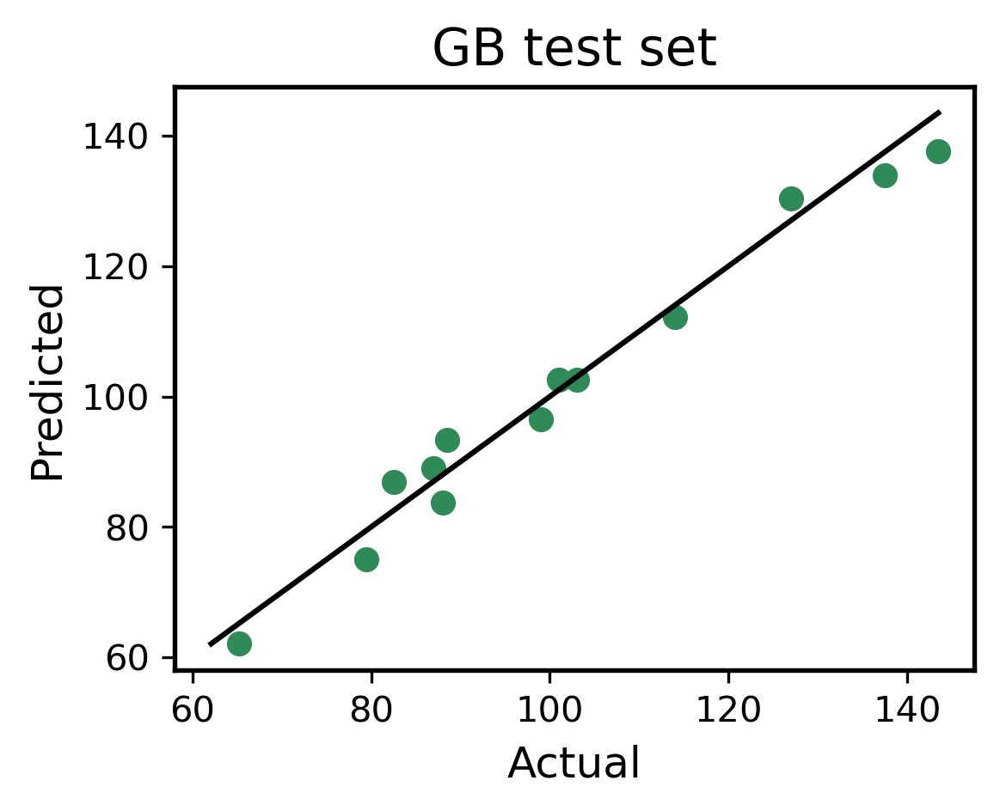

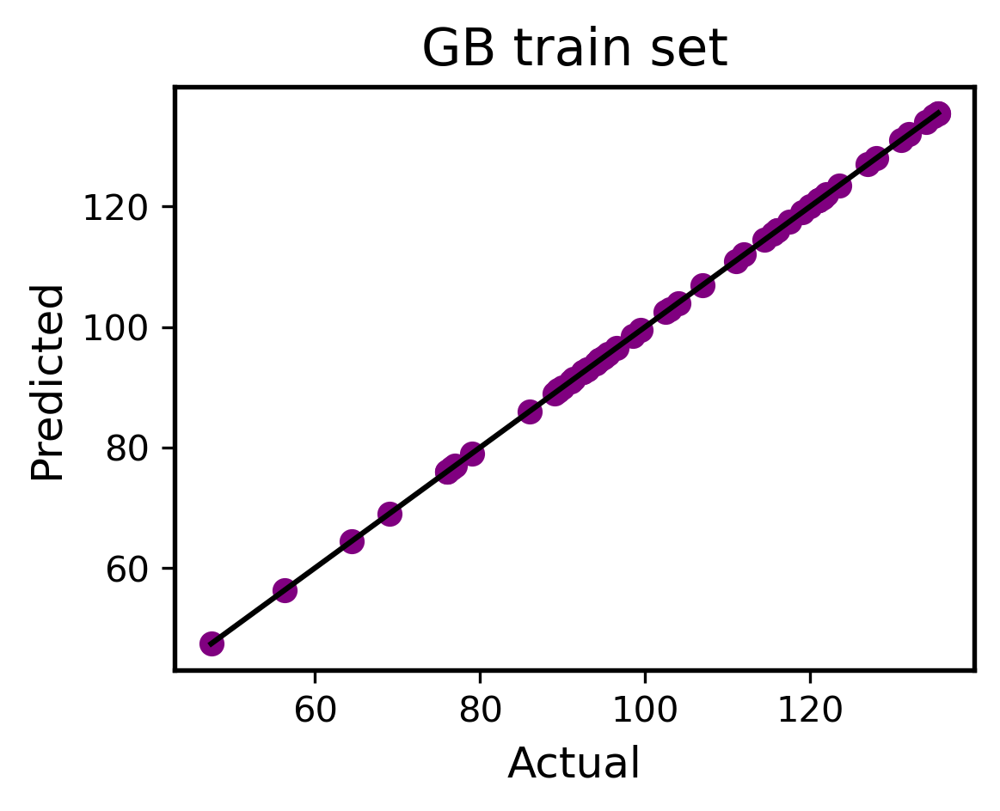

In [85]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'min angle'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')


LEN 85
trains [0.9999999097424414, 0.9999998248331546, 0.9999996239059253, 0.9999999357472975, 0.9999996933668467]
tests [0.9464280364598681, 0.9173688536627412, 0.43624431465189284, 0.947396094362804, 0.9206232370232107]
GB  Train R^2: 1.00000 ± 0.00000, Test R^2: 0.83361 ± 0.19908
GB  Train MAE: 0.00592 ± 0.00187, Test MAE: 4.00739 ± 1.53454


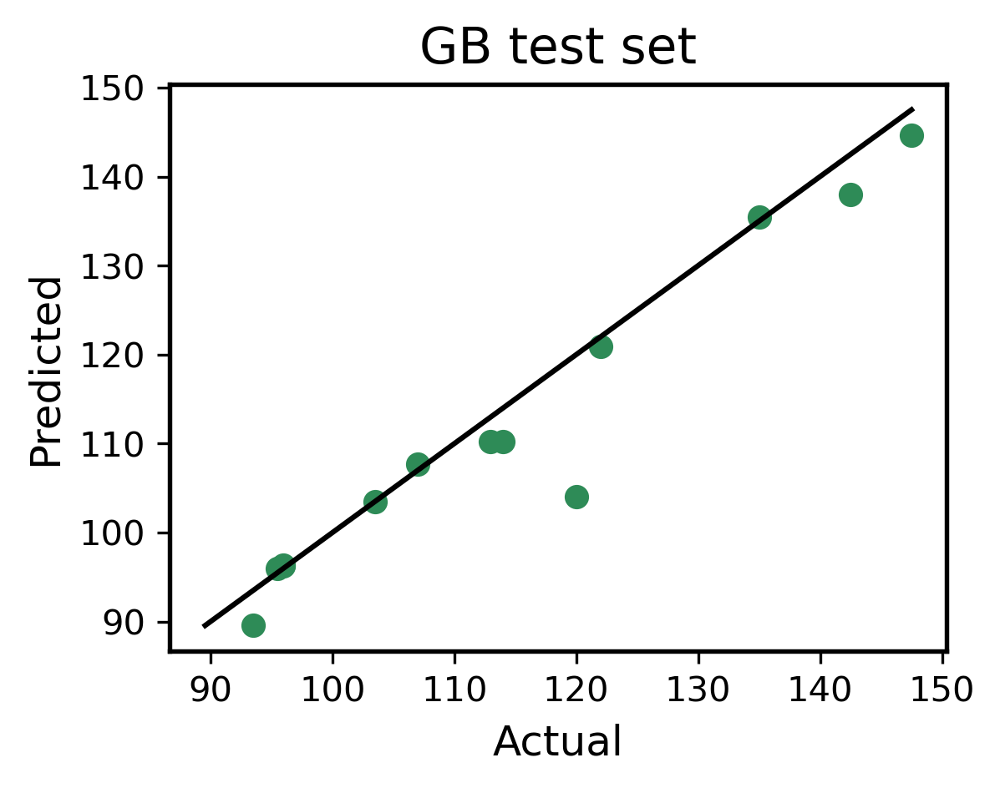

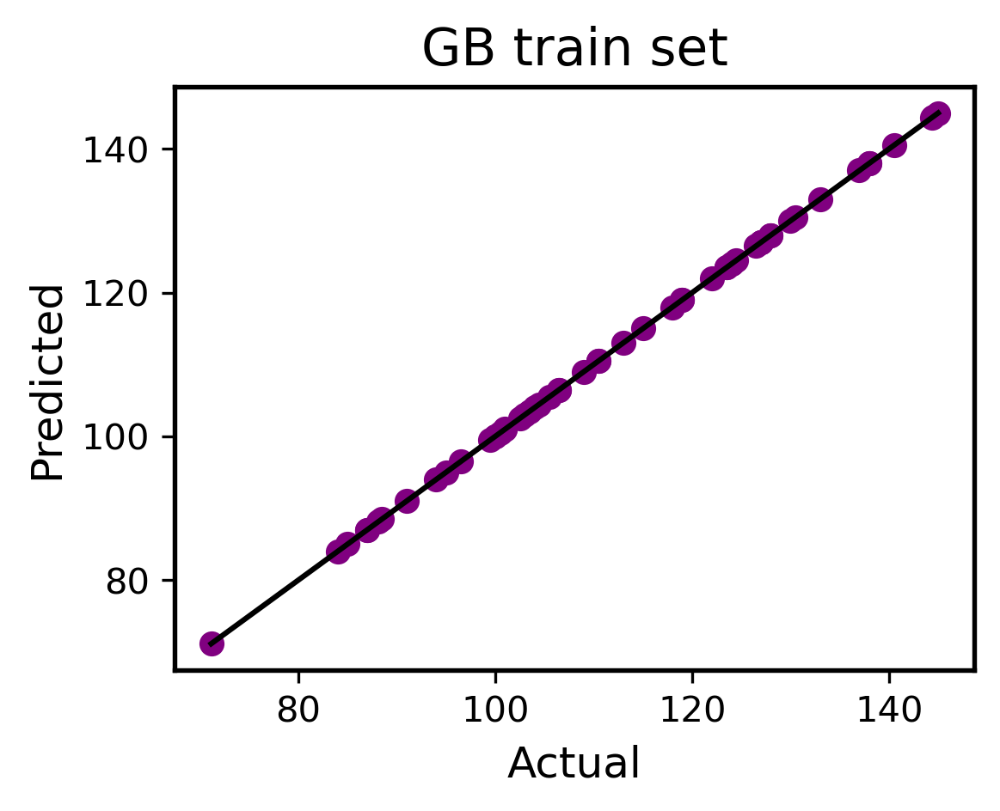

In [88]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'max angle'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')


## NN

In [96]:
%matplotlib inline 

def learn(data, depth, material = None, parameters = None, title = None, plot = False, paper_ID= None):
    
    '''
    
    
    Iterate over the models, performing training/cross-validation and plotting regression results

    
    Arguments:
    data: Matrix array of data, n samples x m features, numpy array
    depth: vector of depth values, n samples x 1 feature, numpy array
    
    (Optional, only displayed on figure)
    material: Material that is trained on (string)
    parameters: parameters contained in data (list of strings)
    title: Any additional information (e.g. process, paper ID) to be specified (string)
    plot: Whether to produce plots
    
    Returns:
    fit_models: List of fit models
    train_accuracy: List of CV Pearson R^2
    train_accuracy_std: List of standard deviation of Pearson R^2
    test_accuracy: List of test Pearson R^2
    test_accuracy_std: List of standard deviation of Pearson R^2
   
    
    
    '''
    
    labels = depth

    params = { #'font.family'      : 'serif',
               'font.size'        : 12,
               'xtick.labelsize'  : 'small',
               'ytick.labelsize'  : 'small',
               #'axes.labelsize'   : 'large',
               'axes.linewidth'   : 1.3 }
    plt.rcParams.update(params)


    y  = labels
    X = data
    
    # transpose if shape of label and data do not match
    if len(X) != len(labels):
        X = X.T
        print(len(labels), len(X))
        print('transposed to ' + str(X.shape[0]) + ', ' + str(X.shape[1]))
        

    idx_normalize = len(X[0])
    scaler = preprocessing.StandardScaler()
    X = scaler.fit_transform(X)
    
    fit_models = []
    train_accuracy = []
    train_accuracy_std = []
    test_accuracy = []
    test_accuracy_std = []
    
    
    # Iterate over implemented models
    modeltoggle= 'NN'
    model = MLPRegressor(hidden_layer_sizes=(128, 32, 128), activation='relu', solver='adam', alpha=0.004929806801381234, max_iter = 20000)
       
    # Perform cross validation for each model
    kf = KFold(n_splits=5)
    trains = []
    tests = []
    train_maes = []
    test_maes = []
    # Perform cross validation for each model

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    for train, test in kf.split(X_train):


        # Shuffle data points before prediction
        X_shuffle, y_shuffle = shuffle(X_train, y_train, random_state=42)

        X_cv_train = X_shuffle[train]
        X_cv_test = X_shuffle[test]
        y_cv_train = y_shuffle[train]
        y_cv_test = y_shuffle[test]


        model.fit(X_cv_train, y_cv_train)

        # Calculate MAE and R^2

        y_predtrain = model.predict(X_cv_train)
        y_predtest = model.predict(X_cv_test)
        trains.append(model.score(X_cv_train, y_cv_train))
        tests.append(model.score(X_cv_test, y_cv_test))



        mae_test = metrics.mean_absolute_error(y_cv_test, y_predtest)
        mae_train = metrics.mean_absolute_error(y_cv_train,y_predtrain)
        train_maes.append(mae_train)
        test_maes.append(mae_test)


    print('trains', trains)
    print('tests', tests)
    # Aggregate information
    trains = np.array(trains)
    tests = np.array(tests)
    train_maes = np.array(train_maes)
    test_maes = np.array(test_maes)
    r2_mean = tests.mean()
    r2_std = tests.std()
    r2_train_mean = trains.mean()
    r2_train_std =  trains.std()



    mae_mean_train = train_maes.mean()
    mae_mean_test = test_maes.mean()

    mae_mean_train_std = train_maes.std()
    mae_mean_test_std = test_maes.std()

    train_accuracy.append(r2_train_mean)
    test_accuracy_std.append(r2_std)
    test_accuracy.append(r2_mean)
    train_accuracy_std.append(r2_train_std)

    print(modeltoggle, ' Train R^2: {:.5f} ± {:.5f}, Test R^2: {:.5f} ± {:.5f}'.
            format( r2_train_mean, r2_train_std, r2_mean, r2_std))

    
    print(modeltoggle, ' Train MAE: {:.5f} ± {:.5f}, Test MAE: {:.5f} ± {:.5f}'.
            format( mae_mean_train,mae_mean_train_std, mae_mean_test, mae_mean_test_std))
        
        
        
#     #cv= RepeatedKFold(n_splits=5, n_repeats=5, random_state=1)
#     cv= KFold(n_splits=5, shuffle=True, random_state=10)

#     n_scores= cross_val_score(model, X, y, scoring='r2', cv=cv, n_jobs=-1)
#     print('accuracy: %.5f (%.5f)'% (mean(n_scores), std(n_scores)))
        
    # Plot results: everything scaled back to original values by multiplying by std and adding mean of training labels
    if modeltoggle == 'RF':
        fig = plt.figure(figsize = [4,3], dpi = 600)
        importance = model.feature_importances_
        indices = np.argsort(importance)
        plt.title('RF Feature Importance')
        plt.barh(range(len(indices)), importance[indices], color='c', align='center')
        plt.yticks(range(len(indices)), [parameter_list[i] for i in indices])
        plt.xlabel('relative importance')
        plt.show()
        #print(importance)
            #plt.barh(parameter_list, model.feature_importances_)

    if plot:
        fig = plt.figure(figsize = [4,3], dpi = 600)
        plt.scatter(y_cv_test, y_predtest, c='seagreen')
        p1= max(max(y_predtest), max(y_cv_test))
        p2= min(min(y_predtest), min(y_cv_test))
        plt.plot([p1,p2], [p1,p2], 'k-')
        plt.title(modeltoggle+ ' test set')
        plt.xlabel("Actual")
        plt.ylabel("Predicted")
        
        fig = plt.figure(figsize = [4,3], dpi = 600)
        plt.scatter(y_cv_train, y_predtrain, c='purple')
        p1= max(max(y_predtrain), max(y_cv_train))
        p2= min(min(y_predtrain), min(y_cv_train))
        plt.plot([p1,p2], [p1,p2], 'k-')
        plt.title(modeltoggle+ ' train set')
        plt.xlabel("Actual")
        plt.ylabel("Predicted")
        
        
    return fit_models, train_accuracy, train_accuracy_std, test_accuracy, test_accuracy_std 

LEN 88
trains [0.9932044975215298, 0.9906222969757281, 0.9933330439179412, 0.9912102185560938, 0.9951056910045499]
tests [0.9614049336551657, 0.9675663824284574, 0.9655557045983927, 0.9886442846555223, 0.9815067363586983]
NN  Train R^2: 0.99270 ± 0.00161, Test R^2: 0.97294 ± 0.01036
NN  Train MAE: 0.14931 ± 0.01630, Test MAE: 0.25253 ± 0.06442


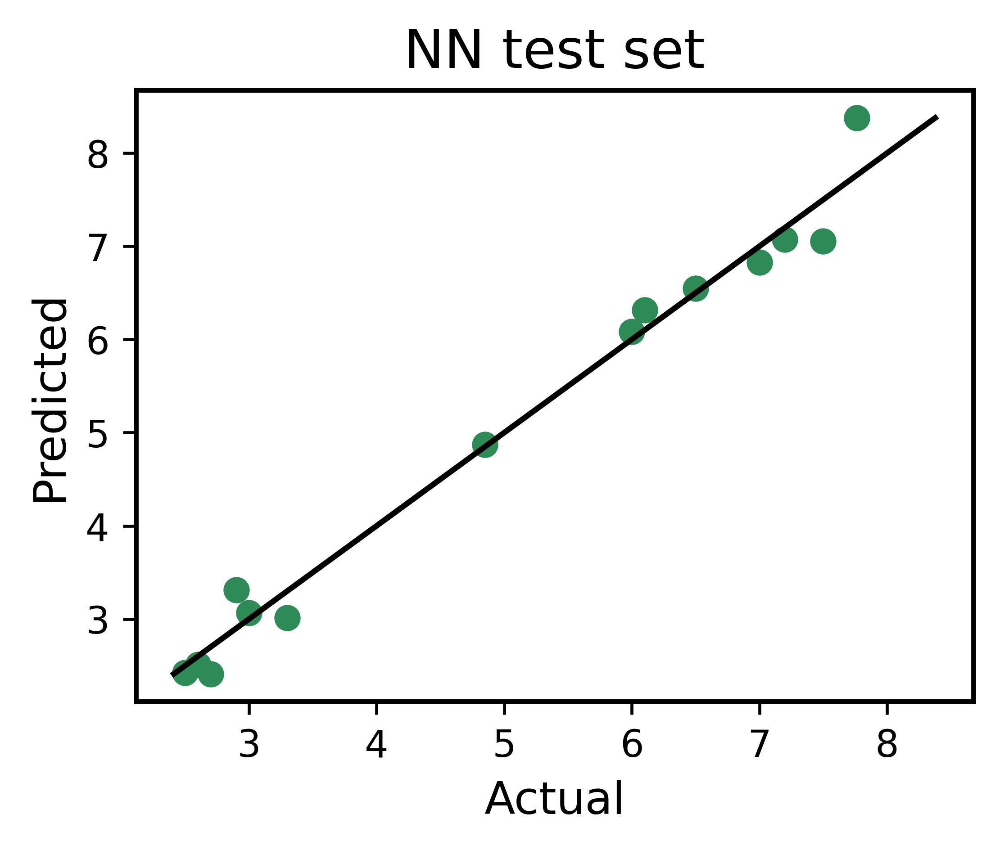

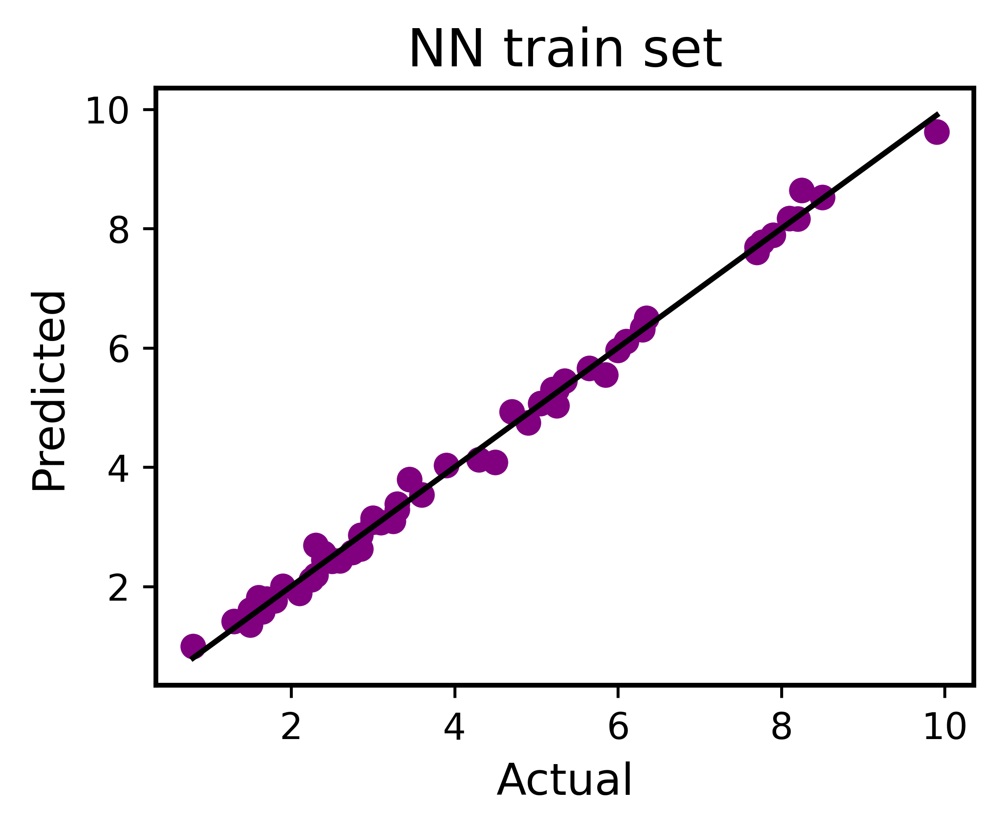

In [98]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'velocity mean'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



LEN 83
trains [0.9891378972550249, 0.8205871722293436, 0.9930597269841445, 0.9717726935992829, 0.9708759334156727]
tests [0.849408297477743, 0.8034061204501771, 0.8494666007166115, 0.9262873542922545, 0.9524612655000234]
NN  Train R^2: 0.94909 ± 0.06487, Test R^2: 0.87621 ± 0.05487
NN  Train MAE: 0.37112 ± 0.30176, Test MAE: 0.53487 ± 0.07747


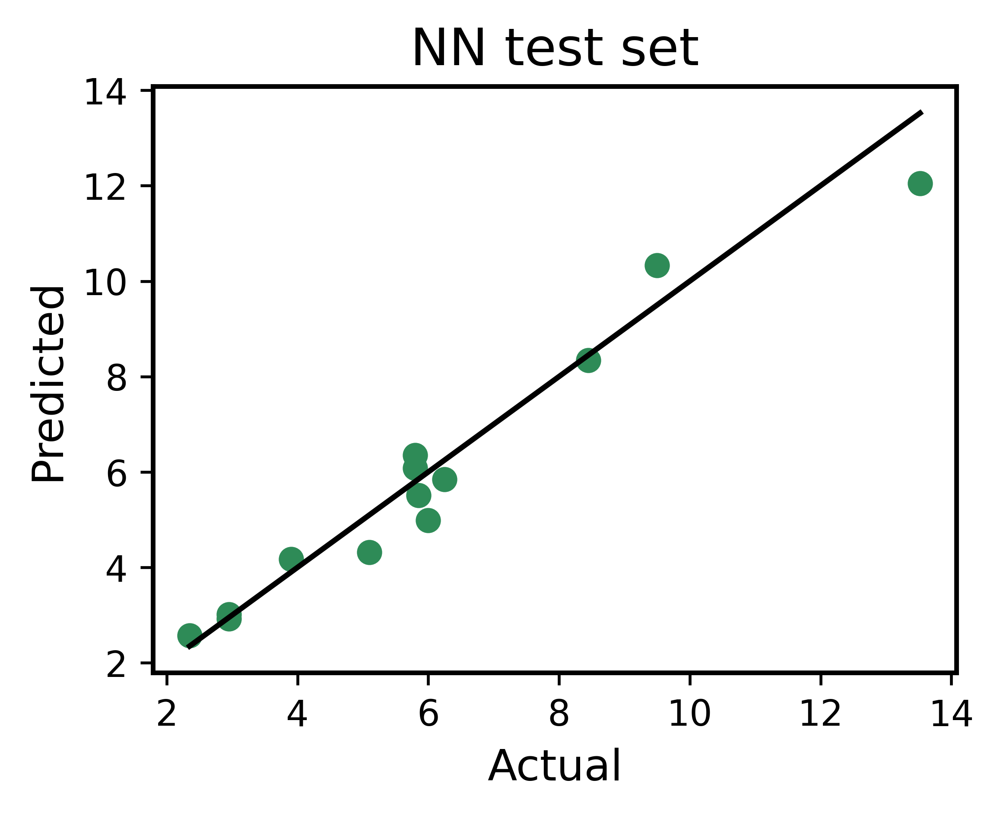

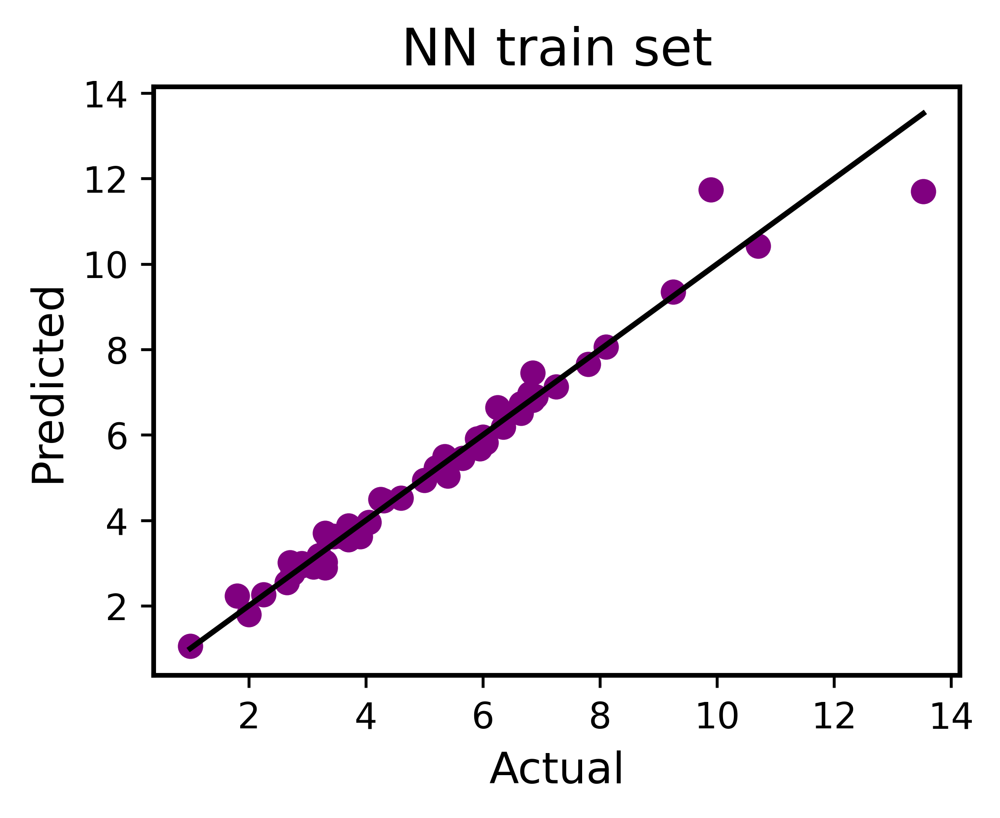

In [100]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'max velocity'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



LEN 83
trains [0.9875156028818286, 0.9605712325840319, 0.989852907628773, 0.9836004998278582, 0.9567871982702062]
tests [0.7787460583671002, 0.9792247077290086, 0.5586950511063233, 0.9699702092764004, 0.8069569071090761]
NN  Train R^2: 0.97567 ± 0.01406, Test R^2: 0.81872 ± 0.15361
NN  Train MAE: 0.17531 ± 0.03555, Test MAE: 0.40390 ± 0.15212


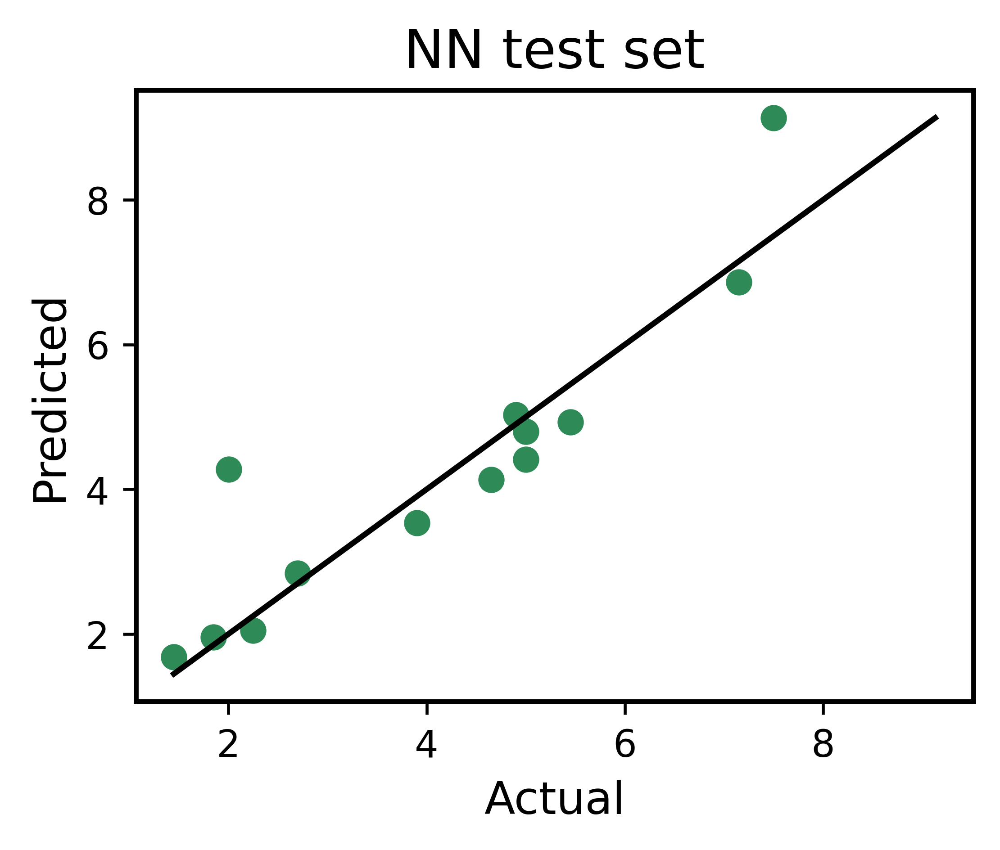

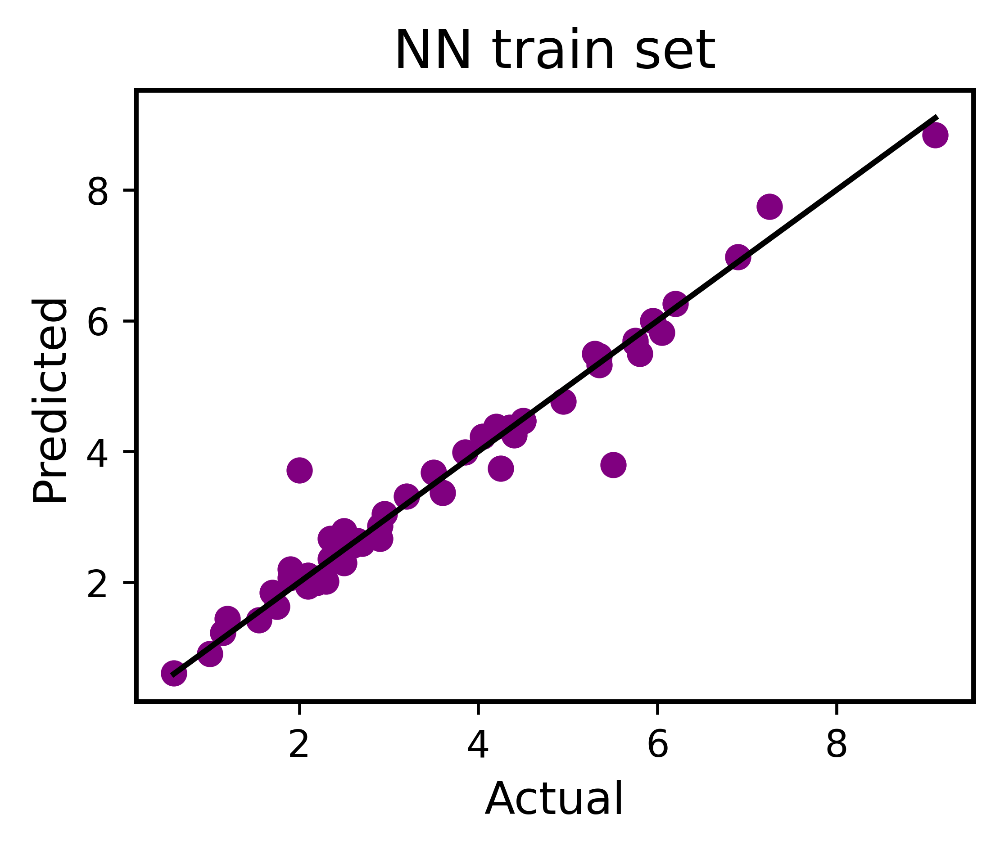

In [102]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'min velocity'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



In [60]:
%matplotlib inline 

def learn(data, depth, material = None, parameters = None, title = None, plot = False, paper_ID= None):
    
    '''
    
    
    Iterate over the models, performing training/cross-validation and plotting regression results

    
    Arguments:
    data: Matrix array of data, n samples x m features, numpy array
    depth: vector of depth values, n samples x 1 feature, numpy array
    
    (Optional, only displayed on figure)
    material: Material that is trained on (string)
    parameters: parameters contained in data (list of strings)
    title: Any additional information (e.g. process, paper ID) to be specified (string)
    plot: Whether to produce plots
    
    Returns:
    fit_models: List of fit models
    train_accuracy: List of CV Pearson R^2
    train_accuracy_std: List of standard deviation of Pearson R^2
    test_accuracy: List of test Pearson R^2
    test_accuracy_std: List of standard deviation of Pearson R^2
   
    
    
    '''
    
    labels = depth

    params = { #'font.family'      : 'serif',
               'font.size'        : 12,
               'xtick.labelsize'  : 'small',
               'ytick.labelsize'  : 'small',
               #'axes.labelsize'   : 'large',
               'axes.linewidth'   : 1.3 }
    plt.rcParams.update(params)


    y  = labels
    X = data
    
    # transpose if shape of label and data do not match
    if len(X) != len(labels):
        X = X.T
        print(len(labels), len(X))
        print('transposed to ' + str(X.shape[0]) + ', ' + str(X.shape[1]))
        

    idx_normalize = len(X[0])
    scaler = preprocessing.StandardScaler()
    X = scaler.fit_transform(X)
    
    fit_models = []
    train_accuracy = []
    train_accuracy_std = []
    test_accuracy = []
    test_accuracy_std = []
    
    
    # Iterate over implemented models
    modeltoggle= 'NN'
    model = MLPRegressor(hidden_layer_sizes=(32, 64, 256), activation='relu', solver='adam', alpha=0.07885869457990693, max_iter = 20000)
       
    # Perform cross validation for each model
    kf = KFold(n_splits=5)
    trains = []
    tests = []
    train_maes = []
    test_maes = []
    # Perform cross validation for each model

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    for train, test in kf.split(X_train):


        # Shuffle data points before prediction
        X_shuffle, y_shuffle = shuffle(X_train, y_train, random_state=42)

        X_cv_train = X_shuffle[train]
        X_cv_test = X_shuffle[test]
        y_cv_train = y_shuffle[train]
        y_cv_test = y_shuffle[test]


        model.fit(X_cv_train, y_cv_train)

        # Calculate MAE and R^2

        y_predtrain = model.predict(X_cv_train)
        y_predtest = model.predict(X_cv_test)
        trains.append(model.score(X_cv_train, y_cv_train))
        tests.append(model.score(X_cv_test, y_cv_test))



        mae_test = metrics.mean_absolute_error(y_cv_test, y_predtest)
        mae_train = metrics.mean_absolute_error(y_cv_train,y_predtrain)
        train_maes.append(mae_train)
        test_maes.append(mae_test)


    print('trains', trains)
    print('tests', tests)
    # Aggregate information
    trains = np.array(trains)
    tests = np.array(tests)
    train_maes = np.array(train_maes)
    test_maes = np.array(test_maes)
    r2_mean = tests.mean()
    r2_std = tests.std()
    r2_train_mean = trains.mean()
    r2_train_std =  trains.std()



    mae_mean_train = train_maes.mean()
    mae_mean_test = test_maes.mean()

    mae_mean_train_std = train_maes.std()
    mae_mean_test_std = test_maes.std()

    train_accuracy.append(r2_train_mean)
    test_accuracy_std.append(r2_std)
    test_accuracy.append(r2_mean)
    train_accuracy_std.append(r2_train_std)

    print(modeltoggle, ' Train R^2: {:.5f} ± {:.5f}, Test R^2: {:.5f} ± {:.5f}'.
            format( r2_train_mean, r2_train_std, r2_mean, r2_std))

    
    print(modeltoggle, ' Train MAE: {:.5f} ± {:.5f}, Test MAE: {:.5f} ± {:.5f}'.
            format( mae_mean_train,mae_mean_train_std, mae_mean_test, mae_mean_test_std))
        
        
        
#     #cv= RepeatedKFold(n_splits=5, n_repeats=5, random_state=1)
#     cv= KFold(n_splits=5, shuffle=True, random_state=10)

#     n_scores= cross_val_score(model, X, y, scoring='r2', cv=cv, n_jobs=-1)
#     print('accuracy: %.5f (%.5f)'% (mean(n_scores), std(n_scores)))
        
    # Plot results: everything scaled back to original values by multiplying by std and adding mean of training labels
    if modeltoggle == 'RF':
        fig = plt.figure(figsize = [4,3], dpi = 600)
        importance = model.feature_importances_
        indices = np.argsort(importance)
        plt.title('RF Feature Importance')
        plt.barh(range(len(indices)), importance[indices], color='c', align='center')
        plt.yticks(range(len(indices)), [parameter_list[i] for i in indices])
        plt.xlabel('relative importance')
        plt.show()
        #print(importance)
            #plt.barh(parameter_list, model.feature_importances_)

    if plot:
        fig = plt.figure(figsize = [4,3], dpi = 600)
        plt.scatter(y_cv_test, y_predtest, c='seagreen')
        p1= max(max(y_predtest), max(y_cv_test))
        p2= min(min(y_predtest), min(y_cv_test))
        plt.plot([p1,p2], [p1,p2], 'k-')
        plt.title(modeltoggle+ ' test set')
        plt.xlabel("Actual")
        plt.ylabel("Predicted")
        
        fig = plt.figure(figsize = [4,3], dpi = 600)
        plt.scatter(y_cv_train, y_predtrain, c='purple')
        p1= max(max(y_predtrain), max(y_cv_train))
        p2= min(min(y_predtrain), min(y_cv_train))
        plt.plot([p1,p2], [p1,p2], 'k-')
        plt.title(modeltoggle+ ' train set')
        plt.xlabel("Actual")
        plt.ylabel("Predicted")
        
        
    return fit_models, train_accuracy, train_accuracy_std, test_accuracy, test_accuracy_std 

LEN 97
trains [0.9936164576778773, 0.9963640098432084, 0.9988209388113117, 0.9911581128391254, 0.9965087558499814]
tests [0.9232131838646056, 0.05803273599395509, 0.911975862327056, 0.9633167007381516, 0.695317687784889]
NN  Train R^2: 0.99529 ± 0.00264, Test R^2: 0.71037 ± 0.33932
NN  Train MAE: 0.82362 ± 0.22602, Test MAE: 4.50950 ± 1.79698


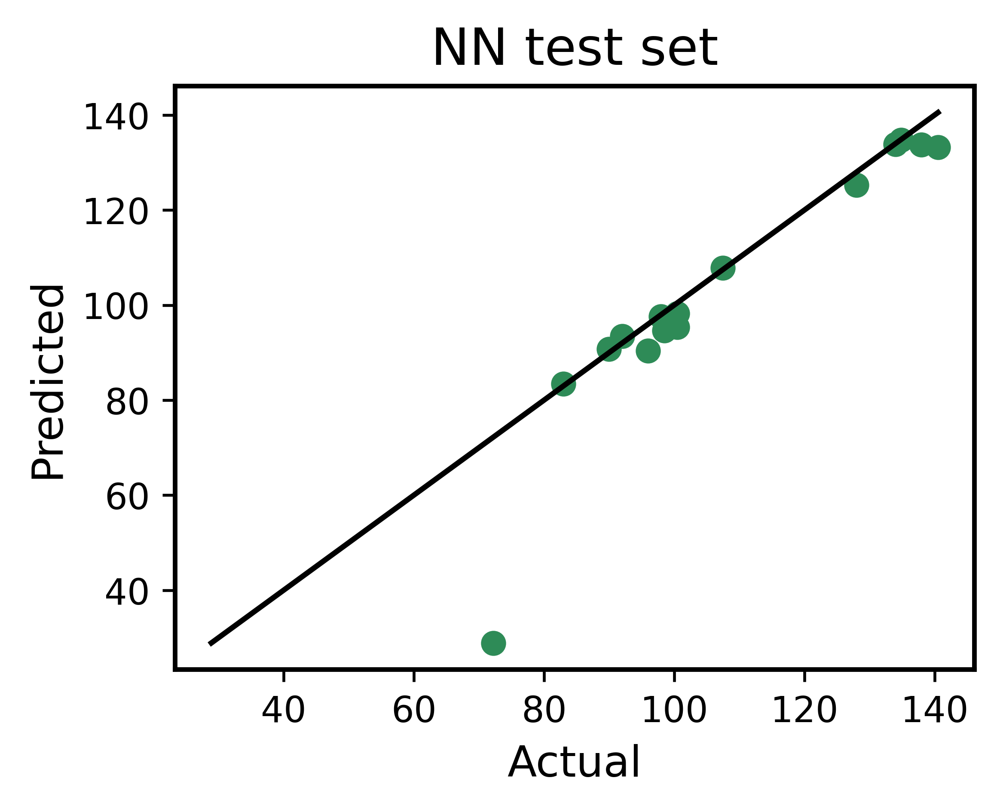

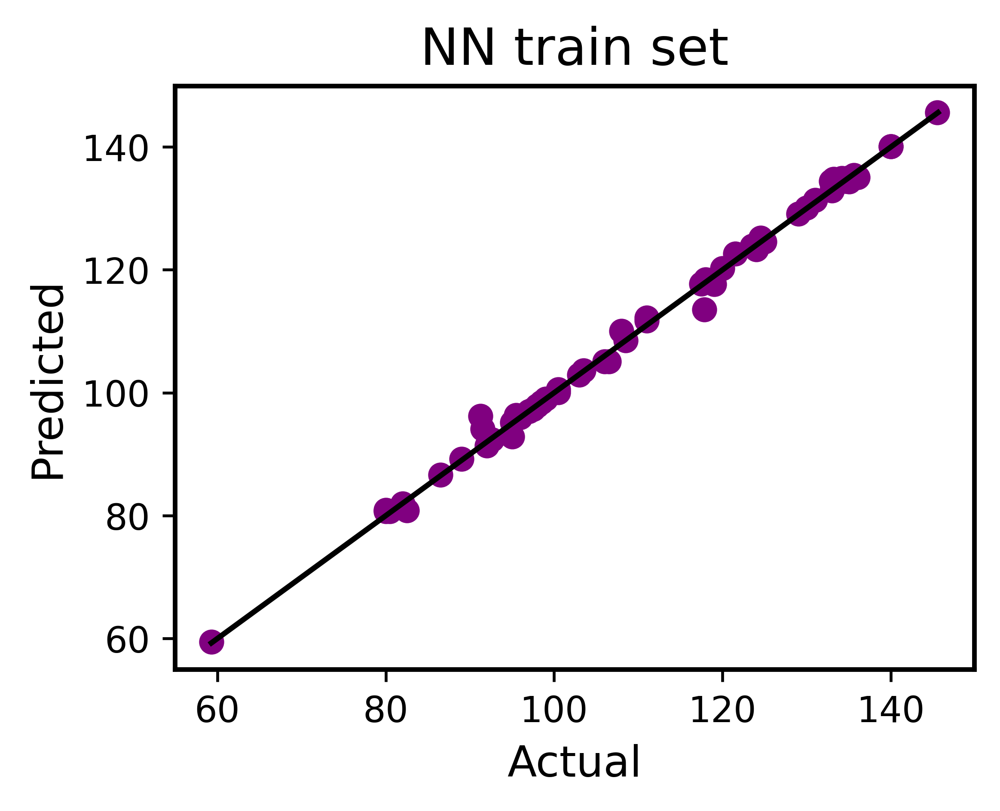

In [61]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'angle mean'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')


LEN 85
trains [0.998116572842336, 0.9972542183192783, 0.998494900264693, 0.9932558034436788, 0.9979328770290454]
tests [0.9315729516054106, -0.9943060730839028, 0.7511847213747317, 0.9617782898790173, 0.9494484731465267]
NN  Train R^2: 0.99701 ± 0.00192, Test R^2: 0.51994 ± 0.76099
NN  Train MAE: 0.70621 ± 0.17379, Test MAE: 5.16370 ± 3.81037


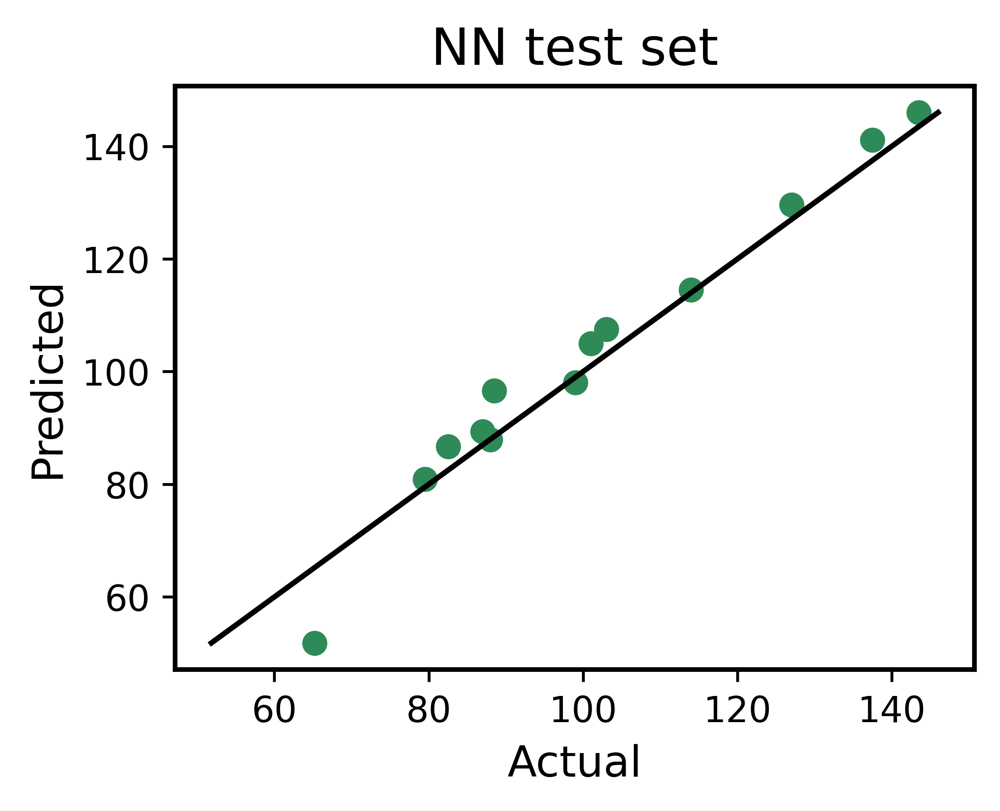

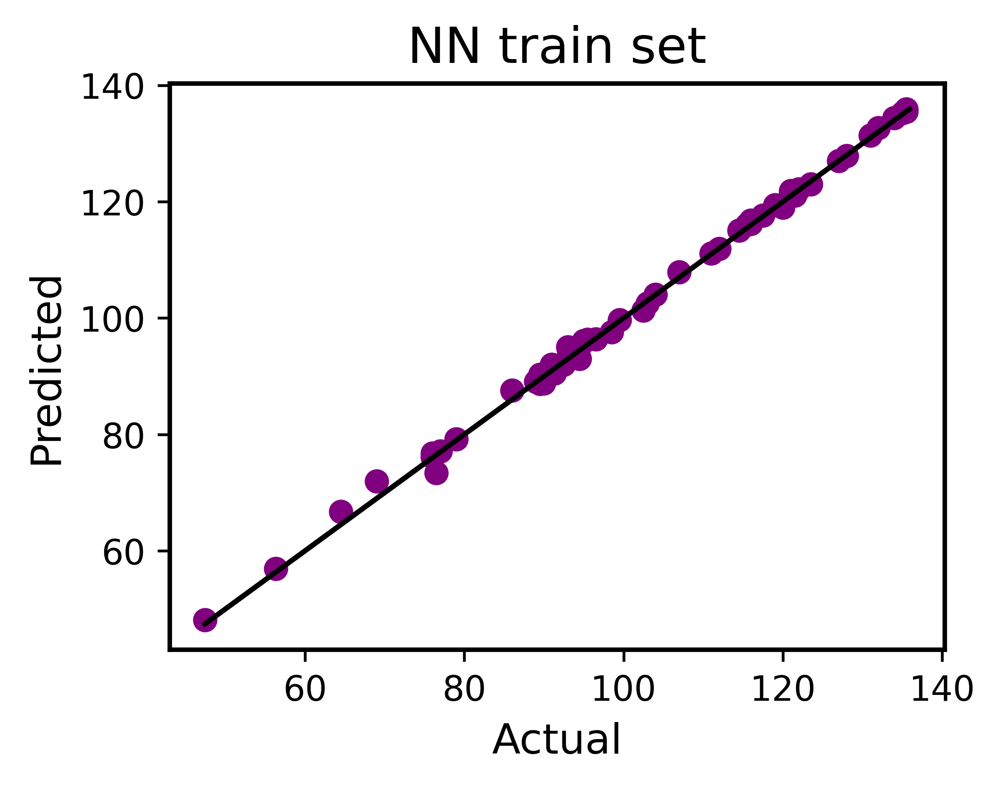

In [62]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'min angle'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')


LEN 85
trains [0.9651164534696631, -0.4334883018752438, 0.9967886642497177, 0.9900154993009591, 0.9964362230149453]
tests [0.7553183299840212, -0.995901406654683, 0.3949624420818162, 0.9580428569338004, 0.32943746454591527]
NN  Train R^2: 0.70297 ± 0.56835, Test R^2: 0.28837 ± 0.68248
NN  Train MAE: 3.75946 ± 5.08259, Test MAE: 7.36297 ± 5.56431


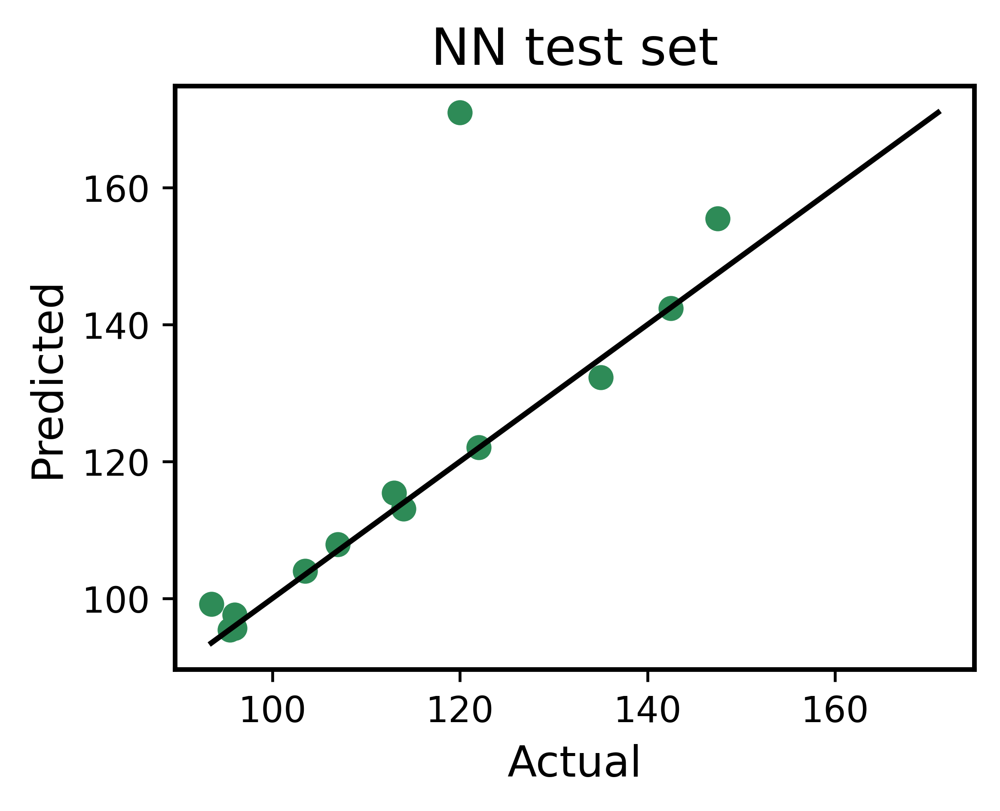

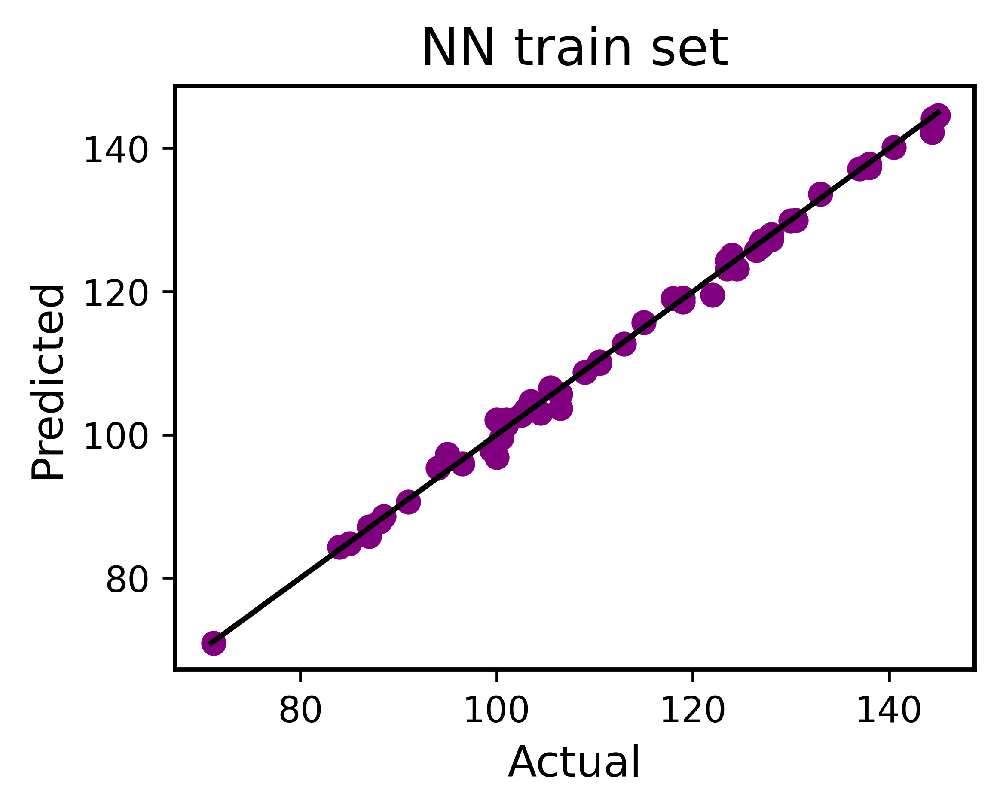

In [64]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'max angle'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')


## Ridge

In [112]:
%matplotlib inline 

def learn(data, depth, material = None, parameters = None, title = None, plot = False, paper_ID= None):
    
    '''
    
    
    Iterate over the models, performing training/cross-validation and plotting regression results

    
    Arguments:
    data: Matrix array of data, n samples x m features, numpy array
    depth: vector of depth values, n samples x 1 feature, numpy array
    
    (Optional, only displayed on figure)
    material: Material that is trained on (string)
    parameters: parameters contained in data (list of strings)
    title: Any additional information (e.g. process, paper ID) to be specified (string)
    plot: Whether to produce plots
    
    Returns:
    fit_models: List of fit models
    train_accuracy: List of CV Pearson R^2
    train_accuracy_std: List of standard deviation of Pearson R^2
    test_accuracy: List of test Pearson R^2
    test_accuracy_std: List of standard deviation of Pearson R^2
   
    
    
    '''
    
    labels = depth

    params = { #'font.family'      : 'serif',
               'font.size'        : 12,
               'xtick.labelsize'  : 'small',
               'ytick.labelsize'  : 'small',
               #'axes.labelsize'   : 'large',
               'axes.linewidth'   : 1.3 }
    plt.rcParams.update(params)


    y  = labels
    X = data
    
    # transpose if shape of label and data do not match
    if len(X) != len(labels):
        X = X.T
        print(len(labels), len(X))
        print('transposed to ' + str(X.shape[0]) + ', ' + str(X.shape[1]))
        

    idx_normalize = len(X[0])
    scaler = preprocessing.StandardScaler()
    X = scaler.fit_transform(X)           
        
    fit_models = []
    train_accuracy = []
    train_accuracy_std = []
    test_accuracy = []
    test_accuracy_std = []
    
    
    # Iterate over implemented models
    modeltoggle= 'Ridge'
    model = Ridge(alpha = 0.1)       
    # Perform cross validation for each model
    kf = KFold(n_splits=5)
    trains = []
    tests = []
    train_maes = []
    test_maes = []
    # Perform cross validation for each model
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    for train, test in kf.split(X_train):


        # Shuffle data points before prediction
        X_shuffle, y_shuffle = shuffle(X_train, y_train, random_state=42)

        X_cv_train = X_shuffle[train]
        X_cv_test = X_shuffle[test]
        y_cv_train = y_shuffle[train]
        y_cv_test = y_shuffle[test]


        model.fit(X_cv_train, y_cv_train)

        # Calculate MAE and R^2

        y_predtrain = model.predict(X_cv_train)
        y_predtest = model.predict(X_cv_test)
        trains.append(model.score(X_cv_train, y_cv_train))
        tests.append(model.score(X_cv_test, y_cv_test))



        mae_test = metrics.mean_absolute_error(y_cv_test, y_predtest)
        mae_train = metrics.mean_absolute_error(y_cv_train,y_predtrain)
        train_maes.append(mae_train)
        test_maes.append(mae_test)


    print('trains', trains)
    print('tests', tests)
    # Aggregate information
    trains = np.array(trains)
    tests = np.array(tests)
    train_maes = np.array(train_maes)
    test_maes = np.array(test_maes)
    r2_mean = tests.mean()
    r2_std = tests.std()
    r2_train_mean = trains.mean()
    r2_train_std =  trains.std()



    mae_mean_train = train_maes.mean()
    mae_mean_test = test_maes.mean()

    mae_mean_train_std = train_maes.std()
    mae_mean_test_std = test_maes.std()

    train_accuracy.append(r2_train_mean)
    test_accuracy_std.append(r2_std)
    test_accuracy.append(r2_mean)
    train_accuracy_std.append(r2_train_std)

    print(modeltoggle, ' Train R^2: {:.5f} ± {:.5f}, Test R^2: {:.5f} ± {:.5f}'.
            format( r2_train_mean, r2_train_std, r2_mean, r2_std))

    
    print(modeltoggle, ' Train MAE: {:.5f} ± {:.5f}, Test MAE: {:.5f} ± {:.5f}'.
            format( mae_mean_train,mae_mean_train_std, mae_mean_test, mae_mean_test_std))
        
        
        
#     #cv= RepeatedKFold(n_splits=5, n_repeats=5, random_state=1)
#     cv= KFold(n_splits=5, shuffle=True, random_state=10)

#     n_scores= cross_val_score(model, X, y, scoring='r2', cv=cv, n_jobs=-1)
#     print('accuracy: %.5f (%.5f)'% (mean(n_scores), std(n_scores)))
        
    # Plot results: everything scaled back to original values by multiplying by std and adding mean of training labels
    if modeltoggle == 'RF':
        fig = plt.figure(figsize = [4,3], dpi = 600)
        importance = model.feature_importances_
        indices = np.argsort(importance)
        plt.title('RF Feature Importance')
        plt.barh(range(len(indices)), importance[indices], color='c', align='center')
        plt.yticks(range(len(indices)), [parameter_list[i] for i in indices])
        plt.xlabel('relative importance')
        plt.show()
        #print(importance)
            #plt.barh(parameter_list, model.feature_importances_)

    if plot:
        fig = plt.figure(figsize = [4,3], dpi = 600)
        plt.scatter(y_cv_test, y_predtest, c='crimson')
        p1= max(max(y_predtest), max(y_cv_test))
        p2= min(min(y_predtest), min(y_cv_test))
        plt.plot([p1,p2], [p1,p2], 'k-')
        plt.title(modeltoggle+ ' test set')
        plt.xlabel("Actual")
        plt.ylabel("Predicted")
        
        fig = plt.figure(figsize = [4,3], dpi = 600)
        plt.scatter(y_cv_train, y_predtrain, c='crimson')
        p1= max(max(y_predtrain), max(y_cv_train))
        p2= min(min(y_predtrain), min(y_cv_train))
        plt.plot([p1,p2], [p1,p2], 'k-')
        plt.title(modeltoggle+ ' train set')
        plt.xlabel("Actual")
        plt.ylabel("Predicted")
        
    return fit_models, train_accuracy, train_accuracy_std, test_accuracy, test_accuracy_std 

LEN 88
trains [0.909164332266859, 0.9137474628121489, 0.9119310707962769, 0.9226505006512381, 0.9094694500061339]
tests [0.8379707950051614, 0.8891435601212457, 0.8938982150073701, 0.845964352006057, 0.9004615078690631]
Ridge  Train R^2: 0.91339 ± 0.00492, Test R^2: 0.87349 ± 0.02611
Ridge  Train MAE: 0.55158 ± 0.03059, Test MAE: 0.62972 ± 0.11187


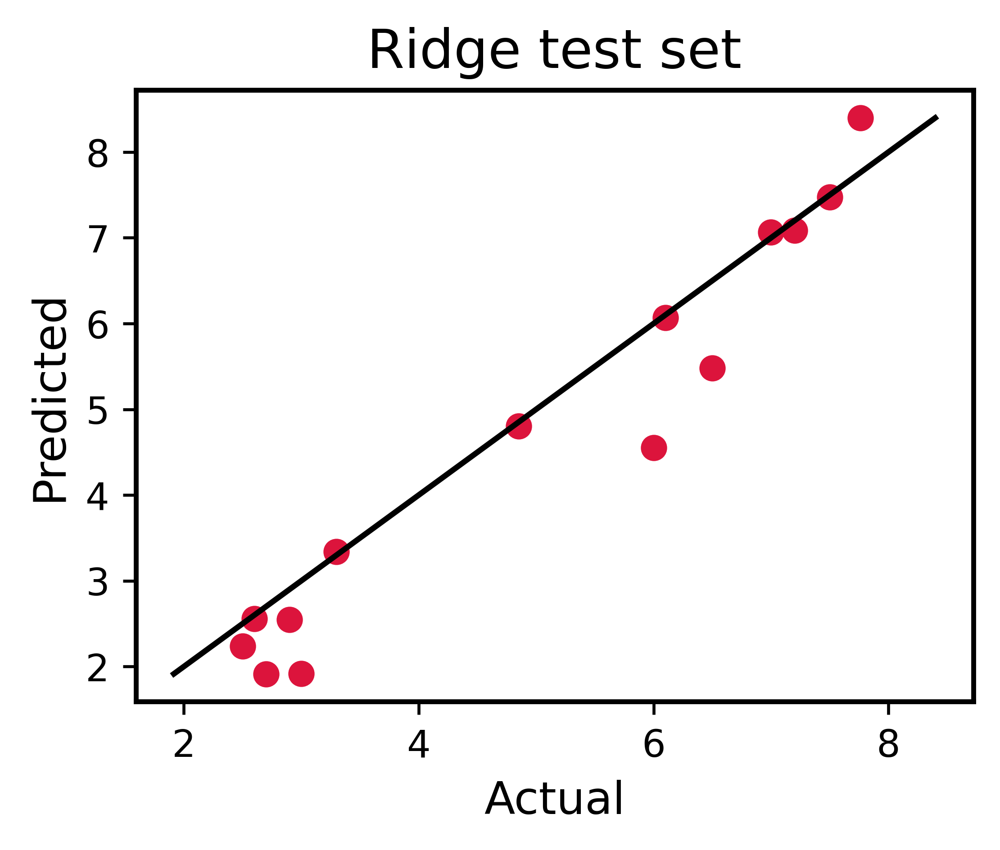

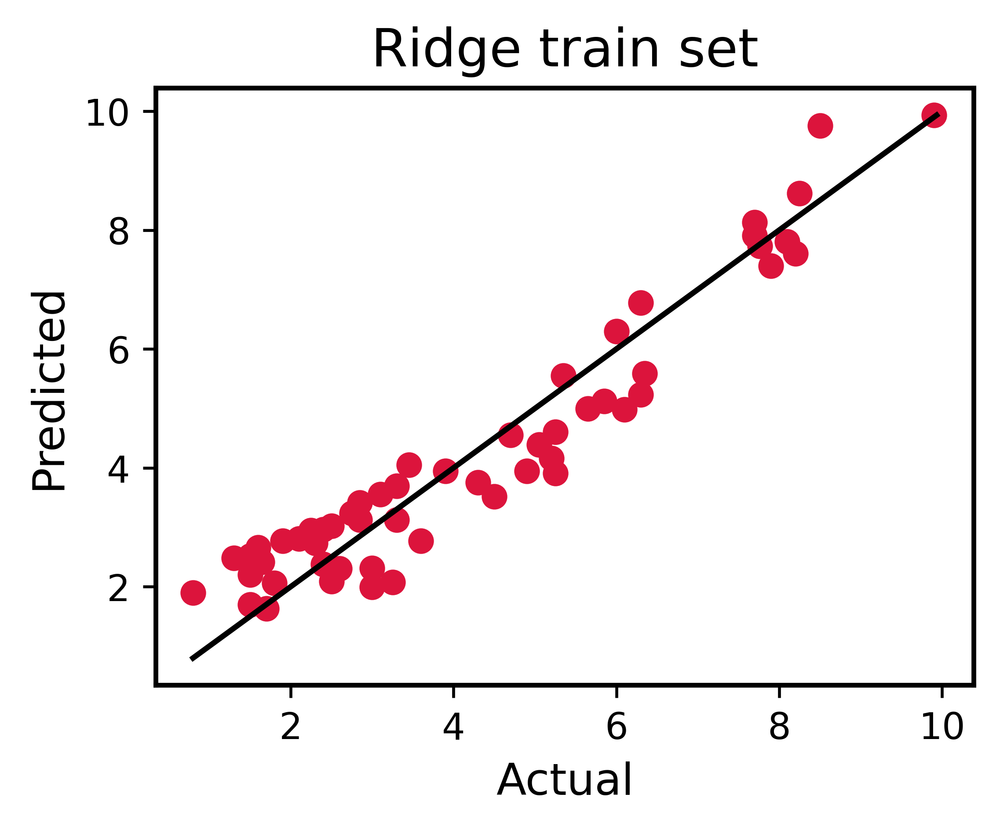

In [113]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'velocity mean'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



LEN 83
trains [0.8431224742302611, 0.8244035791476187, 0.8432285235776444, 0.799533855933319, 0.8650364057047419]
tests [0.7149508565084783, 0.8359494013323129, 0.6905163283809064, 0.9212703855543609, 0.6138791412389439]
Ridge  Train R^2: 0.83506 ± 0.02194, Test R^2: 0.75531 ± 0.10943
Ridge  Train MAE: 0.60678 ± 0.03486, Test MAE: 0.67346 ± 0.18650


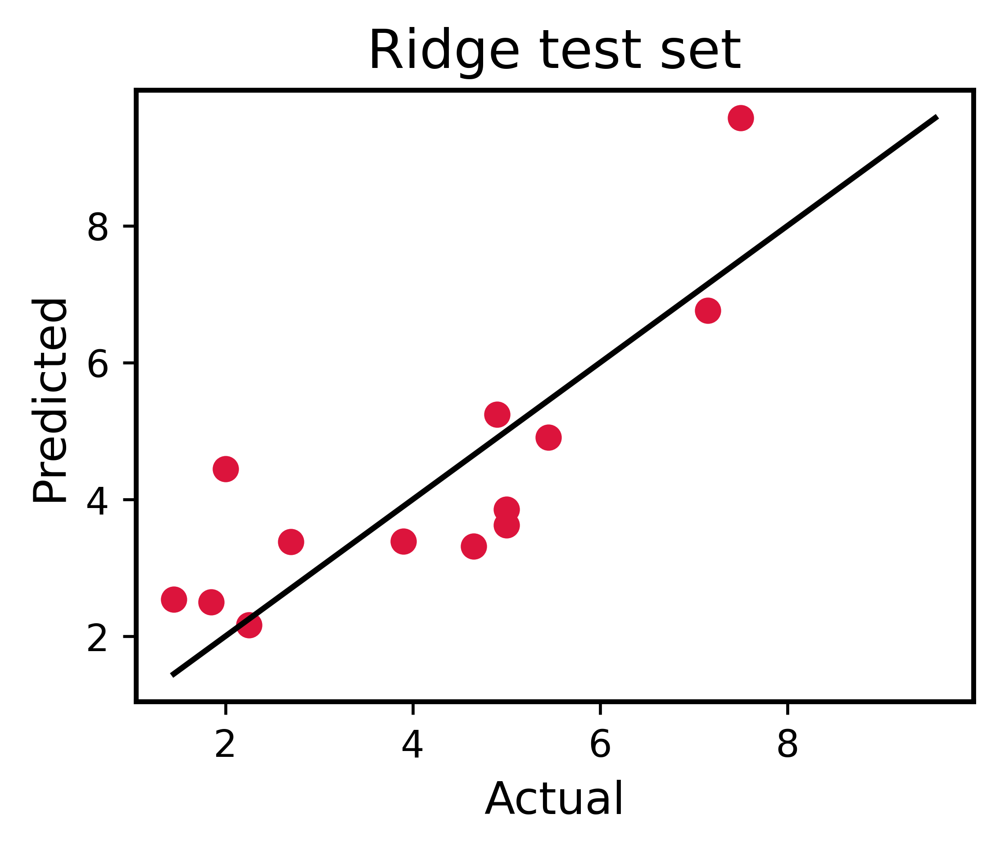

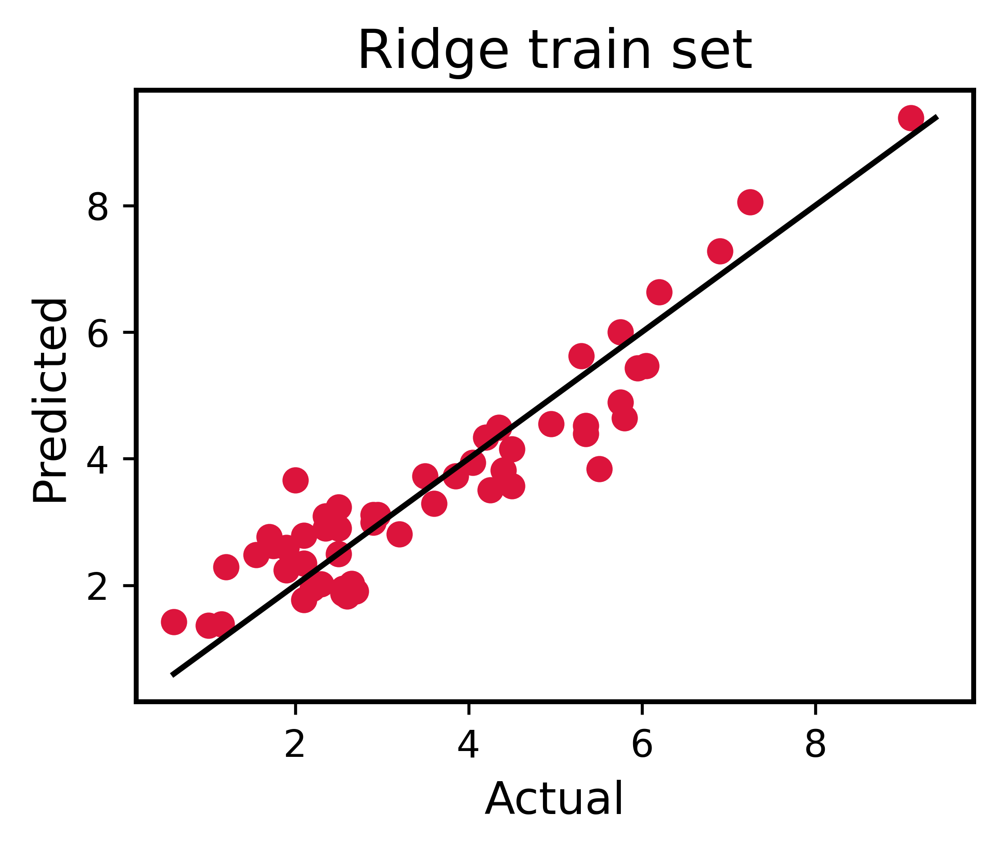

In [114]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'min velocity'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



LEN 83
trains [0.9174225014056402, 0.9041225563105534, 0.909484992768273, 0.8925090735380825, 0.8924485278837421]
tests [0.7977384561878884, 0.8444478473453726, 0.8496040042187276, 0.943163194609885, 0.9050841976910271]
Ridge  Train R^2: 0.90320 ± 0.00972, Test R^2: 0.86801 ± 0.05070
Ridge  Train MAE: 0.65708 ± 0.04737, Test MAE: 0.71941 ± 0.20130


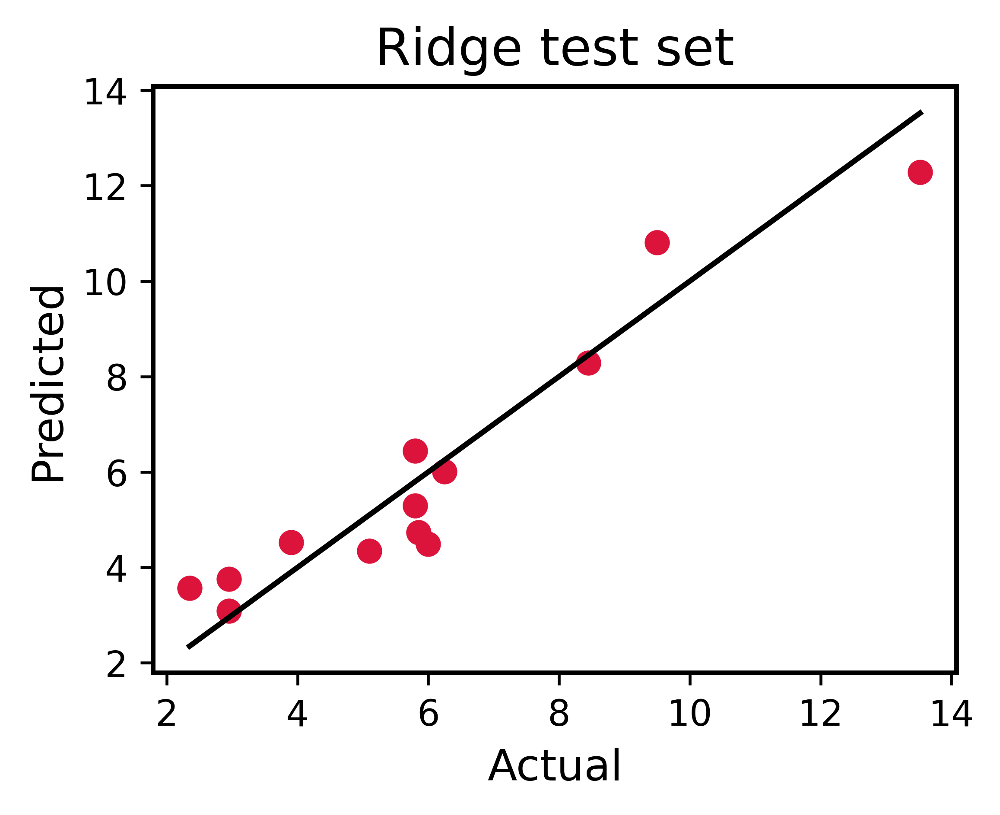

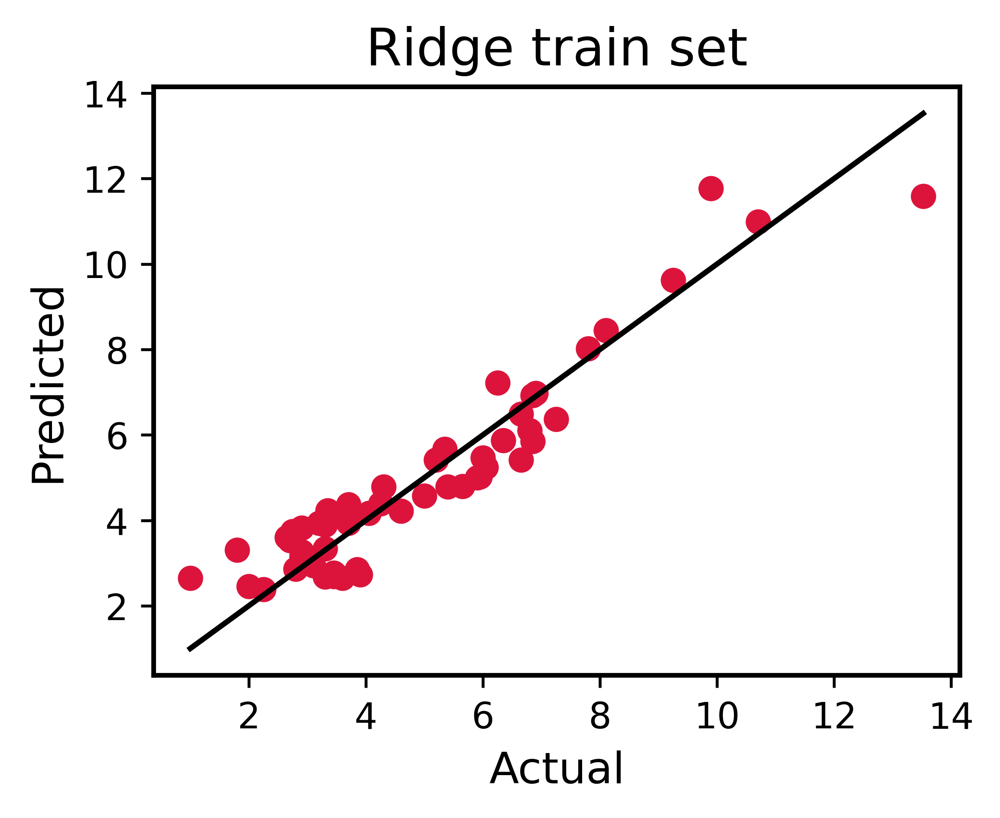

In [115]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'max velocity'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



LEN 141
trains [0.6138101471891405, 0.6770455679955076, 0.6391731548828841, 0.7548954603061974, 0.6701592888218117]
tests [0.8530323504417465, 0.6158730746714256, 0.7269111933555469, 0.15089378559149813, 0.45661667179930254]
Ridge  Train R^2: 0.67102 ± 0.04766, Test R^2: 0.56067 ± 0.24286
Ridge  Train MAE: 8.35431 ± 0.60995, Test MAE: 8.93099 ± 2.07606


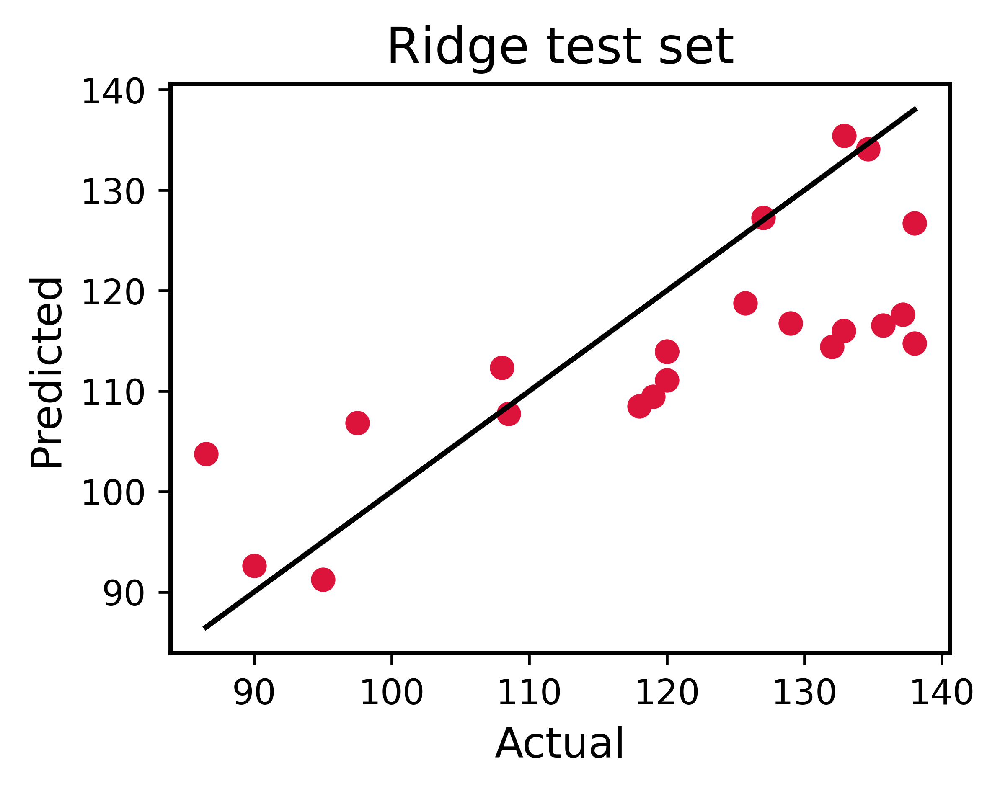

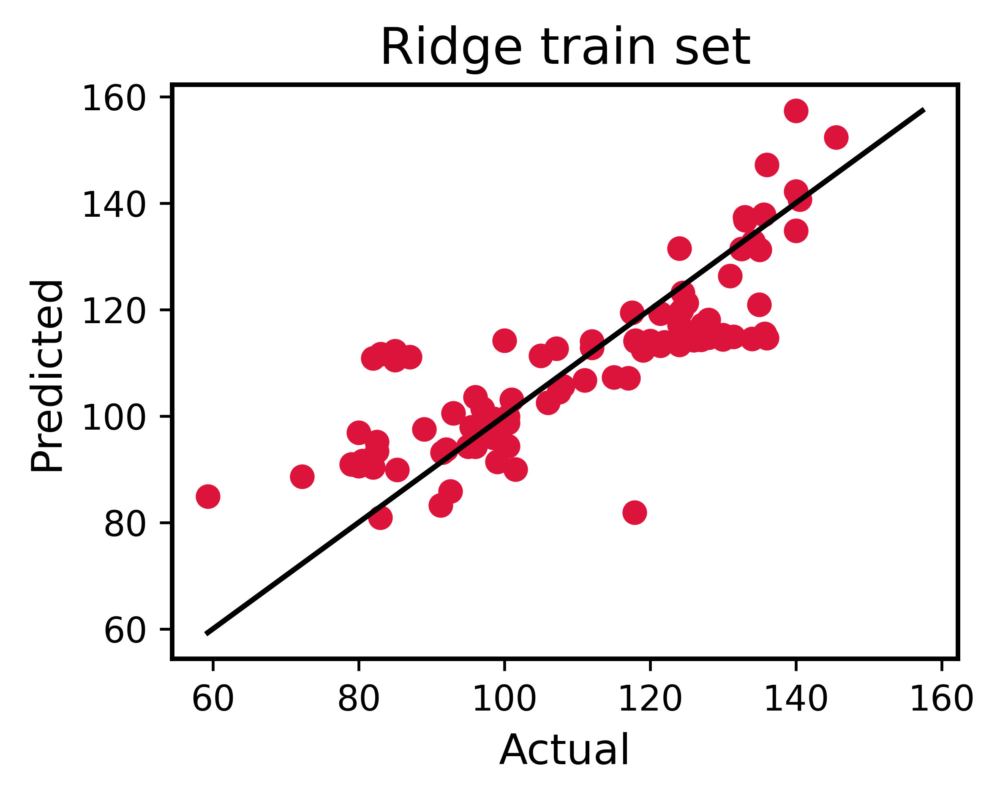

In [116]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'angle mean'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



LEN 129
trains [0.566478320750359, 0.562877039973372, 0.4968015744110127, 0.5313424873543086, 0.6260071663324753]
tests [0.37879582970499703, 0.4019045197920853, 0.6834994518193762, 0.47246094272558026, 0.10605060517799347]
Ridge  Train R^2: 0.55670 ± 0.04282, Test R^2: 0.40854 ± 0.18554
Ridge  Train MAE: 9.77891 ± 0.78104, Test MAE: 10.90978 ± 1.98938


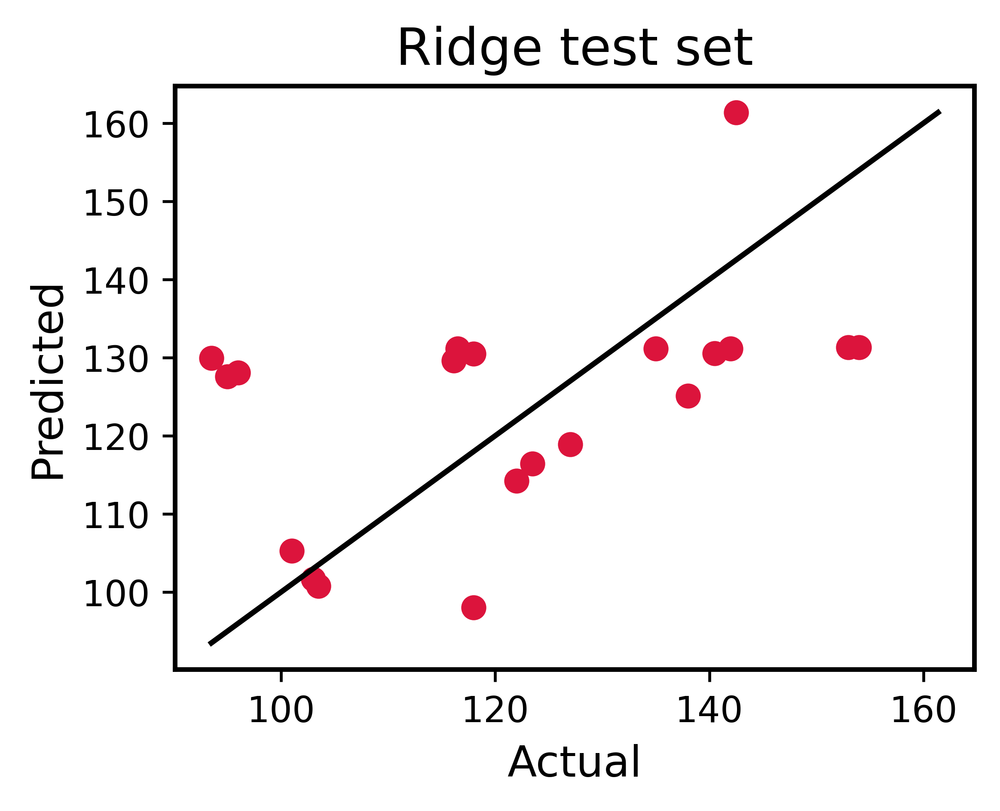

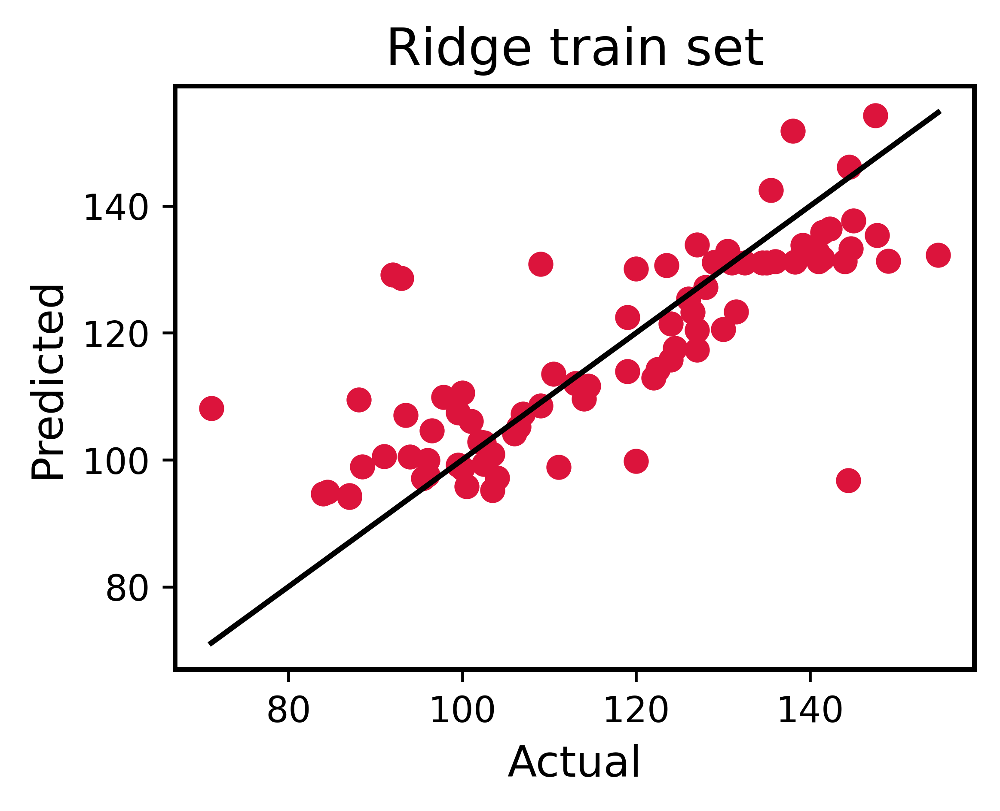

In [117]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'max angle'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



LEN 129
trains [0.6821965638084044, 0.7210405657641082, 0.6749970972272546, 0.6484879100426184, 0.7363014120128528]
tests [0.6635316617863556, 0.48784305933649286, 0.6838559899560804, 0.8379743584774441, 0.48720362020698826]
Ridge  Train R^2: 0.69260 ± 0.03188, Test R^2: 0.63208 ± 0.13256
Ridge  Train MAE: 8.82571 ± 0.49617, Test MAE: 9.47094 ± 1.82174


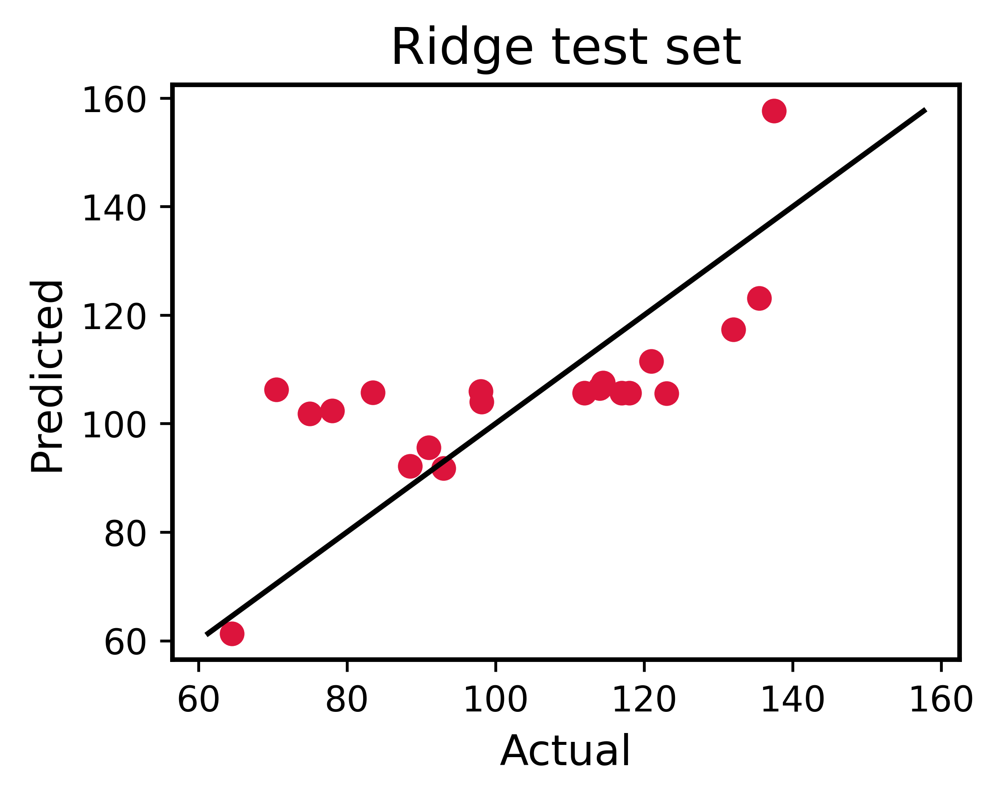

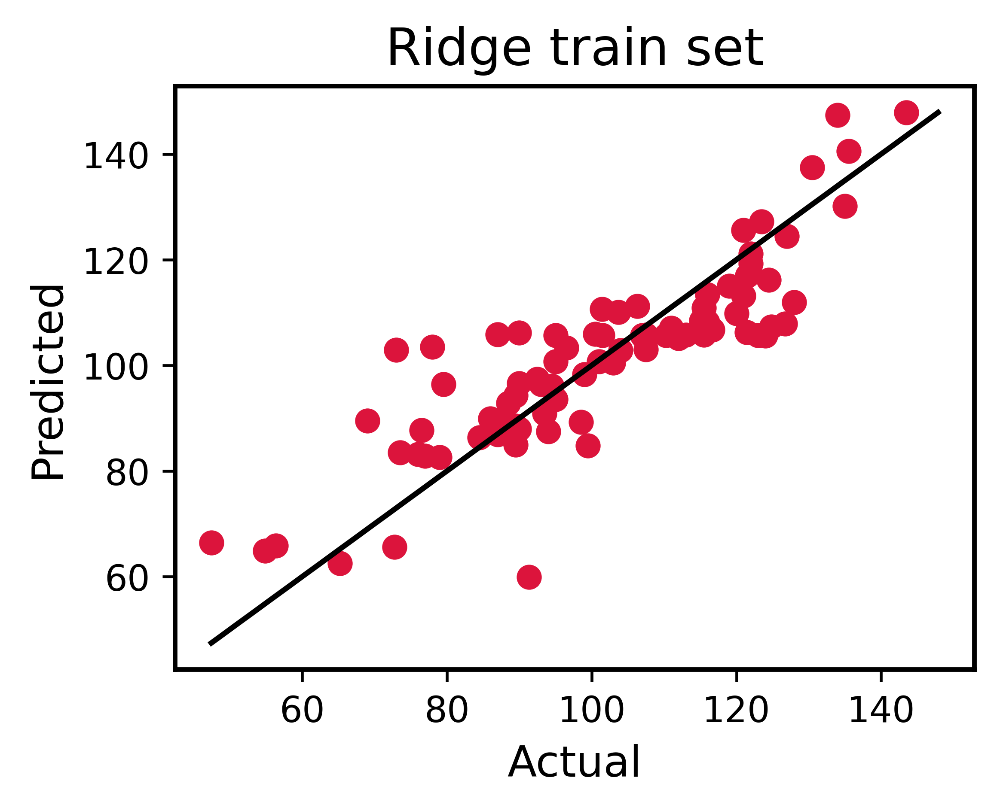

In [118]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'min angle'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



## Lasso

In [120]:
%matplotlib inline 

def learn(data, depth, material = None, parameters = None, title = None, plot = False, paper_ID= None):
    
    '''
    
    
    Iterate over the models, performing training/cross-validation and plotting regression results

    
    Arguments:
    data: Matrix array of data, n samples x m features, numpy array
    depth: vector of depth values, n samples x 1 feature, numpy array
    
    (Optional, only displayed on figure)
    material: Material that is trained on (string)
    parameters: parameters contained in data (list of strings)
    title: Any additional information (e.g. process, paper ID) to be specified (string)
    plot: Whether to produce plots
    
    Returns:
    fit_models: List of fit models
    train_accuracy: List of CV Pearson R^2
    train_accuracy_std: List of standard deviation of Pearson R^2
    test_accuracy: List of test Pearson R^2
    test_accuracy_std: List of standard deviation of Pearson R^2
   
    
    
    '''
    
    labels = depth

    params = { #'font.family'      : 'serif',
               'font.size'        : 12,
               'xtick.labelsize'  : 'small',
               'ytick.labelsize'  : 'small',
               #'axes.labelsize'   : 'large',
               'axes.linewidth'   : 1.3 }
    plt.rcParams.update(params)


    y  = labels
    X = data
    
    # transpose if shape of label and data do not match
    if len(X) != len(labels):
        X = X.T
        print(len(labels), len(X))
        print('transposed to ' + str(X.shape[0]) + ', ' + str(X.shape[1]))
        

    idx_normalize = len(X[0])
    scaler = preprocessing.StandardScaler()
    X = scaler.fit_transform(X)          
        
    fit_models = []
    train_accuracy = []
    train_accuracy_std = []
    test_accuracy = []
    test_accuracy_std = []
    
    
    # Iterate over implemented models
    modeltoggle= 'Lasso'
    model = Lasso(alpha = 0.1)       
    # Perform cross validation for each model
    kf = KFold(n_splits=5)
    trains = []
    tests = []
    train_maes = []
    test_maes = []
    # Perform cross validation for each model

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    for train, test in kf.split(X_train):


        # Shuffle data points before prediction
        X_shuffle, y_shuffle = shuffle(X_train, y_train, random_state=42)

        X_cv_train = X_shuffle[train]
        X_cv_test = X_shuffle[test]
        y_cv_train = y_shuffle[train]
        y_cv_test = y_shuffle[test]


        model.fit(X_cv_train, y_cv_train)

        # Calculate MAE and R^2

        y_predtrain = model.predict(X_cv_train)
        y_predtest = model.predict(X_cv_test)
        trains.append(model.score(X_cv_train, y_cv_train))
        tests.append(model.score(X_cv_test, y_cv_test))



        mae_test = metrics.mean_absolute_error(y_cv_test, y_predtest)
        mae_train = metrics.mean_absolute_error(y_cv_train,y_predtrain)
        train_maes.append(mae_train)
        test_maes.append(mae_test)


    print('trains', trains)
    print('tests', tests)
    # Aggregate information
    trains = np.array(trains)
    tests = np.array(tests)
    train_maes = np.array(train_maes)
    test_maes = np.array(test_maes)
    r2_mean = tests.mean()
    r2_std = tests.std()
    r2_train_mean = trains.mean()
    r2_train_std =  trains.std()



    mae_mean_train = train_maes.mean()
    mae_mean_test = test_maes.mean()

    mae_mean_train_std = train_maes.std()
    mae_mean_test_std = test_maes.std()

    train_accuracy.append(r2_train_mean)
    test_accuracy_std.append(r2_std)
    test_accuracy.append(r2_mean)
    train_accuracy_std.append(r2_train_std)

    print(modeltoggle, ' Train R^2: {:.5f} ± {:.5f}, Test R^2: {:.5f} ± {:.5f}'.
            format( r2_train_mean, r2_train_std, r2_mean, r2_std))

    
    print(modeltoggle, ' Train MAE: {:.5f} ± {:.5f}, Test MAE: {:.5f} ± {:.5f}'.
            format( mae_mean_train,mae_mean_train_std, mae_mean_test, mae_mean_test_std))
        
        
        
#     #cv= RepeatedKFold(n_splits=5, n_repeats=5, random_state=1)
#     cv= KFold(n_splits=5, shuffle=True, random_state=10)

#     n_scores= cross_val_score(model, X, y, scoring='r2', cv=cv, n_jobs=-1)
#     print('accuracy: %.5f (%.5f)'% (mean(n_scores), std(n_scores)))
        
    # Plot results: everything scaled back to original values by multiplying by std and adding mean of training labels
    if modeltoggle == 'RF':
        fig = plt.figure(figsize = [4,3], dpi = 600)
        importance = model.feature_importances_
        indices = np.argsort(importance)
        plt.title('RF Feature Importance')
        plt.barh(range(len(indices)), importance[indices], color='c', align='center')
        plt.yticks(range(len(indices)), [parameter_list[i] for i in indices])
        plt.xlabel('relative importance')
        plt.show()
        #print(importance)
            #plt.barh(parameter_list, model.feature_importances_)

    if plot:
        fig = plt.figure(figsize = [4,3], dpi = 600)
        plt.scatter(y_cv_test, y_predtest, c='crimson')
        p1= max(max(y_predtest), max(y_cv_test))
        p2= min(min(y_predtest), min(y_cv_test))
        plt.plot([p1,p2], [p1,p2], 'k-')
        plt.title(modeltoggle+ ' test set')
        plt.xlabel("Actual")
        plt.ylabel("Predicted")
        
        fig = plt.figure(figsize = [4,3], dpi = 600)
        plt.scatter(y_cv_train, y_predtrain, c='crimson')
        p1= max(max(y_predtrain), max(y_cv_train))
        p2= min(min(y_predtrain), min(y_cv_train))
        plt.plot([p1,p2], [p1,p2], 'k-')
        plt.title(modeltoggle+ ' train set')
        plt.xlabel("Actual")
        plt.ylabel("Predicted")
        

    return fit_models, train_accuracy, train_accuracy_std, test_accuracy, test_accuracy_std 

LEN 88
trains [0.7773766022147781, 0.7407564052937883, 0.7908549362040938, 0.8016514116404538, 0.777849747824257]
tests [0.40992382162642593, 0.9013974948674393, 0.2906239965574382, 0.8563378778767894, 0.7871099068997779]
Lasso  Train R^2: 0.77770 ± 0.02055, Test R^2: 0.64908 ± 0.24954
Lasso  Train MAE: 0.80074 ± 0.04534, Test MAE: 0.91134 ± 0.30678


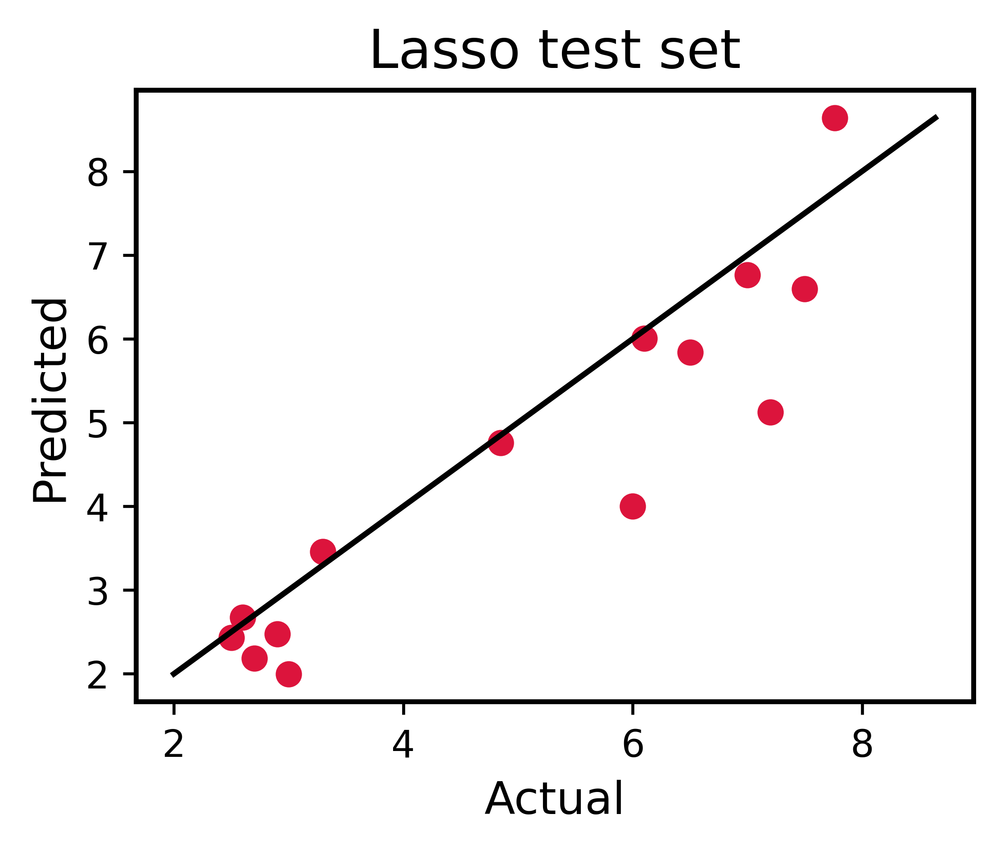

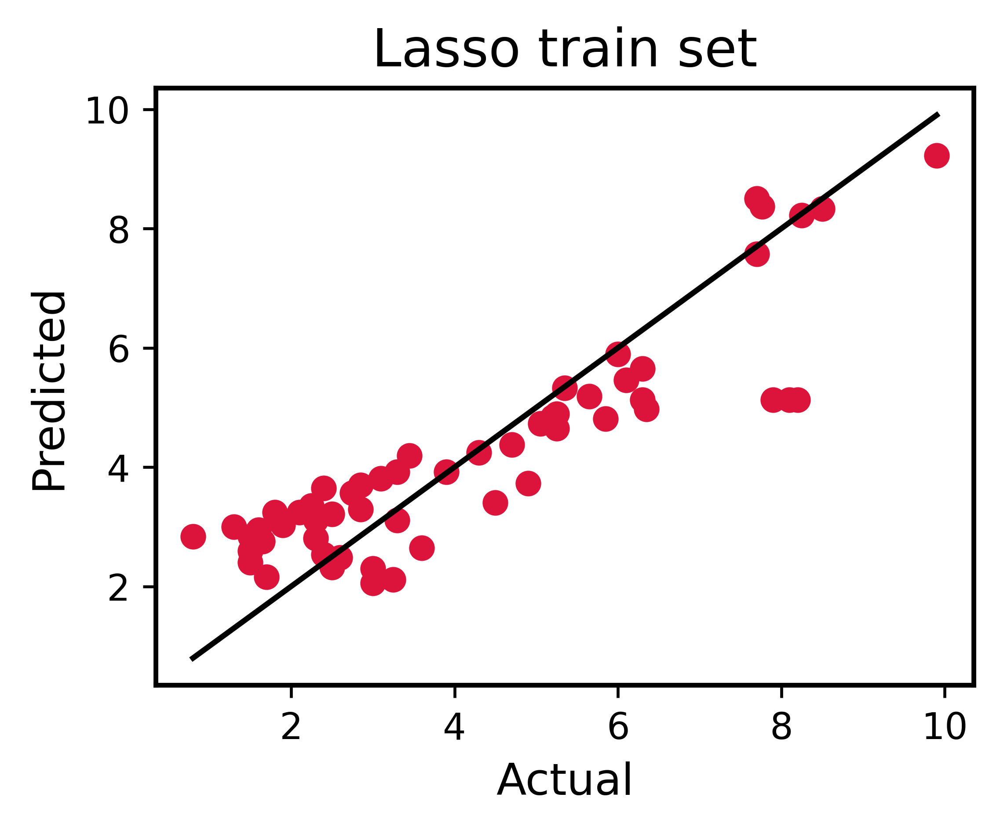

In [121]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'velocity mean'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



LEN 83
trains [0.8208935408463144, 0.8050572361882316, 0.8227177255046166, 0.7759183539835253, 0.8329427891207419]
tests [0.6740414073458253, 0.8037820166268126, 0.7387342830788646, 0.8735180030105859, 0.7454315932337447]
Lasso  Train R^2: 0.81151 ± 0.01991, Test R^2: 0.76710 ± 0.06724
Lasso  Train MAE: 0.63120 ± 0.03737, Test MAE: 0.68309 ± 0.14282


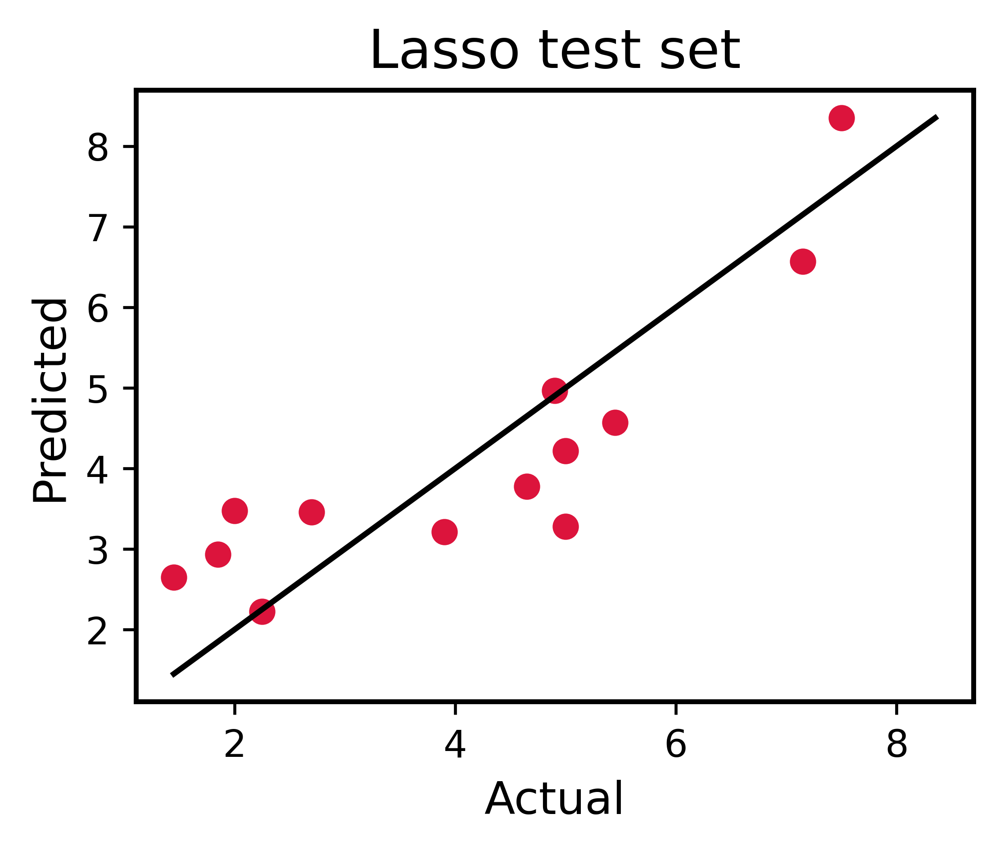

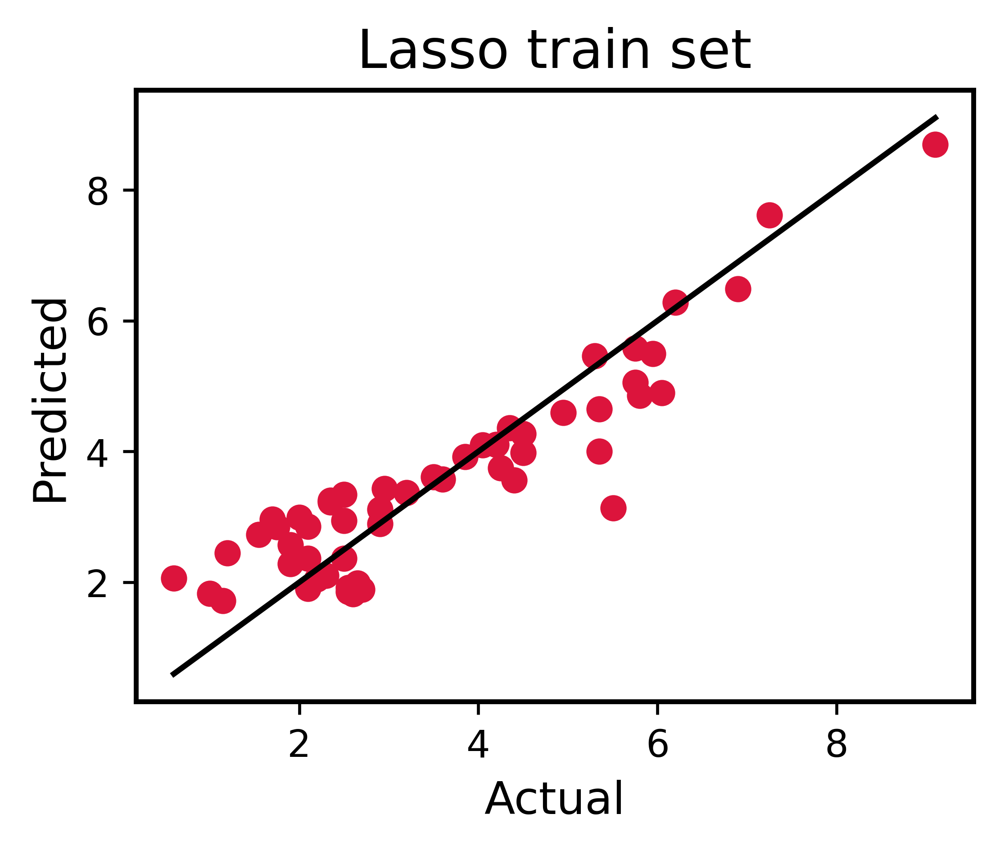

In [122]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'min velocity'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



LEN 83
trains [0.9030961714523358, 0.8944549176201522, 0.8969707167917829, 0.8814252067779479, 0.8741344339413026]
tests [0.7972555583258962, 0.8392616989305828, 0.8274884279625001, 0.9258416598372838, 0.8752543493519636]
Lasso  Train R^2: 0.89002 ± 0.01063, Test R^2: 0.85302 ± 0.04415
Lasso  Train MAE: 0.67905 ± 0.04169, Test MAE: 0.75197 ± 0.19939


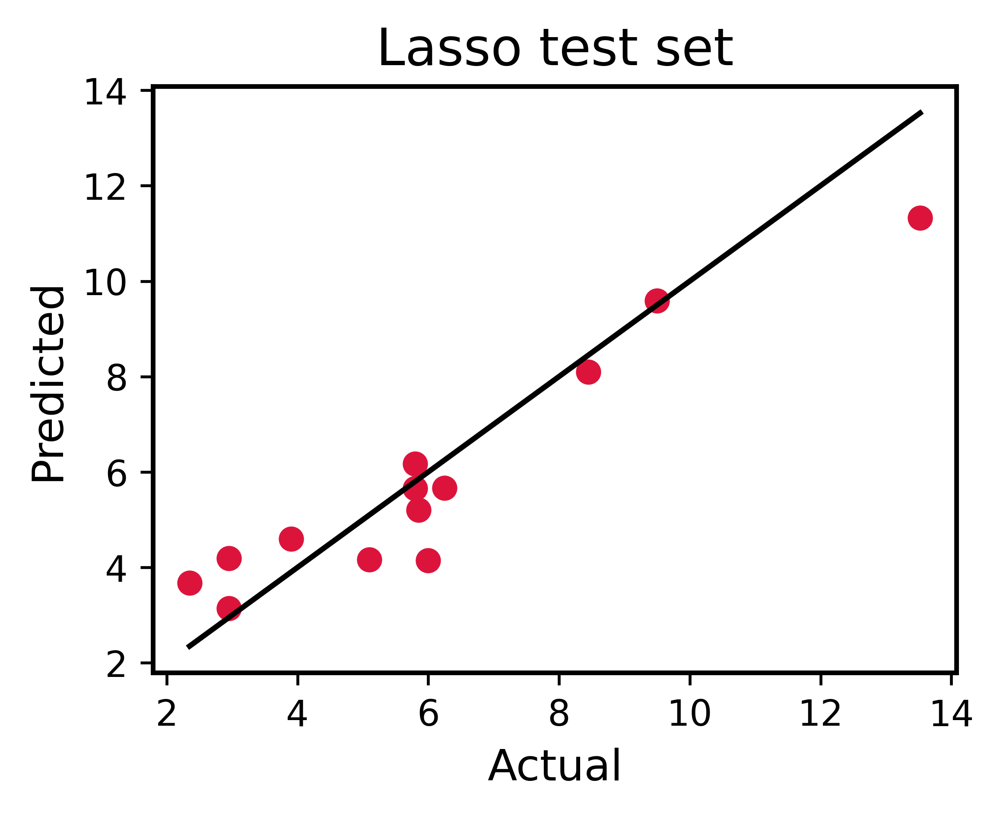

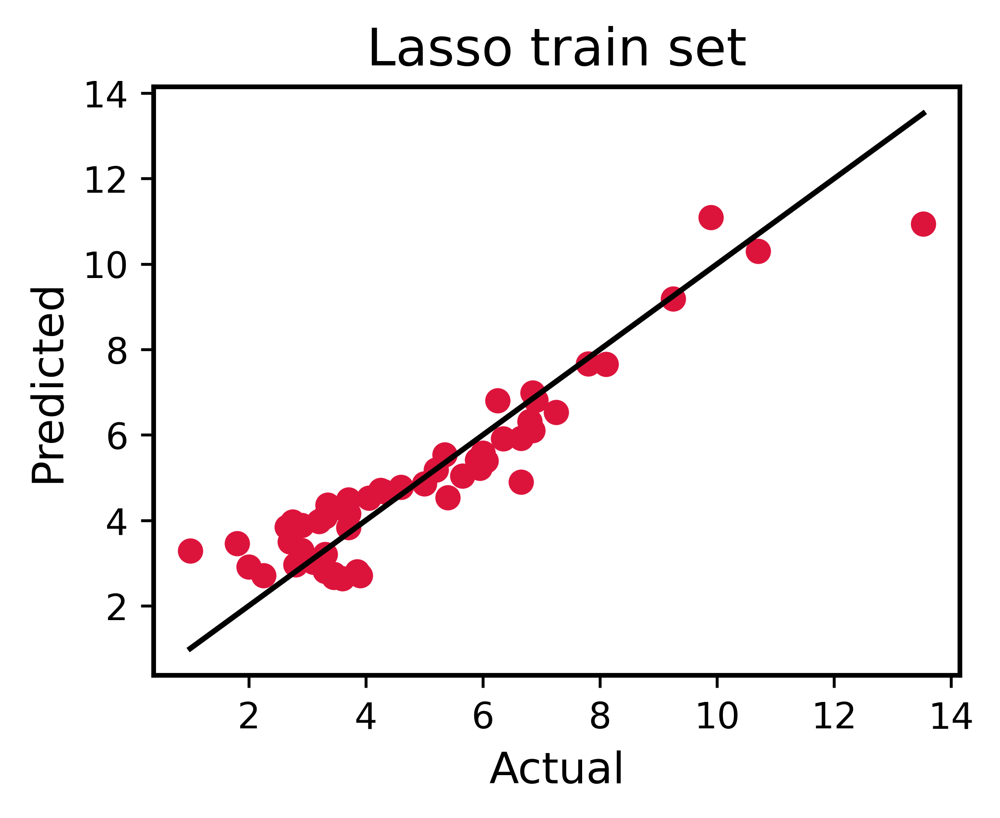

In [123]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'max velocity'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



LEN 141
trains [0.6132918298198096, 0.6765195747584243, 0.6386482424062042, 0.7544349909578277, 0.6697223028876099]
tests [0.8492533198669638, 0.6203041249332673, 0.7173066802696976, 0.16760030246130275, 0.4409251173866815]
Lasso  Train R^2: 0.67052 ± 0.04768, Test R^2: 0.55908 ± 0.23673
Lasso  Train MAE: 8.33488 ± 0.61037, Test MAE: 8.92008 ± 2.01816


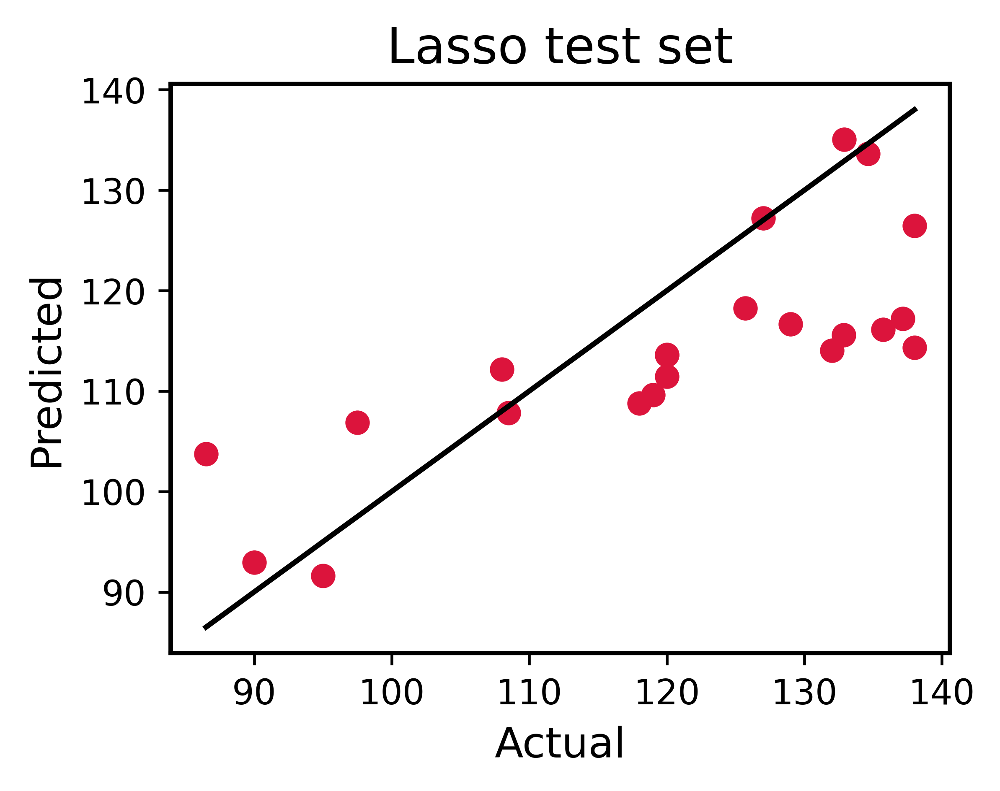

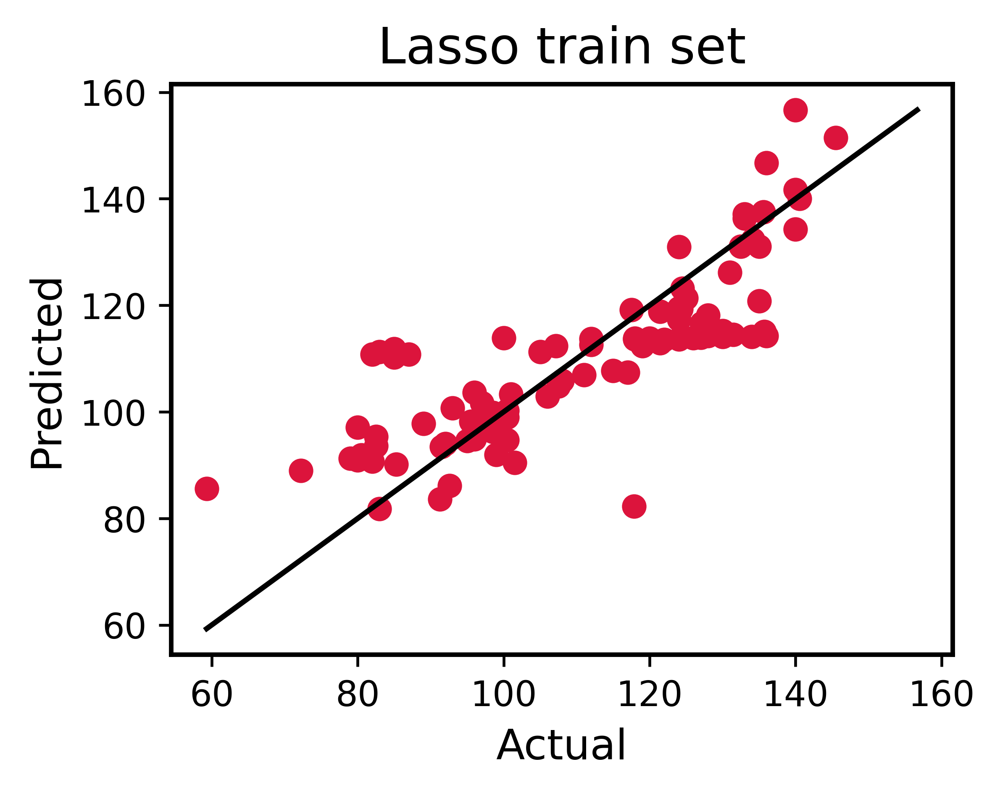

In [124]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'angle mean'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



LEN 129
trains [0.6819179992597384, 0.7207812497561971, 0.6747077545827025, 0.6482118331360283, 0.7359664736975815]
tests [0.6647254529400715, 0.4942615215135592, 0.675402269368022, 0.8353513499777769, 0.4968229042534976]
Lasso  Train R^2: 0.69232 ± 0.03187, Test R^2: 0.63331 ± 0.12770
Lasso  Train MAE: 8.84061 ± 0.48543, Test MAE: 9.45435 ± 1.77390


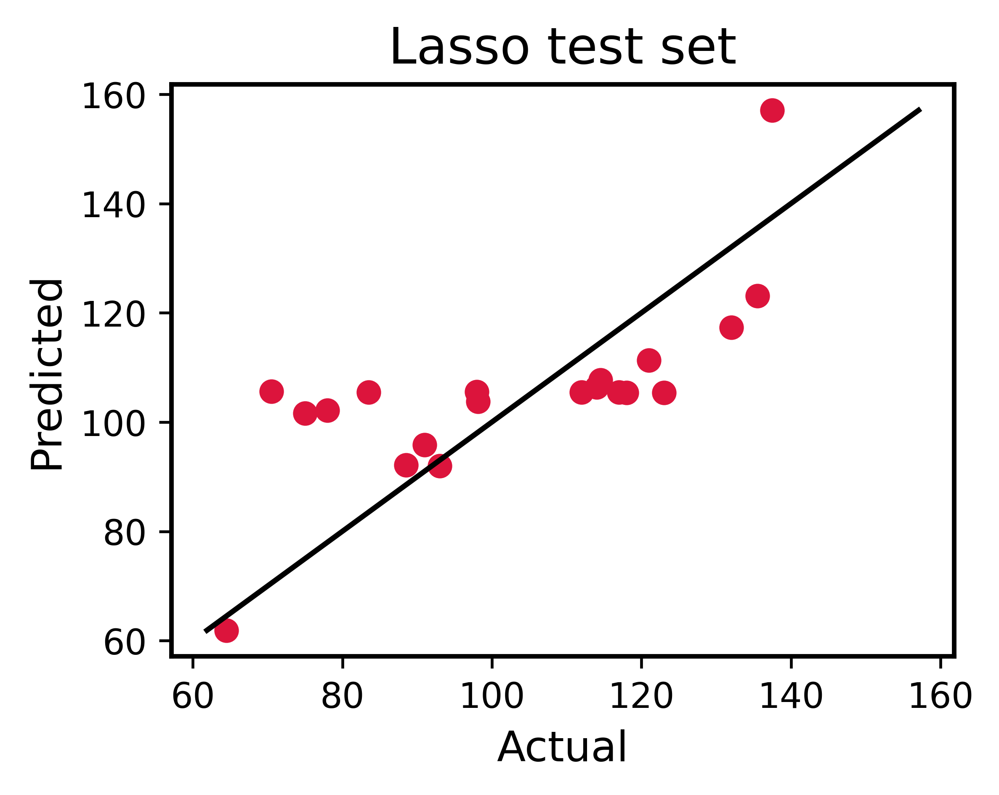

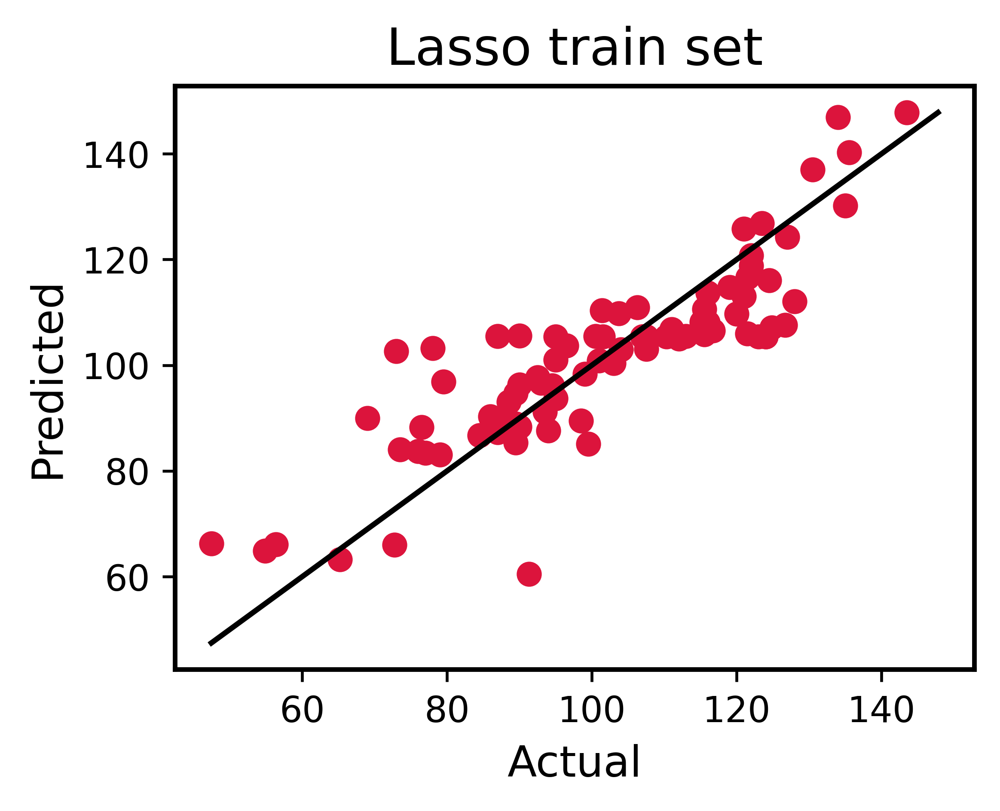

In [125]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'min angle'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



LEN 129
trains [0.5661854060234308, 0.5625813561637032, 0.496496458114544, 0.531029307212707, 0.6257153093076021]
tests [0.3835893135669709, 0.40689865968317673, 0.6788777870309242, 0.4615502397740192, 0.11161369744775562]
Lasso  Train R^2: 0.55640 ± 0.04283, Test R^2: 0.40851 ± 0.18148
Lasso  Train MAE: 9.77604 ± 0.78212, Test MAE: 10.91680 ± 1.95622


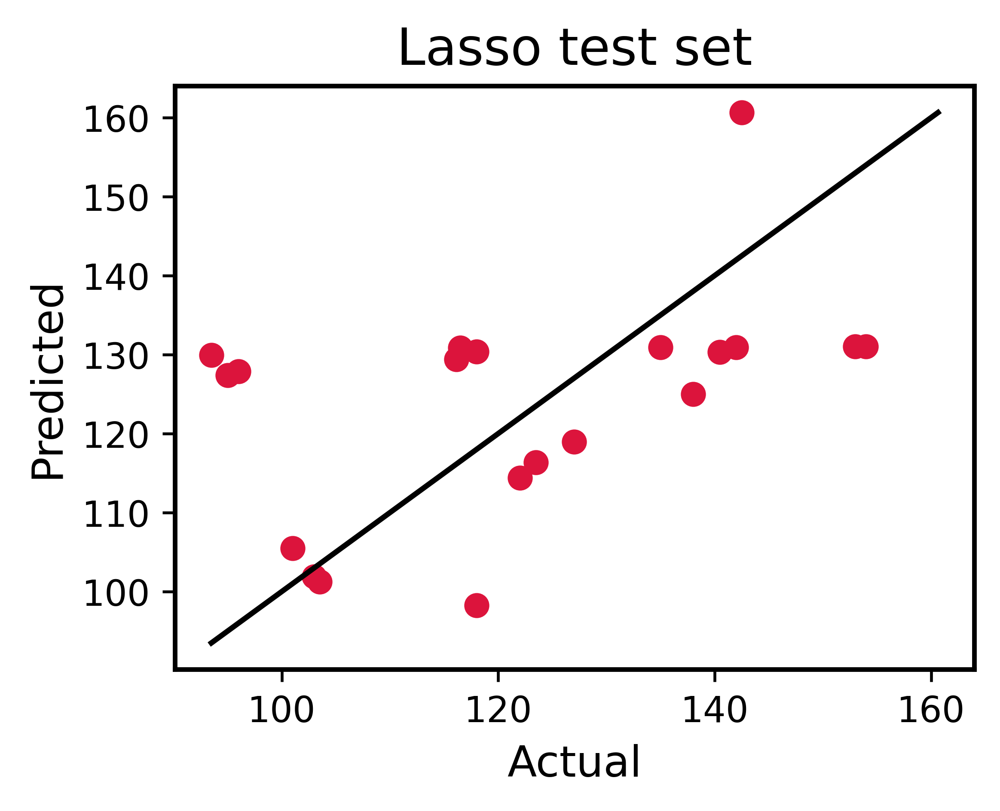

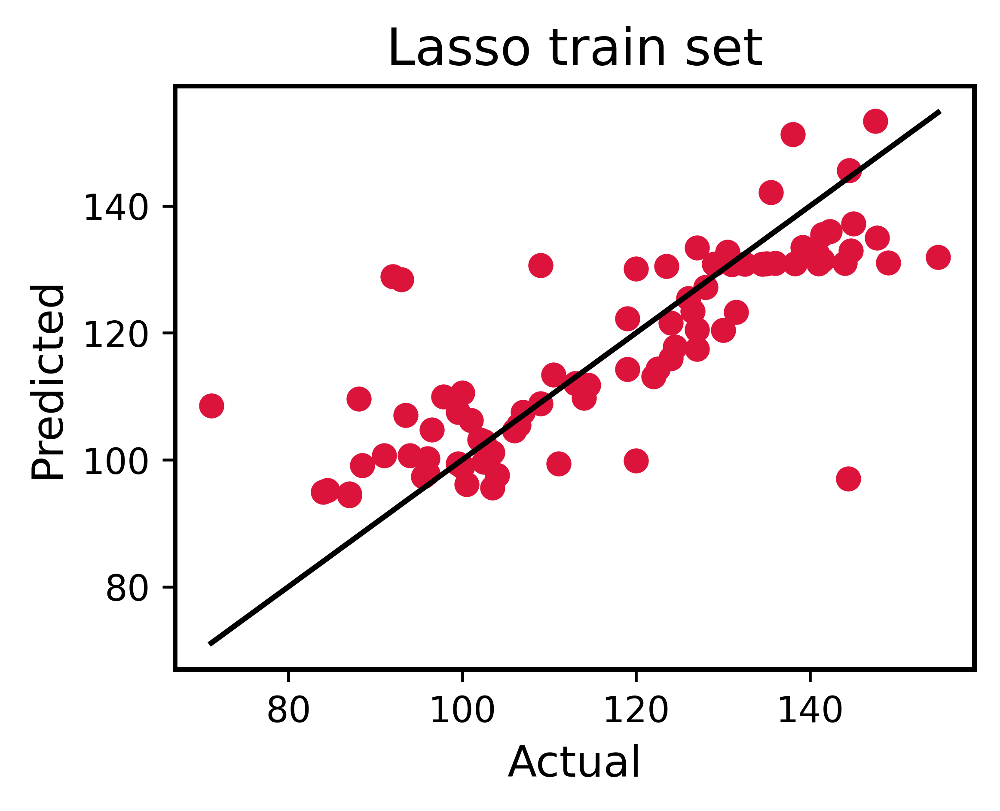

In [126]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted


parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'max angle'


data_list = []
label_list = []

for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()

fit_models, train_accuracy_ohe, train_accuracy_std_ohe, test_accuracy_ohe, test_accuracy_std_ohe  = learn(X.reshape(-1, len(parameter_list)), y, parameters = parameter_list, plot = True, title = 'LPBF, OHE')



## hyper parameter optimization

In [86]:
!pip install hyperopt

     |████████████████████████████████| 1.6 MB 4.3 MB/s eta 0:00:01
     |████████████████████████████████| 198 kB 10.2 MB/s eta 0:00:01


## RF - GB

In [207]:
%matplotlib inline 

from sklearn.inspection import permutation_importance
from sklearn.base import clone



def learn_optimize(data, YS,  modeltoggle = 'RF' , prefix = None,  n_estimators=None , material = None, parameters = None, title = None, plot = False):
    
    '''
    
    Iterate over the models, performing training/cross-validation and plotting regression results

    
    Arguments:
    data: Matrix array of data, n samples x m features, numpy array
    depth: vector of depth values, n samples x 1 feature, numpy array
    
    (Optional, only displayed on figure)
    material: Material that is trained on (string)
    parameters: parameters contained in data (list of strings)
    title: Any additional information (e.g. process, paper ID) to be specified (string)
    plot: Whether to produce plots
    
    Returns:
    fit_models: List of fit models
    train_accuracy: List of CV Pearson R^2
    train_accuracy_std: List of standard deviation of Pearson R^2
    test_accuracy: List of test Pearson R^2
    test_accuracy_std: List of standard deviation of Pearson R^2
   
    
    
    '''
    labels = YS

    params = { #'font.family'      : 'serif',
               'font.size'        : 12,
               'xtick.labelsize'  : 'small',
               'ytick.labelsize'  : 'small',
               #'axes.labelsize'   : 'large',
               'axes.linewidth'   : 1.3 }
    plt.rcParams.update(params)


    y  = labels
    X = data
    
    # transpose if shape of label and data do not match
    if len(X) != len(labels):
        X = X.T
        print(len(labels), len(X))
        print('transposed to ' + str(X.shape[0]) + ', ' + str(X.shape[1]))
        

    
    scaler = preprocessing.StandardScaler()
    X = scaler.fit_transform(X)
        
    fit_models = []
    train_accuracy = []
    train_accuracy_std = []
    test_accuracy = []
    test_accuracy_std = []
    
    X_train, X_test, y_train, y_test = ms.train_test_split(X, y, test_size = 0.2, random_state = 42)

    # Iterate over implemented models
    for modeltoggle in ['RF', 'GPR', 'SVR', 'Ridge', 'Lasso', 'GB', 'NN']:
        if modeltoggle == 'RF':
            #model = RandomForestRegressor(n_estimators = 500, max_depth = 3)
            model = RandomForestRegressor(n_estimators = n_estimators)
       
        elif modeltoggle == 'GB':
            #model = GradientBoostingRegressor(n_estimators = 500, max_depth = 1)
            model = GradientBoostingRegressor(n_estimators =n_estimators)
        
    model.fit(X_train, y_train)
        
        



    r2_train = model.score(X_train, y_train)

    r2_test = model.score(X_test, y_test)
    return  r2_test 






    
        

In [115]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted



from hyperopt import hp, tpe, STATUS_OK, Trials
from hyperopt.fmin import fmin

from hyperopt.pyll import scope



train_accuracies = []
train_accuracies_std = []
test_accuracies = []
test_accuracies_std = []

parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'velocity mean'



#new_csv = select_subset(new_csv, 'paper ID', 19)
#new_csv = select_material(new_csv, 'Ti6Al4V')

# Form dataset array from dataframe, given parameter_list, label_col
# function select_parameters() does this as well
data_list = []
label_list = []



for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()






#RF
def objective(space):
 #   print("HERE")
    r2_test = learn_optimize(X.reshape(-1, len(X[0])), y,modeltoggle = 'RF', parameters = parameter_list,  n_estimators = space['n_estimators']) 
    return {'loss':-r2_test, 'status': STATUS_OK }

space = {

    'n_estimators': scope.int(hp.quniform('n_estimators', 1, 500, q=1))
}


trials = Trials()
print(trials.results, "trials")
best = fmin(fn = objective, space=space, algo = tpe.suggest, max_evals = 1000, trials = trials)
print(best, "best For RF ")



# GB 
def objective(space):
 #   print("HERE")
    r2_test = learn_optimize(X.reshape(-1, len(X[0])), y, modeltoggle = 'GB', parameters = parameter_list,   n_estimators= space['n_estimators'])
    return {'loss':-r2_test, 'status': STATUS_OK }

space = {

    'n_estimators': scope.int(hp.quniform('n_estimators', 1, 500, q=1))
}

trials = Trials()
print(trials.results, "trials")
best = fmin(fn = objective, space=space, algo = tpe.suggest, max_evals = 1000, trials = trials)
print(best, "best for GB")


LEN 89
[] trials
100%|██████████| 1000/1000 [01:10<00:00, 14.16trial/s, best loss: 0.04053685756739589]
{'n_estimators': 420.0} best For RF 
[] trials
100%|██████████| 1000/1000 [01:11<00:00, 13.96trial/s, best loss: 0.04048305421479936]
{'n_estimators': 463.0} best for GB


In [208]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted



from hyperopt import hp, tpe, STATUS_OK, Trials
from hyperopt.fmin import fmin

from hyperopt.pyll import scope



train_accuracies = []
train_accuracies_std = []
test_accuracies = []
test_accuracies_std = []

parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'angle mean'



#new_csv = select_subset(new_csv, 'paper ID', 19)
#new_csv = select_material(new_csv, 'Ti6Al4V')

# Form dataset array from dataframe, given parameter_list, label_col
# function select_parameters() does this as well
data_list = []
label_list = []



for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()






#RF
def objective(space):
 #   print("HERE")
    r2_test = learn_optimize(X.reshape(-1, len(X[0])), y,modeltoggle = 'RF', parameters = parameter_list,  n_estimators = space['n_estimators']) 
    return {'loss':-r2_test, 'status': STATUS_OK }

space = {

    'n_estimators': scope.int(hp.quniform('n_estimators', 1, 500, q=1))
}


trials = Trials()
print(trials.results, "trials")
best = fmin(fn = objective, space=space, algo = tpe.suggest, max_evals = 1000, trials = trials)
print(best, "best For RF ")



# GB 
def objective(space):
 #   print("HERE")
    r2_test = learn_optimize(X.reshape(-1, len(X[0])), y, modeltoggle = 'GB', parameters = parameter_list,   n_estimators= space['n_estimators'])
    return {'loss':-r2_test, 'status': STATUS_OK }

space = {

    'n_estimators': scope.int(hp.quniform('n_estimators', 1, 500, q=1))
}

trials = Trials()
print(trials.results, "trials")
best = fmin(fn = objective, space=space, algo = tpe.suggest, max_evals = 1000, trials = trials)
print(best, "best for GB")


LEN 147
[] trials
100%|██████████| 1000/1000 [00:30<00:00, 32.59trial/s, best loss: -0.918315167000973]
{'n_estimators': 56.0} best For RF 
[] trials
100%|██████████| 1000/1000 [00:30<00:00, 32.38trial/s, best loss: -0.918315167000973]
{'n_estimators': 56.0} best for GB


## SVR

In [223]:
%matplotlib inline 

from sklearn.inspection import permutation_importance
from sklearn.base import clone



def learn_optimize(data, YS,var1 = None,  modeltoggle = 'SVR' , prefix = None,  variable = None,var =None, parameters = None, title = None, plot = False):
    
    '''
    
    Iterate over the models, performing training/cross-validation and plotting regression results

    
    Arguments:
    data: Matrix array of data, n samples x m features, numpy array
    depth: vector of depth values, n samples x 1 feature, numpy array
    
    (Optional, only displayed on figure)
    material: Material that is trained on (string)
    parameters: parameters contained in data (list of strings)
    title: Any additional information (e.g. process, paper ID) to be specified (string)
    plot: Whether to produce plots
    
    Returns:
    fit_models: List of fit models
    train_accuracy: List of CV Pearson R^2
    train_accuracy_std: List of standard deviation of Pearson R^2
    test_accuracy: List of test Pearson R^2
    test_accuracy_std: List of standard deviation of Pearson R^2
   
    
    
    '''
    labels = YS

    params = { #'font.family'      : 'serif',
               'font.size'        : 12,
               'xtick.labelsize'  : 'small',
               'ytick.labelsize'  : 'small',
               #'axes.labelsize'   : 'large',
               'axes.linewidth'   : 1.3 }
    plt.rcParams.update(params)


    y  = labels
    X = data
    
    # transpose if shape of label and data do not match
    if len(X) != len(labels):
        X = X.T
        print(len(labels), len(X))
        print('transposed to ' + str(X.shape[0]) + ', ' + str(X.shape[1]))
        

    
    scaler = preprocessing.StandardScaler()
    X = scaler.fit_transform(X)
        
    fit_models = []
    train_accuracy = []
    train_accuracy_std = []
    test_accuracy = []
    test_accuracy_std = []
    
    X_train, X_test, y_train, y_test = ms.train_test_split(X, y, test_size = 0.2, random_state = 42)

    modeltoggle == 'SVR'
            #model = SVR(gamma = 'scale', C = 1.0, epsilon = 0.2)
    model = SVR(C= variable, kernel= var, degree= var1)
            
     
    model.fit(X_train, y_train)
        
        



    r2_train = model.score(X_train, y_train)

    r2_test = model.score(X_test, y_test)
    return  r2_test 






    
        

In [131]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted



from hyperopt import hp, tpe, STATUS_OK, Trials
from hyperopt.fmin import fmin

from hyperopt.pyll import scope



train_accuracies = []
train_accuracies_std = []
test_accuracies = []
test_accuracies_std = []

parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'velocity mean'



#new_csv = select_subset(new_csv, 'paper ID', 19)
#new_csv = select_material(new_csv, 'Ti6Al4V')

# Form dataset array from dataframe, given parameter_list, label_col
# function select_parameters() does this as well
data_list = []
label_list = []



for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()





def objective(space):
 #   print("HERE")
    r2_test = learn_optimize(X.reshape(-1, len(X[0])), y, modeltoggle = 'SVR', parameters = parameter_list, variable = space['variable'], var = space['var'], var1= space['var1'])
    
    return {'loss':-r2_test, 'status': STATUS_OK }

space = {

    'variable': scope.int(hp.quniform('variable', 1, 1000, q=1)),
    'var':  hp.choice('var',['linear', 'poly', 'rbf']),
    'var1': hp.choice('var1', [2,3,4])
}

trials = Trials()
print(trials.results, "trials")
best = fmin(fn = objective, space=space, algo = tpe.suggest, max_evals = 1000, trials = trials)
print(best, "best for SVC")


LEN 89
[] trials
100%|██████████| 1000/1000 [00:35<00:00, 28.47trial/s, best loss: 0.009734476071438847]
{'var': 2, 'var1': 1, 'variable': 842.0} best for SVC


In [224]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted



from hyperopt import hp, tpe, STATUS_OK, Trials
from hyperopt.fmin import fmin

from hyperopt.pyll import scope



train_accuracies = []
train_accuracies_std = []
test_accuracies = []
test_accuracies_std = []

parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'angle mean'



#new_csv = select_subset(new_csv, 'paper ID', 19)
#new_csv = select_material(new_csv, 'Ti6Al4V')

# Form dataset array from dataframe, given parameter_list, label_col
# function select_parameters() does this as well
data_list = []
label_list = []



for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()





def objective(space):
 #   print("HERE")
    r2_test = learn_optimize(X.reshape(-1, len(X[0])), y, modeltoggle = 'SVR', parameters = parameter_list, variable = space['variable'], var = space['var'], var1= space['var1'])
    
    return {'loss':-r2_test, 'status': STATUS_OK }

space = {

    'variable': scope.int(hp.quniform('variable', 1, 1000, q=1)),
    'var':  hp.choice('var',['linear', 'poly', 'rbf']),
    'var1': hp.choice('var1', [2,3,4])
}

trials = Trials()
print(trials.results, "trials")
best = fmin(fn = objective, space=space, algo = tpe.suggest, max_evals = 1000, trials = trials)
print(best, "best for SVC")


LEN 147
[] trials
100%|██████████| 1000/1000 [00:18<00:00, 54.74trial/s, best loss: -0.9193940287524928]
{'var': 2, 'var1': 2, 'variable': 275.0} best for SVC


## NN

In [227]:

    
    
    
    
%matplotlib inline 

from sklearn.inspection import permutation_importance
from sklearn.base import clone



def learn_optimize(data, YS,var1 = None,  modeltoggle = 'NN' ,neurons1=None,neurons2=None,neurons3=None, prefix = None,  variable = None,var =None, parameters = None, title = None, plot = False):
    
    '''
    
    Iterate over the models, performing training/cross-validation and plotting regression results

    
    Arguments:
    data: Matrix array of data, n samples x m features, numpy array
    depth: vector of depth values, n samples x 1 feature, numpy array
    
    (Optional, only displayed on figure)
    material: Material that is trained on (string)
    parameters: parameters contained in data (list of strings)
    title: Any additional information (e.g. process, paper ID) to be specified (string)
    plot: Whether to produce plots
    
    Returns:
    fit_models: List of fit models
    train_accuracy: List of CV Pearson R^2
    train_accuracy_std: List of standard deviation of Pearson R^2
    test_accuracy: List of test Pearson R^2
    test_accuracy_std: List of standard deviation of Pearson R^2
   
    
    
    '''
    labels = YS

    params = { #'font.family'      : 'serif',
               'font.size'        : 12,
               'xtick.labelsize'  : 'small',
               'ytick.labelsize'  : 'small',
               #'axes.labelsize'   : 'large',
               'axes.linewidth'   : 1.3 }
    plt.rcParams.update(params)


    y  = labels
    X = data
    
    # transpose if shape of label and data do not match
    if len(X) != len(labels):
        X = X.T
        print(len(labels), len(X))
        print('transposed to ' + str(X.shape[0]) + ', ' + str(X.shape[1]))
        

    
    scaler = preprocessing.StandardScaler()
    X = scaler.fit_transform(X)
        
    fit_models = []
    train_accuracy = []
    train_accuracy_std = []
    test_accuracy = []
    test_accuracy_std = []
    
    X_train, X_test, y_train, y_test = ms.train_test_split(X, y, test_size = 0.2, random_state = 42)

    modeltoggle == 'NN'
            #model = SVR(gamma = 'scale', C = 1.0, epsilon = 0.2)
    alpha = var1
    model = MLPRegressor(hidden_layer_sizes=(neurons1,neurons2,neurons3), activation='relu', solver='adam', alpha=alpha, max_iter = 20000)
              
     
    model.fit(X_train, y_train)
        
        



    r2_train = model.score(X_train, y_train)

    r2_test = model.score(X_test, y_test)
    return  r2_test 






    
        

In [144]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted



from hyperopt import hp, tpe, STATUS_OK, Trials
from hyperopt.fmin import fmin

from hyperopt.pyll import scope



train_accuracies = []
train_accuracies_std = []
test_accuracies = []
test_accuracies_std = []

parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'velocity mean'



#new_csv = select_subset(new_csv, 'paper ID', 19)
#new_csv = select_material(new_csv, 'Ti6Al4V')

# Form dataset array from dataframe, given parameter_list, label_col
# function select_parameters() does this as well
data_list = []
label_list = []



for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()
 
# NN
def objective(space):
 #   print("HERE")
    r2_test = learn_optimize(X.reshape(-1, len(X[0])), y,var1 = space['var1'],neurons1=space['neurons1'],neurons2=space['neurons2'],neurons3=space['neurons3'], modeltoggle = 'NN', parameters = parameter_list)#(space['variable']))#classify_learn_optimize(data, labels, label_names, modeltoggle = 'NN', material = None, parameters = None, title = None, plot = False, prefix = None):
    
    return {'loss':-r2_test, 'status': STATUS_OK }

space = {

    'neurons1' : hp.choice('neurons1', [32, 64, 128, 256, 512]),
    'neurons2' : hp.choice('neurons2', [32, 64, 128, 256, 512]),
    'neurons3' : hp.choice('neurons3', [32, 64, 128, 256, 512]),
    'var1' : hp.uniform('var1', 1e-7, 1e-1)
}

trials = Trials()
print(trials.results, "trials")
best = fmin(fn = objective, space=space, algo = tpe.suggest, max_evals = 500, trials = trials)
print(best, "best for NN")

LEN 89
[] trials
100%|██████████| 500/500 [02:30<00:00,  3.32trial/s, best loss: 0.08117045335332618]
{'neurons1': 2, 'neurons2': 0, 'neurons3': 2, 'var1': 0.004929806801381234} best for NN


In [228]:
%matplotlib inline
# Define parameters that models will be trained on and value to be predicted



from hyperopt import hp, tpe, STATUS_OK, Trials
from hyperopt.fmin import fmin

from hyperopt.pyll import scope



train_accuracies = []
train_accuracies_std = []
test_accuracies = []
test_accuracies_std = []

parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']
label_col = 'angle mean'



#new_csv = select_subset(new_csv, 'paper ID', 19)
#new_csv = select_material(new_csv, 'Ti6Al4V')

# Form dataset array from dataframe, given parameter_list, label_col
# function select_parameters() does this as well
data_list = []
label_list = []



for i in range(len(csv)):
    success, features, label = extract_features(csv.iloc[i], parameter_list, label_col)
    if success < 0:
        continue
    else:
        data_list.append(features)
        label_list.append(label)

X = np.array(np.squeeze(data_list))  
print('LEN',len(X))
y = np.array(label_list)
#breakpoint()
 
# NN
def objective(space):
 #   print("HERE")
    r2_test = learn_optimize(X.reshape(-1, len(X[0])), y,var1 = space['var1'],neurons1=space['neurons1'],neurons2=space['neurons2'],neurons3=space['neurons3'], modeltoggle = 'NN', parameters = parameter_list)#(space['variable']))#classify_learn_optimize(data, labels, label_names, modeltoggle = 'NN', material = None, parameters = None, title = None, plot = False, prefix = None):
    
    return {'loss':-r2_test, 'status': STATUS_OK }

space = {

    'neurons1' : hp.choice('neurons1', [32, 64, 128, 256, 512]),
    'neurons2' : hp.choice('neurons2', [32, 64, 128, 256, 512]),
    'neurons3' : hp.choice('neurons3', [32, 64, 128, 256, 512]),
    'var1' : hp.uniform('var1', 1e-7, 1e-1)
}

trials = Trials()
print(trials.results, "trials")
best = fmin(fn = objective, space=space, algo = tpe.suggest, max_evals = 500, trials = trials)
print(best, "best for NN")

LEN 147
[] trials
100%|██████████| 500/500 [19:31<00:00,  2.34s/trial, best loss: -0.9721938715864501]
{'neurons1': 0, 'neurons2': 1, 'neurons3': 4, 'var1': 0.07885869457990693} best for NN


## PCA

0     6.765789
1     7.700000
2     7.761905
3     7.761905
4     0.148333
        ...   
83    6.500000
84    6.400000
85    7.800000
86    8.250000
87    9.900000
Name: velocity mean, Length: 88, dtype: float64
    power (w)  speed (mm/s)  layer thickness  beam diameter  density   cp  \
0       200.0        1500.0               40             65     8000  500   
1       150.0         500.0               40             65     8000  500   
2       175.0         250.0               40             65     8000  500   
3       125.0         500.0               40             65     8000  500   
4       150.0           7.5              300             50     8000  500   
..        ...           ...              ...            ...      ...  ...   
83      840.0        1450.0               70            100     8000  500   
84      915.0        1450.0               70            100     8000  500   
85     1100.0        1450.0               70            100     8000  500   
86     1280.0    

Text(0, 0.5, 'spatter ejection velocity ($m/s$)')

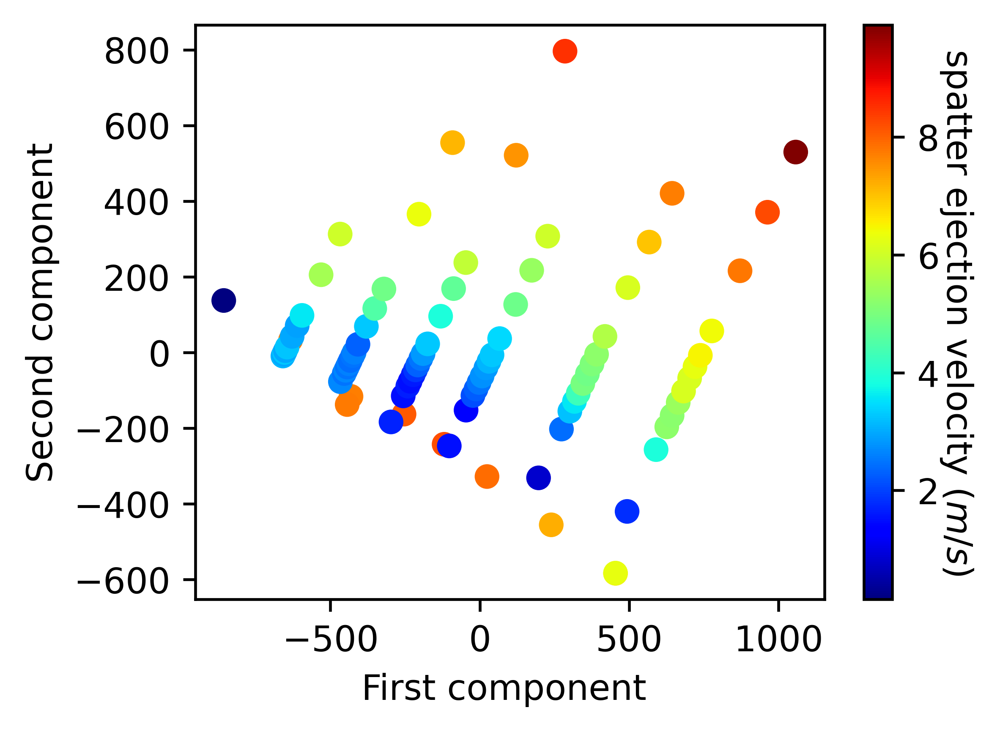

In [7]:
import numpy as np
import scipy.stats as st
%matplotlib inline
import    matplotlib.pyplot as    plt
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA

data = pd.read_csv('pcaspatter.csv')
#print(data)
velocity= data.iloc[:, 9]
print (velocity)
#velocity= velocity.dropna()
X= data.iloc[:, 1:9]
#print(X)
X= X.dropna()
print (X)
# mean0 = np.mean(cols, axis = 0)
# var0 = np.var(cols, axis = 0)
# print(var0)
# data = (cols - mean0)/var0
pca = PCA(n_components=2)
x_pca = pca.fit_transform(X)
print('Variance of each component:', pca.explained_variance_ratio_)   
print('Total variance explained:', round(sum(list(pca.explained_variance_ratio_))*100, 2))
#print(x_pca)
# fit0=pca.fit_transform(data, y=None)
# print(fit0)
fig= plt.figure(figsize=(4,3), dpi=600)
plt.scatter(x_pca[:,0], x_pca[:,1], c = velocity, cmap = 'jet')
plt.xlabel(r'First component ')
plt.ylabel(r'Second component')
cbar =plt.colorbar()
cbar.ax.set_ylabel(r'spatter ejection velocity ($m/s$)', rotation=270, labelpad=10)
#plt.title("PCA plot ")

0      82.98684
1      91.25000
2      92.61111
3     117.85710
4      85.29856
        ...    
92    136.05497
93    132.42698
94    135.02174
95    133.19959
96    135.60147
Name: angle mean, Length: 97, dtype: float64
Variance of each component: [0.77638948 0.2230221 ]
Total variance explained: 99.94


Text(0, 0.5, 'spatter ejection direction')

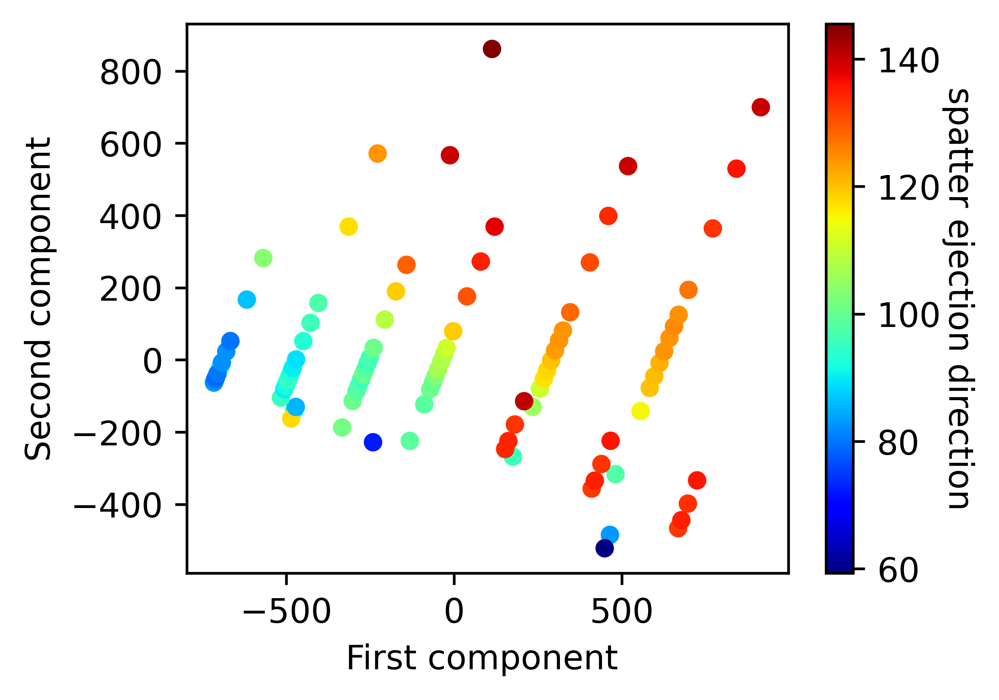

In [8]:
import numpy as np
import scipy.stats as st
%matplotlib inline
import    matplotlib.pyplot as    plt
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA

data = pd.read_csv('pcaspatter_angle.csv')
#print(data)
angle= data.iloc[:, 9]
print (angle)
#velocity= velocity.dropna()
X= data.iloc[:, 1:5]
#print(X)
X= X.dropna()
#print (X)
# mean0 = np.mean(cols, axis = 0)
# var0 = np.var(cols, axis = 0)
# print(var0)
# data = (cols - mean0)/var0
pca = PCA(n_components=2)
x_pca = pca.fit_transform(X)
#print(x_pca)
print('Variance of each component:', pca.explained_variance_ratio_)   
print('Total variance explained:', round(sum(list(pca.explained_variance_ratio_))*100, 2))
#print(x_pca)
# fit0=pca.fit_transform(data, y=None)
# print(fit0)
fig= plt.figure(figsize=(4,3), dpi=600)
plt.scatter(x_pca[:,0], x_pca[:,1], c = angle, cmap = 'jet', s=20)
plt.xlabel(r'First component ')
plt.ylabel(r'Second component')
cbar =plt.colorbar()
cbar.ax.set_ylabel(r'spatter ejection direction', rotation=270, labelpad=10)
#plt.title("PCA plot ")

## plotting results

## velocity

In [76]:
#  parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']


Test_accuracy = [0.92138, 0.90300, 0.97133, 0.94891, 0.97580, 0.88002, 0.65793]
Test_accuracy_std= [0.02565, 0.02912, 0.00830, 0.02770, 0.01375, 0.01717, 0.14977]


Test_mae = [0.40748, 0.47538 , 0.27007 , 0.34418, 0.23959, 0.60334 , 0.84961]
Test_mae_std = [0.07307, 0.03751, 0.05970, 0.07162, 0.04569, 0.01983, 0.10027]

Train_accuracy = [0.98890, 0.95036, 0.99170 , 1.00000,  0.99337, 0.91393, 0.78477]
Train_accuracy_std= [0.00240, 0.00603, 0.00053, 0.00000, 0.00102, 0.00422, 0.01593]


Train_mae = [0.16128, 0.39659, 0.15588 , 0.00074, 0.14429, 0.55359 , 0.77324]
Train_mae_std = [0.01632, 0.02585, 0.00860, 0.00021, 0.01588, 0.00667, 0.02771]

test_accu_min_velo=[0.79597, 0.84603,  0.77479, 0.78258, 0.81872, 0.75531, 0.76710]
test_accu_min_velo_std=[0.11235, 0.09364, 0.17052, 0.10594, 0.15361, 0.10943, 0.06724]

test_mae_min_velo=[0.55192,  0.47652, 0.45366, 0.52566, 0.40390, 0.67346, 0.68309]
test_mae_min_velo_std=[0.19454, 0.15893, 0.18313, 0.12163, 0.15212, 0.18650, 0.14282]

test_accu_max_velo=[0.88562, 0.90487, 0.87636, 0.87826, 0.87621, 0.86801, 0.85302]
test_accu_max_velo_std=[0.06802, 0.03452, 0.06100, 0.06720, 0.05487, 0.05070, 0.04415]

test_mae_max_velo=[0.55254, 0.57156, 0.55977, 0.51991, 0.53487, 0.71941, 0.75197]
test_mae_max_velo_std=[0.20510, 0.15565, 0.18702, 0.18297, 0.07747,  0.20130, 0.19939]



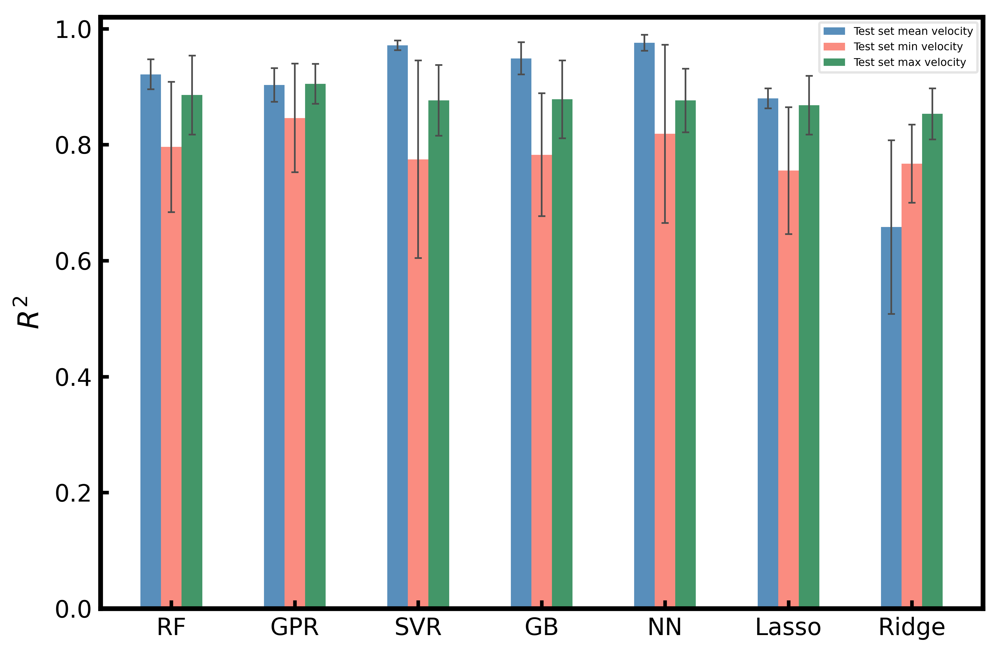

In [77]:
models = ['RF','GPR','SVR','GB','NN','Lasso','Ridge']

x = np.arange(len(models))  # the label locations
width = 0.5  # the width of the bars

fig, ax = plt.subplots(figsize = (6,4), dpi = 600)
widths = 2
ax = gca()
for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(widths)

    tick_width = 1.5
plt.tick_params(direction = 'in', width = tick_width)

rects1 = ax.bar(3*x - 1* width, Test_accuracy, width, yerr = Test_accuracy_std,error_kw = dict(ecolor= '0.3', lw=0.7, capsize=1.5, capthick=0.7), label='Test set mean velocity', color = 'steelblue', alpha =0.9 )
rects2 = ax.bar(3*x , test_accu_min_velo, width, yerr = test_accu_min_velo_std,error_kw = dict(ecolor= '0.3', lw=0.7, capsize=1.5, capthick=0.7), label='Test set min velocity', color = 'salmon', alpha =0.9 )
rects3 = ax.bar(3*x +1* width, test_accu_max_velo, width, yerr = test_accu_max_velo_std,error_kw = dict(ecolor= '0.3', lw=0.7, capsize=1.5, capthick=0.7), label='Test set max velocity', color = 'seagreen', alpha =0.9 )


ax.set_ylabel('$R^2$')
#ax.set_title('depth regression task, test set accuracy')
ax.set_xticks(3*x)
ax.set_xticklabels(models)
ax.set_ylim([0, 1.02])
ax.legend(loc = 'upper right',  fontsize = '4.5', framealpha = 0.5)

fig.tight_layout()
plt.show()

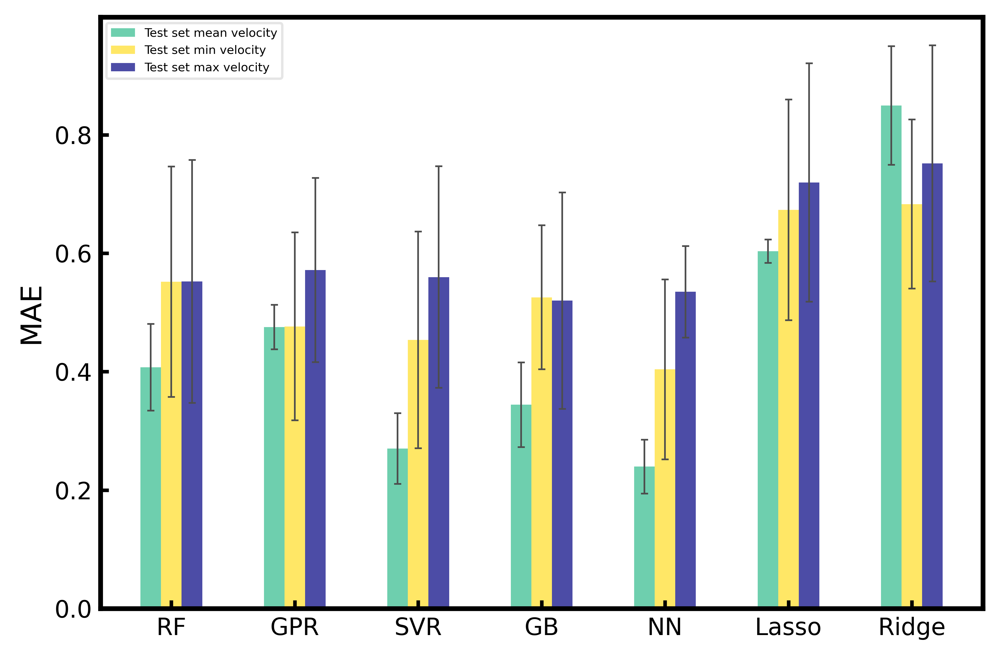

In [78]:
models = ['RF','GPR','SVR','GB','NN','Lasso','Ridge']

x = np.arange(len(models))  # the label locations
width = 0.5  # the width of the bars

fig, ax = plt.subplots(figsize = (6,4), dpi = 600)
widths = 2
ax = gca()
for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(widths)

    tick_width = 1.5
plt.tick_params(direction = 'in', width = tick_width)

rects1 = ax.bar(3*x - 1* width, Test_mae, width, yerr = Test_mae_std,error_kw = dict(ecolor= '0.3', lw=0.7, capsize=1.5, capthick=0.7), label='Test set mean velocity', color = 'mediumaquamarine', alpha =0.95 )
rects2 = ax.bar(3*x , test_mae_min_velo, width, yerr = test_mae_min_velo_std,error_kw = dict(ecolor= '0.3', lw=0.7, capsize=1.5, capthick=0.7), label='Test set min velocity', color = 'gold', alpha =0.6 )
rects3 = ax.bar(3*x +1* width, test_mae_max_velo, width, yerr = test_mae_max_velo_std,error_kw = dict(ecolor= '0.3', lw=0.7, capsize=1.5, capthick=0.7), label='Test set max velocity', color = 'navy', alpha =0.7 )


ax.set_ylabel('MAE')
#ax.set_title('depth regression task, test set accuracy')
ax.set_xticks(3*x)
ax.set_xticklabels(models)
#ax.set_ylim([0, 1.02])
ax.legend(loc = 'upper left',  fontsize = '5', framealpha = 0.5)

fig.tight_layout()
plt.show()

##  angle 

In [68]:
#  parameter_list = ['speed (mm/s)', 'power (w)', 'layer thickness', 'beam diameter', 'density','cp', 'k', 'melting point']



Test_accuracy = [0.85615, 0.68711,  0.73034, 0.85230, 0.88223 , 0.44247, 0.44701]
Test_accuracy_std= [0.07716, 0.13841, 0.10627,0.09841, 0.07637, 0.17146, 0.17066]


Test_mae = [4.60700, 6.91169 , 6.22538, 4.54049,4.15283, 9.67293, 9.71134]
Test_mae_std = [1.06138, 1.22609, 1.43847, 1.53616,  1.12494, 0.76833, 0.84789]

Train_accuracy = [0.97882, 0.78548 , 0.78259, 0.99996,  0.97655, 0.61035, 0.60978]
Train_accuracy_std= [0.00173, 0.01689, 0.02538, 0.00001, 0.00731, 0.01690, 0.01690]


Train_mae = [1.80081, 5.95159, 4.92775, 0.09931 , 1.58502, 8.97736, 9.03956]
Train_mae_std = [0.11314, 0.35581, 0.32473, 0.01443, 0.17357, 0.24832, 0.23656]

test_accu_min_angle=[0.85676, 0.70858,  0.72327, 0.83326,  0.50881, 0.63208, 0.63331]
test_accu_min_angle_std=[0.06086, 0.14309, 0.17764, 0.03939, 0.43012, 0.13256, 0.12770]

test_mae_min_angle=[5.72143, 7.83581, 6.92865, 6.07610, 7.85691, 9.47094, 9.45435]
test_mae_min_angle_std=[1.11598, 1.96611, 1.96370, 0.80757,  3.26965, 1.82174, 1.77390]

test_accu_max_angle=[0.79473,  0.64302, 0.67414, 0.84202, 0.60758, 0.40854, 0.40851]
test_accu_max_angle_std=[0.09956,  0.18512, 0.23154, 0.05300, 0.39344, 0.18554, 0.18148]

test_mae_max_angle=[5.79260, 7.58930, 6.15764, 5.02472, 7.19278, 10.90978, 10.91680]
test_mae_max_angle_std=[1.05363, 2.09058, 2.43565, 0.67480, 3.82939 ,1.98938, 1.95622]

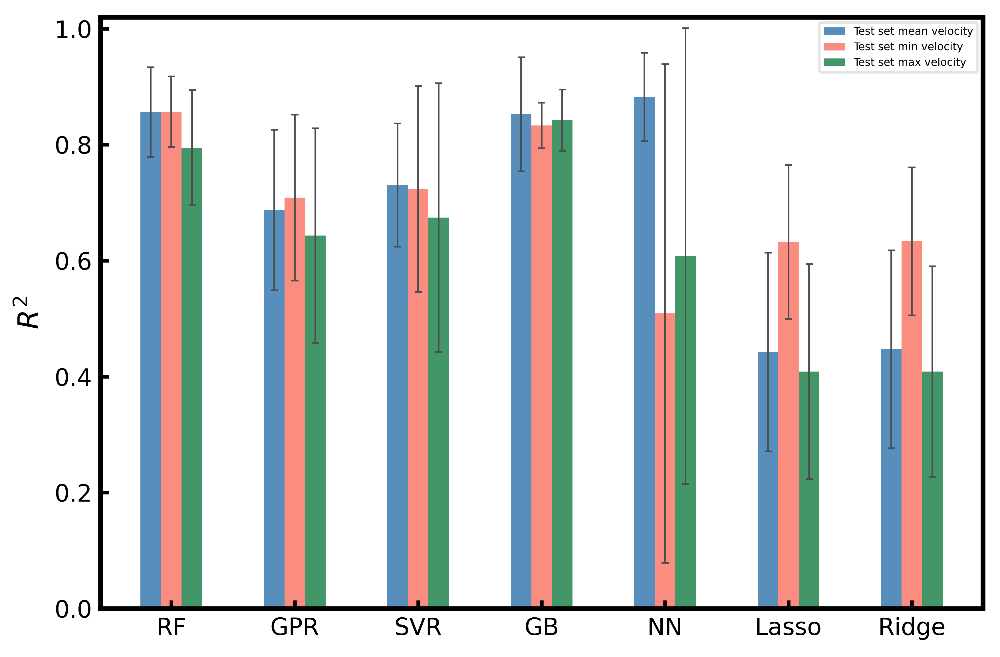

In [69]:
models = ['RF','GPR','SVR','GB','NN','Lasso','Ridge']

x = np.arange(len(models))  # the label locations
width = 0.5  # the width of the bars

fig, ax = plt.subplots(figsize = (6,4), dpi = 600)
widths = 2
ax = gca()
for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(widths)

    tick_width = 1.5
plt.tick_params(direction = 'in', width = tick_width)

rects1 = ax.bar(3*x - 1* width, Test_accuracy, width, yerr = Test_accuracy_std,error_kw = dict(ecolor= '0.3', lw=0.7, capsize=1.5, capthick=0.7), label='Test set mean velocity', color = 'steelblue', alpha =0.9 )
rects2 = ax.bar(3*x , test_accu_min_angle, width, yerr = test_accu_min_angle_std,error_kw = dict(ecolor= '0.3', lw=0.7, capsize=1.5, capthick=0.7), label='Test set min velocity', color = 'salmon', alpha =0.9 )
rects3 = ax.bar(3*x +1* width, test_accu_max_angle, width, yerr = test_accu_max_angle_std,error_kw = dict(ecolor= '0.3', lw=0.7, capsize=1.5, capthick=0.7), label='Test set max velocity', color = 'seagreen', alpha =0.9 )


ax.set_ylabel('$R^2$')
#ax.set_title('depth regression task, test set accuracy')
ax.set_xticks(3*x)
ax.set_xticklabels(models)
ax.set_ylim([0, 1.02])
ax.legend(loc = 'upper right',  fontsize = '4.5', framealpha = 0.5)

fig.tight_layout()
plt.show()

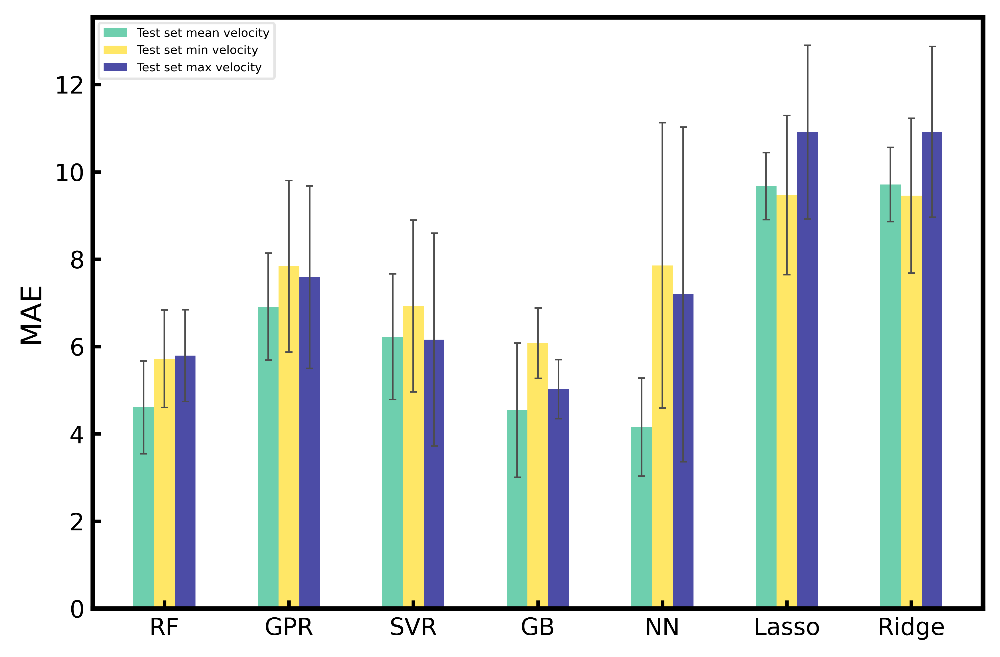

In [71]:
models = ['RF','GPR','SVR','GB','NN','Lasso','Ridge']

x = np.arange(len(models))  # the label locations
width = 0.5  # the width of the bars

fig, ax = plt.subplots(figsize = (6,4), dpi = 600)
widths = 2
ax = gca()
for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(widths)

    tick_width = 1.5
plt.tick_params(direction = 'in', width = tick_width)

rects1 = ax.bar(3*x - 1* width, Test_mae, width, yerr = Test_mae_std,error_kw = dict(ecolor= '0.3', lw=0.7, capsize=1.5, capthick=0.7), label='Test set mean velocity', color = 'mediumaquamarine', alpha =0.95 )
rects2 = ax.bar(3*x , test_mae_min_angle, width, yerr = test_mae_min_angle_std,error_kw = dict(ecolor= '0.3', lw=0.7, capsize=1.5, capthick=0.7), label='Test set min velocity', color = 'gold', alpha =0.6 )
rects3 = ax.bar(3*x +1* width, test_mae_max_angle, width, yerr = test_mae_max_angle_std,error_kw = dict(ecolor= '0.3', lw=0.7, capsize=1.5, capthick=0.7), label='Test set max velocity', color = 'navy', alpha =0.7 )


ax.set_ylabel('MAE')
#ax.set_title('depth regression task, test set accuracy')
ax.set_xticks(3*x)
ax.set_xticklabels(models)
#ax.set_ylim([0, 1.02])
ax.legend(loc = 'upper left',  fontsize = '5', framealpha = 0.5)

fig.tight_layout()
plt.show()